<a href="https://colab.research.google.com/github/Bouchra159/flood-monitoring/blob/main/Copie_de_CCAI_Tutorial_on_Flood_Monitoring_Part_I_People.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# MIT License
#
#@title Copyright (c) 2026 CCAI Community Authors { display-mode: "form" }
#
# Permission is hereby granted, free of charge, to any person obtaining a
# copy of this software and associated documentation files (the "Software"),
# to deal in the Software without restriction, including without limitation
# the rights to use, copy, modify, merge, publish, distribute, sublicense,
# and/or sell copies of the Software, and to permit persons to whom the
# Software is furnished to do so, subject to the following conditions:
#
# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.
#
# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL
# THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING
# FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER
# DEALINGS IN THE SOFTWARE.

# CCAI Tutorial on flood monitoring Part I: People
Authors:
*   Casper Fibaek, [ESA Φ-lab](https://philab.esa.int/), Casper.Fibaek@esa.int
*   Andreas Luyts, [ESA Φ-lab](https://philab.esa.int/), Andreas.Luyts@ext.esa.int
*   Nirdesh Kumar Sharma [Earthsense Labs](https://earthsenselabs.com/), nirdesh@earthsenselabs.com


**Prerequisites**:
1.   Basic understanding of Deep Learning and Remote Sensing.
2.   Familiarity with Python and geospatial data processing.

**Software requirements**:

We are going to use Google Colab. Some cloud storage is necessary to load the imagery.

**Goals**

* The purpose of this tutorial is to give an introduction to the use of Convolutional Neural Networks and Satellite Images for the climate science.
* The data will not be polished RGB data, which is often what is used in AI tutorials, but satellite data that comes with higher dimensions and modalities. The tutorial will introduce these datasets and showcase how they can be used to map structures and surface water in a simple way.

# Table of Contents


*   [Overview](#overview)
*   [Learning Objectives](#learning-objectives)
*   [Climate Impact](#climate-impact)
*   [Target Audience](#target-audience)
*   [Background & Prerequisites](#background-and-prereqs)
*   [Software Requirements](#software-requirements)
*   [Download the Data](#download-data)
*   [Data Description](#data-description)
*   [Methodology](#methodology)
*   [Results & Discussion](#results-and-discussion)
*   [The Carbon Cost of This Notebook](#carbon-cost)
*   [From Predictions to Decisions](#predictions-to-decisions)
*   [Limitations & Responsible Use](#limitations-responsible-use)
*   [References](#references)


<a name="overview"></a>
# Overview

Welcome to this tutorial on flood monitoring and management using Earth Observation and Artificial Intelligence, focusing on the Mediterranean region of Egypt. Floods in coastal areas can be extremely destructive natural hazards resulting in societal and economical damage. In recent years, Earth Observation data, particularly from the Copernicus Programme, has proven invaluable for taking appropriate measures before, during and after flooding events, as it provides a wealth of information on various aspects such as inundated areas, land use, elevation profile and population density. By integrating Artificial Intelligence techniques, we can further enhance the analysis and decision-making processes necessary to prevent or minimise loss in flooding events.

In this tutorial, we will delve into the various methodologies, tools, and applications of Earth Observation data from the Copernicus Programme, with a focus on the Sentinel satellites, for assessing and managing flooding events in Mediterranean Egypt. We will explore how Artificial Intelligence can be harnessed to process and analyze these vast datasets, extracting valuable insights and automating complex tasks. Through hands-on examples and case studies, you will learn how to apply these techniques to real-world scenarios, enabling you to contribute to the ongoing efforts in battling these extreme events.

The topics of floods prediction, monitoring and disaster management are vast. As is the use of Earth Observation for these tasks. This tutorial aims to serve as a starting point and inspiration for further studies.


<a name="learning-objectives"></a>
# Learning Objectives

By the end of this notebook you should be able to:

1. Load and visualise multi-band satellite data — Sentinel-1 SAR, Sentinel-2 multispectral, and a digital elevation model — as NumPy arrays, and explain why a raw satellite image cannot simply be displayed as an RGB picture.
2. Turn large geospatial rasters into patch-based training data for a convolutional network, and explain why the train/validation/test split must happen *before* patching.
3. Train a small convolutional network to predict building density from Sentinel-2 reflectance, and read its training and validation loss curves for signs of over- and underfitting.
4. Evaluate the result both as a regression (RMSE, MAE, MSE) and as a thresholded map (precision, recall, F1, IoU), and explain why accuracy alone is misleading on an unbalanced dataset.
5. Explain what building density is a proxy for, where that proxy breaks down, and who is most likely to be missed by it.
6. Measure the energy and carbon cost of your own training run, and describe how exposure maps feed into flood-risk and disaster-response decisions — and what they must not be used to decide.


<a name="climate-impact"></a>
# Climate Impact
Flooding is one of the most destructive natural hazards on the Earth that creates major economic and societal harm by damaging homes, disrupting critical infrastructure and degrading farmlands according to the [report published by United Nations Office for Disaster Risk Reduction](https://www.undrr.org/publication/human-cost-disasters-overview-last-20-years-2000-2019).
<br><br>
It can be challenging to connect floods to climate change due to the complex interplay of numerous factors, including both natural weather conditions and human actions. Additionally, historical data on floods is limited, making it difficult to compare past occurrences to current trends. However, as the IPCC (Intergovernmental Panel on Climate Change) noted in its [special report on extremes](https://www.ipcc.ch/site/assets/uploads/2018/03/SREX-Chap3_FINAL-1.pdf), there is clear indication that climate change has influenced several water-related variables, such as rainfall and snowmelt, that contribute to floods. While climate change may not directly cause floods, it does exacerbate many of the underlying factors. Global warming will keep increasing also river flood risk in the future resulting in more damage every year according to the [JRC](https://joint-research-centre.ec.europa.eu/system/files/2020-09/05_pesetaiv_river_floods_sc_august2020_en.pdf).
<br><br>

**Alexandria and climate risks** <br>
> Alexandria, located on the Mediterranean coast, is the second-largest city in Egypt and has a population of approximately 5.5 million. Alexandria and the Nile Delta are among the most vulnerable areas in the world to climate change. The UN’s Intergovernmental Panel on Climate Change predicts that global sea levels could rise by as much as 68cm by 2050, flooding parts of Alexandria and causing saltwater intrusion into the groundwater. It would also cause buildings to collapse and salination of farmland in the nearby Nile Delta region destroying livelihoods and triggering internal displacement. Reports suggest that even 50cm of sea-level rise would threaten 2 million people
in Alexandria, including Al Max. Increased temperatures driven by climate change are already affecting biodiversity in the Mediterranean Sea.

Continue reading about Alexandria and climate risks in the [Climate and mobility case study January 2023: Alexandria, Egypt: Al Max](https://reliefweb.int/report/egypt/climate-and-mobility-case-study-january-2023-alexandria-egypt-al-max).
<br>

For these reasons adequate flood risk assessment tools are essential to mitigate damage and save lives. Comprehensive flood risk assessments do not only take the chance of flooding into account but also the possible damages to land and the vulnerability of the people living there. It involves an analysis of which interventions would be most successful in reducing overall harm.
<br>

Satellite imagery and the methods to process them are invaluable tools in the ongoing effort to predict flood risk, proceed with damage control and evacuation in case of a flooding event and motivate policy and contruction works to prevent damage in the future.
<br>

In this tutorial we focus on how we can map surface water and the impact on human lives. However, the tools used to process satellite imagery and prepare them for machine learning tasks are very general and can be used for many other climate science problems.

<a name="target-audience"></a>
# Target Audience

*   Climate scientist seeking to get an introduction to machine learning tools. More specifically how to apply convolutional neural networks to satellite data.
*   Data scientist with little background in remote sensing but interested to explore how satellite data can be processed and used as training data for convolutional neural networks.

The audience of this notebook do not need to be experts neither in AI nor in climate science. There will however be ample oppurtunity for more experienced readers to dive deeper into the data and develop more complex AI pipelines.



<a name="background-and-prereqs"></a>
# Background & Prerequisites


## Population mapping and sea water flood risk assessment in coastal regions

**Population and vulnerable area mapping** is the process of creating a map of the number of people living in specific geographic areas and taking into account the land use as well. This includes for example identifying if the area is a farmland or heavily urbanised and mapping of schools, hospitals and other critical infrastructure. This information is essential for a variety of purposes, including emergency management planning, infrastructure development, and environmental conservation. By mapping the population and vulnerable areas in coastal regions, planners can identify areas where high population density may exacerbate flood risks and take measures to reduce the likelihood of damage to high priority areas such as hospitals and densely populated regions.

**Flood susceptibility maps** are maps describing the flooding tendencies of certain geographic areas based on its physical characteristics. This can include topographical, geographical, and meteorological factors (such as altitude, slope, lithology, land use, and rainfall). Based on these characteristics, areas can be classified as high risk or low risk.

**Flood inundation maps** on the other hand represent the extent of a flood after or during an event has occurred. These maps show what areas were effectively flooded. These maps help with disaster management, damage assessment and evacuation planning.

Access to this data is essential for making critical decisions before, during and after flooding events.
It provides a strong basis to motivate the building of dams and surge protection barriers.

## The role of satellite data in flood risk assessment.

Remote sensing data can be a great help to create these population maps, inundation maps and flood susceptibility maps.

Satellites play a crucial role in remote sensing, as they can capture images of large areas from space. **High-resolution multispectral images** obtained from satellites can be used to estimate population density and land use. This information is useful for disaster response planning and identifying vulnerable areas.

Satellites equipped with **Synthetic Aperture Radar** (SAR) instruments can create waterbody maps before and after flooding events. SAR is very sensitive to water, which makes it an effective tool for monitoring water levels and detecting changes in waterbodies. These maps can help in understanding the extent of flooding, the severity of flood damage, and in identifying areas at risk of flooding.

LiDAR satellites or a constellation of SAR satellites can provide information to create **Digital Elevation Models** (DEMs). A DEM is a 3D model of the topographic surface of an area, excluding trees, buildings, and any other objects on the surface. DEMs extremely useful for flood modelling and watershed analysis.







<a name="software-requirements"></a>
# Software Requirements

On Colab, make sure to **enable a GPU runtime** (should be enabled automatically, otherwise go to 'Runtime' in the upper taskbar and select 'change runtime type'. With a GPU the models will train much faster and their will be more RAM available for processing.

The Python version at the time of this submission in Colab = Python 3.10.11.

**The tools.**

* PyTorch
* Numpy
* Matplotlib
* Buteo
* CodeCarbon

Google Colab comes preinstalled with PyTorch and NumPy and matplotlib, so we only need to install buteo and codecarbon.

**Buteo** is a toolbox designed to simplify the process of working with geospatial data for Deep Learning. It includes tools for reading, writing, and processing geospatial data, as well as tools for creating labels from vector data and generating patches from geospatial data. Buteo makes it easy to ingest data, create training data, and perform inference on geospatial data. <br>
[Documentation](https://casperfibaek.github.io/buteo/buteo.html)

[![DOI](https://zenodo.org/badge/DOI/10.5281/zenodo.7936577.svg)](https://doi.org/10.5281/zenodo.7936577)

**CodeCarbon** is a lightweight library that estimates the electricity a piece of code consumes and converts it into CO₂-equivalent emissions. It samples the power draw of the CPU, GPU, and RAM while your code runs, turns that into kilowatt-hours, and multiplies by the carbon intensity of the electricity grid your machine is plugged into. We use it to put a number on what this notebook itself costs — a habit worth keeping in any climate-related ML project. Part II does the same, so you can compare the two.<br>
[Documentation](https://docs.codecarbon.io/)

In [2]:
# Install buteo
!pip install buteo==0.9.15 --upgrade -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.5/169.5 kB 8.4 MB/s eta 0:00:00


In [3]:
# Install CodeCarbon, to measure the energy and emissions of this notebook.
!pip install codecarbon==3.2.9 -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 388.9/388.9 kB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.6/155.6 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 50.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 30.4 MB/s eta 0:00:00


In [4]:
import buteo as beo
import numpy as np
import torch
import os

In [5]:
#@title This cell sets matplotlib parameters and defines plotting functions
# Data visualization
# This cell sets matplotlib parameters and defines plotting functions.
# You can safely ignore this cell as it only impacts printing functions.

# These functions are just for printing
# in colab.
import matplotlib
import matplotlib.patheffects as path_effects
from matplotlib import pyplot as plt
from collections.abc import Iterable

# Reset Matplotlib parameters to their default values
matplotlib.rcdefaults()

# Lets set some default pyplot parameters to make our plots look pretty.
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (16, 12)
plt.rcParams['figure.subplot.wspace'] = 0.05
plt.rcParams['image.interpolation'] = 'bilinear'

# Match the plot background to the Colab theme. Outside Colab (e.g. running
# this notebook locally) there is no such theme, so we fall back to light mode.
try:
    from google.colab import output
    is_dark = output.eval_js('document.documentElement.matches("[theme=dark]")')
except ImportError:
    is_dark = False

if is_dark:
    COLORMODE = "#38383838" # Are you using colab in darkmode?
else:
    COLORMODE = "#FFFFFFFF" # Or whitemode?

# Custom function for creating subplots with a specified face color
def custom_subplots(*args, facecolor=COLORMODE, size=None, **kwargs):
    fig, axes = plt.subplots(*args, **kwargs)

    if size is not None:
        fig.set_size_inches(size[0], size[1])

    # Make sure axes is a list of axes objects
    if not isinstance(axes, Iterable) or isinstance(axes, np.ndarray) and axes.ndim == 0:
        axes = [axes]

    for ax in axes:
        ax.set_xticks([])
        ax.set_yticks([])

        for spine in ax.spines.values():
            spine.set_edgecolor('black')
            spine.set_linewidth(1)

    # Reduce the distance between the plotted images in the width
    plt.subplots_adjust(wspace=0.05)

    # Change the background color of the whole plot to grey
    fig.set_facecolor(facecolor)  # RGBA tuple for grey, 100% transparent if supported

    axes = axes[0] if len(axes) == 1 else axes

    return fig, axes

<a name="download-data"></a>
# Download the data

Everything in this notebook runs on two data products, both hosted publicly and free to use:

| What | Files | Where it ends up | Used for |
|---|---|---|---|
| **78 training tiles** | `patches_middle-east.zip`, which unpacks to `label_*.tif`, `s2_*.tif`, `s1_*.tif`, `dem_*.tif` | `/content/CCAI_FLOODS_TUTORIAL_DATA/` | Training and testing the building-density model |
| **Full Alexandria scene** | `S2.tif` (required), `S1.tif` (Part II) | `/content/` | Predicting over the whole city at the end of the notebook |

There are several gigabytes in total, so the download takes a few minutes. We provide two routes — run **one** of them, then the verification cell at the end of this section:

* **Option 1 — Google Drive.** Try this first; it is the fastest and fetches only the files you need.
* **Option 2 — Zenodo.** A single archive with everything, used as a backup when the Drive links hit their download quota.

**A note on where the files live**: everything is written under `/content/`, which is the local disk of the Colab virtual machine. It is wiped whenever the runtime is recycled or you disconnect for a while — if that happens, re-run this section. Nothing is written to your own Google Drive and you are never asked to mount it.


## Option 1 — Google Drive

In [6]:
# All the paths used by this notebook are defined here, in one place.
# Everything lives on the Colab VM's local disk (/content), not in your own Drive.

# The 78 training tiles: label_*.tif, s1_*.tif, s2_*.tif, dem_*.tif
data_folder = "/content/CCAI_FLOODS_TUTORIAL_DATA"

# The full Alexandria scene, used for inference at the end of the notebook.
PATH_S2 = "/content/S2.tif"  # Required by this notebook.
PATH_S1 = "/content/S1.tif"  # Not used in Part I; downloaded here ready for Part II.

# Our own outputs (the trained model and the predicted rasters) go here.
FOLDER_PRED = "/content/CCAI_FLOODS_TUTORIAL_DATA_PREDICTIONS/"

os.makedirs(data_folder, exist_ok=True)
os.makedirs(FOLDER_PRED, exist_ok=True)

In [7]:
# Download the archive with the 78 training tiles.
# gdown keeps the file name stored in Drive, so this lands at
# /content/patches_middle-east.zip
!gdown https://drive.google.com/uc?id=1N-vOm_rBPXM4CbXTdHhKfjYSeJd93sL0

Downloading...
From (original): https://drive.google.com/uc?id=1N-vOm_rBPXM4CbXTdHhKfjYSeJd93sL0
From (redirected): https://drive.google.com/uc?id=1N-vOm_rBPXM4CbXTdHhKfjYSeJd93sL0&confirm=t&uuid=8192c2d5-1c7f-466f-95cb-6e0ffc20b500
To: /content/patches_middle-east.zip
100% 395M/395M [00:06<00:00, 56.6MB/s]


In [8]:
# Unpack the tiles into data_folder (/content/CCAI_FLOODS_TUTORIAL_DATA/).
# The .tif files sit at the root of the archive, so after this the tiles are
# directly at /content/CCAI_FLOODS_TUTORIAL_DATA/label_0.tif, s2_0.tif, ...
!unzip -oq /content/patches_middle-east.zip -d /content/CCAI_FLOODS_TUTORIAL_DATA/

Now the full Alexandria scene. Again `gdown` preserves the file names, so these two downloads land at `/content/S1.tif` and `/content/S2.tif`.

`S2.tif` is the one Part I needs — it is what we run the trained model over at the end of the notebook. `S1.tif` is not used here; it is downloaded so it is already in place for the exercises and for Part II. Skip that cell if you are short on disk space or time.


In [9]:
# S1.tif -> /content/S1.tif (optional in Part I, needed in Part II)
!gdown https://drive.google.com/uc?id=1LrakuW_RVA8KVsls4NyesnG4pFmxu7eS

Downloading...
From (original): https://drive.google.com/uc?id=1LrakuW_RVA8KVsls4NyesnG4pFmxu7eS
From (redirected): https://drive.google.com/uc?id=1LrakuW_RVA8KVsls4NyesnG4pFmxu7eS&confirm=t&uuid=a031e6de-d35f-4c68-ac92-169f606b45aa
To: /content/S1.tif
100% 819M/819M [00:07<00:00, 110MB/s]


In [10]:
# S2.tif -> /content/S2.tif (required: full-scene prediction at the end)
!gdown https://drive.google.com/uc?id=1lrvPBJXHYmA6Xcd9bklNRHjcP9e_zQvQ

Downloading...
From (original): https://drive.google.com/uc?id=1lrvPBJXHYmA6Xcd9bklNRHjcP9e_zQvQ
From (redirected): https://drive.google.com/uc?id=1lrvPBJXHYmA6Xcd9bklNRHjcP9e_zQvQ&confirm=t&uuid=b5315a94-83cd-4049-827a-4db7e04abe80
To: /content/S2.tif
100% 1.53G/1.53G [00:24<00:00, 63.4MB/s]


## Option 2 — Zenodo (backup)

The Google Drive links are quota-limited: when many people run the tutorial at the same time, Drive can refuse to serve the files. The same data is archived on Zenodo, which has no such limit:

**Alexandria — People and Water dataset**, DOI [10.5281/zenodo.7937444](https://doi.org/10.5281/zenodo.7937444)

It is a single 5.0 GB archive, `Alexandria_S12DEM.zip`, containing `S1.tif`, `S2.tif`, `DEM_Orientation.tif` and the 78 training tiles. Uncomment and run the two cells below: the first downloads the archive, the second sorts its contents into exactly the same paths that Option 1 produces, so the rest of the notebook works unchanged. Expect this to be slower than the Drive route — it downloads everything, including data Part I does not use.


In [11]:
# !wget -O /content/Alexandria_S12DEM.zip https://zenodo.org/record/7937444/files/Alexandria_S12DEM.zip

In [12]:
# import glob
# import shutil
# import zipfile
#
# # Extract to a staging folder first. The internal layout of the archive may
# # differ from the Drive downloads, so we sort the files into place ourselves
# # rather than assuming a folder structure.
# STAGING = "/content/zenodo_extract"
# with zipfile.ZipFile("/content/Alexandria_S12DEM.zip", "r") as zip_ref:
#     zip_ref.extractall(STAGING)
#
# # The 78 tiles are named label_*.tif / s1_*.tif / s2_*.tif / dem_*.tif.
# # They belong in data_folder.
# for path in glob.glob(os.path.join(STAGING, "**", "*.tif"), recursive=True):
#     name = os.path.basename(path)
#     if name.split("_")[0] in ("label", "s1", "s2", "dem"):
#         shutil.move(path, os.path.join(data_folder, name))
#
# # The full scenes keep their own names at the top level of /content/.
# for path in glob.glob(os.path.join(STAGING, "**", "*.tif"), recursive=True):
#     name = os.path.basename(path)
#     if name in ("S1.tif", "S2.tif", "DEM_Orientation.tif"):
#         shutil.move(path, os.path.join("/content", name))
#
# shutil.rmtree(STAGING, ignore_errors=True)

## Check that the data is where the notebook expects it

Whichever option you used, run the cell below before continuing. It counts the tiles and confirms that the full scene is in place.


In [13]:
# Verify the download.
from glob import glob

print(f"Tiles in {data_folder}:")
for kind in ["label", "s2", "s1", "dem"]:
    n_files = len(glob(os.path.join(data_folder, f"{kind}_*.tif")))
    status = "OK" if n_files == 78 else "<-- expected 78, re-run the download above"
    print(f"  {kind + '_*.tif':<12} {n_files:>3} files   {status}")

print("\nFull scene:")
for path, required in [(PATH_S2, True), (PATH_S1, False)]:
    if os.path.exists(path):
        print(f"  {path}   {os.path.getsize(path) / 1e9:.2f} GB   OK")
    else:
        note = "needed for the full-scene prediction" if required else "only needed for Part II"
        print(f"  {path}   MISSING   <-- {note}")


Tiles in /content/CCAI_FLOODS_TUTORIAL_DATA:
  label_*.tif   78 files   OK
  s2_*.tif      78 files   OK
  s1_*.tif      78 files   OK
  dem_*.tif     78 files   OK

Full scene:
  /content/S2.tif   1.53 GB   OK
  /content/S1.tif   0.82 GB   OK


<a name="data-description"></a>
# Data Description

Copernicus is the Earth Observation programme headed by the European Commission in partnership with ESA. It provides accurate, timely and easily accessible information to improve the management of the environment, understand and mitigate the effects of climate change and ensure civil security. We will be using the freely available data from the Sentinel missions and the Copernicus DEM.




## Project data

The project data comprises of 78 locations covering Alexandria and the surrounding Nile delta in Egypt, each encompassing several square kilometers.

For each location, the following data are available:

**Sentinel-1**: There are 2 available bands which are the VV and VH bands. VV is the mode that transmits vertical waves and receives vertical waves to create the SAR image while VH is the mode that transmits vertical waves and receives horizontal waves. The data has already been despeckled and processed to contain values in $dB$.

**Sentinel-2**: There are 9 available bands. These bands are: 2-Blue, 3-Green, 4-Red, 5-RedEdge1, 6-RedEdge2, 7-RedEdge3, 8-NIR, 11-SWIR1, 12-SWIR2. Notice that band 8A-RedEdge is not supplied. These images are not normalised yet, but we will see how to work and visualise them later on.

**CopDEM**: The Copernicus DEM has 4 channels. The actual elevation in meters is stored in the 4th channel. The first 2 channels store the direction (aspect in sin/cos) the slope is facing while the 3rd channel has the actual slope. All the four channels are in the range [0-1] with channel 4 normalised to the height of Mt. Everest.

**Buildings labels**: This is the ground truth used for the building density prediction task (building density serves as proxy for population density). The labels are expressed of number of squared meters of building on a given pixel. Values are between 0-100 $m^2$ and for a resolution of 10$m$ this reflect the percentage of coverage. This data is a combination of the Google Open Buildings dataset, OSM buildings and manual labeling.
<br><br>
Further information about the imagery sources are below:

## Sentinel-1: Synthetic Aperture Radar (SAR) data
SENTINEL-1 is an imaging radar mission providing continuous all-weather, day-and-night imagery at C-band at a resolution of about 10m every 12 days. Sentinel-1 is a phase-preserving dual polarisation SAR system. It can transmit a signal in either horizontal (H) or vertical (V) polarisation, and then receive in both H and V polarisations.

SAR sensors are able to detect flooding because flat surfaces reflect (acts as a specular reflector) the signal away from the sensor, decreasing the amount of returned radiation. This causes relatively dark pixels in radar data for water areas which contrast with non-water areas.

Speckle is a general phenomenon in SAR imagery caused by the interaction of the out-of-phase waves reflected from a target resulting in a salt-and-pepper pattern. Presence of speckle in SAR images degrades the interpretability of the land features in the data. Speckle removal is necessary for quantitative, analysis and there are various filters but there exists a tradeoff between speckle removal and resolution. The images we use have already been despeckled and processed to dB values.

## Sentinel-2: Multispectral data

SENTINEL-2 is a wide-swath, high-resolution, multi-spectral imaging mission, supporting Copernicus Land Monitoring studies, including the monitoring of vegetation, soil and water cover, as well as observation of inland waterways and coastal areas. Most importantly for us is the MultiSpectral Instrument (MSI), which samples 13 spectral bands: four bands at 10 metres, six bands at 20 metres and three bands at 60 metres spatial resolution. These include the Blue, Green and Red bands which correspond to how humans see the world but also Near Infrared (NIR) and Short-wave Infrared (SWIR) which can be used to monitor vegetation, geological features and much more.

Sentinel-2 images are very valuable for population density estimations and the mapping of vulnerable areas. The infrared bands are effective to differentiate between different types of land use while the Red band is used for mapping man-made structures. The high resolution RGB images can be used to detect schools, hospitals and other vulnerable areas.

The bands in this tutorial are ordered like this:

0. Blue
1. Green
2. Red
3. RedEdge 1
4. RedEdge 2
5. RedEgde 3
6. Near-Infrared
7. SWIR 1
8. SWIR 2

<img src='https://drive.google.com/uc?id=1Uj6bTFDFMpn_s_ksgn4WAQKYK-Ct9jMD' width="600"/><br>
<em>RGB image from the MSI instrument. East Jerusalem.</em>
<br><br>

## Copernicus DEM: Digital Elevation Model data

The Copernicus DEM is a Digital Surface Model (DSM) that represents the surface of the Earth including buildings, infrastructure and vegetation. The Copernicus DEM provides digital elevation maps for Egypt at a resolution of 30m. Data to create the DEM were acquired through the TanDEM-X mission.

As one can image, DEM’s are often used for flood prediction. DEMs can be used to create flood inundation maps, which show how water will spread across the landscape during a flood event. By combining a DEM with hydrological modeling, it is possible to simulate flood events and create maps that show which areas will be affected by flooding and to what extent. DEMs can also be used to identify natural features that can affect flooding, such as ridges, valleys, and drainage basins.

<br>
<img src='https://drive.google.com/uc?id=1XaZh1Z_Q6nw-3RW9IpHAUfEprtSEKiGR' width="600"/><br>
<em>Aspect-slope image derived from DEM. East Jerusalem. </em>

## Where the files are on disk

| Path | Contents | Used for |
|---|---|---|
| `/content/CCAI_FLOODS_TUTORIAL_DATA/label_*.tif` | 78 building-density labels, 1 band, 0–100 m² per pixel | Training targets |
| `/content/CCAI_FLOODS_TUTORIAL_DATA/s2_*.tif` | 78 Sentinel-2 tiles, 9 bands | Model input |
| `/content/CCAI_FLOODS_TUTORIAL_DATA/s1_*.tif` | 78 Sentinel-1 tiles, 2 bands (VV, VH) | Exercises (multi-modal input) |
| `/content/CCAI_FLOODS_TUTORIAL_DATA/dem_*.tif` | 78 Copernicus DEM tiles, 4 bands | Exercises |
| `/content/CCAI_FLOODS_TUTORIAL_DATA/train.npz`, `val.npz`, `test.npz` | *Written by this notebook*: normalised patches, split by tile | Training, validation and evaluation |
| `/content/S2.tif` | The full Sentinel-2 scene over Alexandria | Prediction over the whole city |
| `/content/S1.tif` | The full Sentinel-1 scene | Part II |
| `/content/CCAI_FLOODS_TUTORIAL_DATA_PREDICTIONS/` | *Written by this notebook*: `model_01.pt`, `prediction_*.tif` | Outputs to download and open in QGIS |

The tiles and the full scene are not disjoint: some of the 78 tiles fall inside the area covered by `S2.tif`. Keep that in mind when you look at the final full-scene map — part of it covers pixels the model was trained on, so it is a demonstration of large-scale inference, not an independent evaluation.

## Dataset datasheet

A summary of the data you are about to train on. Read it before trusting any map you produce from it.

| | Sentinel-1 tiles | Sentinel-2 tiles | Copernicus DEM tiles | Building labels |
|---|---|---|---|---|
| **What it is** | C-band SAR backscatter in dB, VV and VH (2 bands) | Multispectral reflectance, 9 bands (Blue … SWIR2), uint16 digital numbers | Aspect (sin, cos), slope, and elevation (4 bands, all scaled to 0–1) | Building area per pixel, 0–100 m² |
| **Source** | Copernicus Sentinel-1 (ESA) | Copernicus Sentinel-2 (ESA) | Copernicus DEM (ESA) | Google Open Buildings + OpenStreetMap + manual labelling |
| **Spatial resolution** | 10 m | 10 m (the 20 m bands resampled to 10 m) | 30 m, resampled | 10 m |
| **Coverage** | 78 tiles over Alexandria and the surrounding Nile delta, a few km² each | the same 78 tiles | the same 78 tiles | the same 78 tiles |
| **Temporal coverage** | One acquisition per tile | One acquisition per tile, not necessarily the same date as the S1 tile | Static | Compiled from sources of varying dates |
| **Preprocessing** | Despeckled, calibrated to dB; nodata filled with 0 | None (raw DN); we clip to 0–10 000 and scale in this notebook | Already normalised | Clipped to 0–100, NaNs set to 0 |
| **License** | Free and open (Copernicus data policy) | Free and open (Copernicus data policy) | Free and open | Google Open Buildings: CC BY 4.0 / ODbL; OpenStreetMap: ODbL |
| **Distribution** | Zenodo DOI [10.5281/zenodo.7937444](https://doi.org/10.5281/zenodo.7937444) | same | same | same |

**Known issues to keep in mind:**

* **Building density is a proxy for population, not a measurement.** A warehouse, an office block, and a crowded apartment building look much the same from above. Any statement about *people* derived from these labels inherits that gap.
* **Label noise, unevenly distributed.** The footprints come from automatically-derived and crowd-sourced sources. They are most often missing or misaligned in informal settlements and rapidly growing peri-urban areas — which are frequently the places with the highest flood exposure. The model will be least reliable exactly where the stakes are highest.
* **One region, few dates.** Everything is Alexandria and the Nile delta. A model trained here will not transfer freely to other cities, climates, or building styles without retraining and re-validation.
* **The test split is geographic but not independent.** We hold out whole tiles (better than holding out patches), but neighbouring tiles share land cover and acquisition conditions, so the reported metrics are optimistic relative to a genuinely new region.
* **Nodata is filled with zeros**, which are indistinguishable from genuine zeros (no buildings, or zero backscatter).
* **The tiles are not all in Alexandria.** Their georeferencing puts the 78 tile centroids between **25.2°E and 35.1°E** (from Egypt's western coast to the Levant, 30.7–32.3°N), in more than one UTM zone. The full scene `S2.tif` is the one centred on Alexandria (30.0°E, 31.2°N). The whole-city map is therefore partly a transfer to a region the model has seen only a few tiles of (see solution S6).
* **The DEM tiles contain undeclared `-9999` nodata values** (found while solving exercise S5). Because the files don't declare them as nodata, `raster_to_array(..., filled=True)` leaves them in place, so the "already normalised" DEM patches are not all in [0, 1]. Anyone who adds the DEM to the model must mask them first (see solution S5).
* **S1/S2 temporal mismatch**: the radar and optical tiles are not always from the same date, which matters if you extend the model to use both.

<a name="methodology"></a>
# Methodology

We are going to investigate water and population using Sentinel 1, 2, and the CopDEM. The methodology will be kept simple, but there is a lot of room for data exploration and the full dataset for the mediterranean region of Egypt is available. The methods will be divided into 3 steps. The last 2 steps will be done in a seperate notebook because of memory constraints within Colab.

1. Estimation of population and structure density using a Convolutional Neural Network (Part I).
2. Mapping water using an index based approach for Sentinel 2 (Part II).
3. Using the water index (NDWI) from the previous step, we will train a Convolutional Neural Network to estimate water using Sentinel 1. This is highly useful in the case of flooding, which is usually accompanied by poor weather conditions, which make the use of spectral instruments impossible (Part II).

## Constants

Let's gather the settings we need throughout the notebook in one place. Setting `SEED` makes the run reproducible; the rest control how the data is cut into patches and how the model is trained. Every one of them is worth experimenting with — and the carbon tracker in the next cell will tell you what your experiments cost.


In [14]:
# ML training constants. Please explore adjusting these - on Colab this cell
# renders as an interactive form, so you can change the values without editing code.
EPOCHS = 10 #@param {type:"slider", min:1, max:25, step:1}
PATCH_SIZE = 32 #@param {type:"raw"}
BATCH_SIZE = 16 #@param {type:"raw"}
N_OFFSETS = 3 #@param {type:"raw"}
LEARNING_RATE = 0.001 #@param {type:"number"}
SEED = 17 #@param {type:"raw"}

# PATCH_SIZE: training patches of 32x32 pixels - small enough to keep RAM use modest.
# BATCH_SIZE: patches per batch. N_OFFSETS: extra patch grids offset by (8,8), (16,16)
# and (24,24), so each pixel is sampled several times in different positions.

# Seed the random number generators so that runs are reproducible.
# (Full determinism on a GPU would additionally require
# torch.use_deterministic_algorithms(True), at some cost in speed.)
import random
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)


## Measuring the carbon cost of our own compute

This notebook is about the climate — so it is only fair to ask what the notebook itself costs. Training and running models consumes electricity, and electricity carries emissions. For a small model like ours the number will be tiny, but the *habit* is what matters: reporting energy and emissions alongside accuracy is becoming standard practice in machine-learning papers, and several venues now ask for it explicitly.

We use [CodeCarbon](https://docs.codecarbon.io/) for this. It works in three steps:

1. While your code runs, it samples the power draw of the CPU, GPU, and RAM (in watts).
2. Power × time gives the energy consumed, in kilowatt-hours (kWh).
3. Energy × the **carbon intensity** of your local electricity grid (grams of CO₂-equivalent per kWh) gives the emissions. That second factor is not a detail: the same kWh emits several times more CO₂ in a coal-heavy grid than in one dominated by hydro, wind, or nuclear power.

The cell below starts a tracker and defines two small helpers, `track_start` and `track_stop`, which we wrap around the two expensive phases of this notebook: **training the model** and **running inference over the whole Alexandria scene**. At the end of the notebook we print a summary. If you would rather not track anything, set `TRACK_EMISSIONS` to `False` — the helpers then quietly do nothing and the rest of the notebook is unaffected.


In [15]:
#@title Start the carbon tracker { display-mode: "form" }
TRACK_EMISSIONS = True #@param {type:"boolean"}

from codecarbon import EmissionsTracker

# If you re-run this cell, stop the previous tracker first so we do not leave a
# measurement thread running in the background.
if globals().get("emissions_tracker") is not None:
    try:
        emissions_tracker.stop()
    except Exception:
        pass

emissions_tracker = None
emission_tasks = {}  # phase name -> measurement, filled in by track_stop()

if TRACK_EMISSIONS:
    try:
        emissions_tracker = EmissionsTracker(
            project_name="ccai-flood-part1-people",
            output_dir=FOLDER_PRED,      # emissions.csv lands next to the predictions
            output_file="emissions.csv",
            measure_power_secs=5,        # sample the hardware every 5 seconds
            log_level="error",           # keep the notebook output readable
            allow_multiple_runs=True,    # cells get re-run in notebooks
        )
        emissions_tracker.start()
    except Exception as error:
        print(f"CodeCarbon could not start ({error}). Continuing without tracking.")
        emissions_tracker = None


def track_start(phase_name):
    """Start measuring a named phase. Does nothing if tracking is switched off."""
    if emissions_tracker is not None:
        emissions_tracker.start_task(phase_name)


def track_stop(phase_name):
    """Stop measuring the current phase, remember it, and print its footprint."""
    if emissions_tracker is None:
        return None

    measurement = emissions_tracker.stop_task()
    emission_tasks[phase_name] = measurement

    print(
        f"{phase_name}: {measurement.duration:.1f} s, "
        f"{measurement.energy_consumed * 1000:.2f} Wh, "
        f"{measurement.emissions * 1000:.2f} g CO2eq"
    )
    return measurement


[codecarbon WARNING @ 18:15:48] Multiple instances of codecarbon are allowed to run at the same time.


# Data Exploration


There are 78 tiles of data, each containing the Digital Elevation Model (In Orientation Format), Sentinel-1, Sentinel-2, and building labels.

**Lets investigate the data:**

To turn the data given tif-format into a NumPy array that is easy to manipulate, we use the `raster_to_array` function from the buteo library.

In [16]:
print("Shapes are in the form (height, width, channels)")

# data_folder was defined in the download section above:
# /content/CCAI_FLOODS_TUTORIAL_DATA

example_label_path = os.path.join(data_folder, "label_3.tif")
example_label = beo.raster_to_array(example_label_path)

example_dem_path = os.path.join(data_folder, "dem_3.tif")
example_dem = beo.raster_to_array(example_dem_path)

example_s1_path = os.path.join(data_folder, "s1_3.tif")
example_s1 = beo.raster_to_array(example_s1_path)

example_s2_path = os.path.join(data_folder, "s2_3.tif")
example_s2 = beo.raster_to_array(example_s2_path)

example_s2_RGB_path = os.path.join(data_folder, "s2_3.tif")
example_s2_RGB = beo.raster_to_array(example_s2_path, bands=[3, 2, 1]) # Select only RGB in that order.


Shapes are in the form (height, width, channels)


/usr/local/lib/python3.13/dist-packages/osgeo/gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


In [17]:
print(f"{example_label.shape}: Label shape.")
print(f"{example_dem.shape}: Digital Elevation Model shape.")
print(f"{example_s1.shape}: Sentinel 1 shape.")
print(f"{example_s2.shape}: Sentinel 2 shape.")
print(f"{example_s2_RGB.shape}: Sentinel 2 RGB shape.")

(1120, 1888, 1): Label shape.
(1120, 1888, 4): Digital Elevation Model shape.
(1120, 1888, 2): Sentinel 1 shape.
(1120, 1888, 9): Sentinel 2 shape.
(1120, 1888, 3): Sentinel 2 RGB shape.


In [18]:
# To read the metadata of the tiles use the raster_to_metadata function
example_label_meta = beo.raster_to_metadata(example_label_path)
for idx, (key, value) in enumerate(example_label_meta.items()):

    # Some of these strings are long, Lets show only the first parts.
    val = str(value) if len(str(value)) < 50 else str(value)[:50] + "..."
    print(f"{key}: {val}")

path: /content/CCAI_FLOODS_TUTORIAL_DATA/label_3.tif
basename: label_3.tif
name: label_3
folder: /content/CCAI_FLOODS_TUTORIAL_DATA
ext: .tif
in_memory: False
driver: GTiff
projection_osr: PROJCS["WGS 84 / UTM zone 36N",
    GEOGCS["WGS 84...
projection_wkt: PROJCS["WGS 84 / UTM zone 36N",GEOGCS["WGS 84",DAT...
geotransform: (690680.0, 10.0, 0.0, 3523400.0, 0.0, -10.0)
size: (1888, 1120)
shape: [1120, 1888, 1]
height: 1120
width: 1888
pixel_size: (10.0, 10.0)
pixel_width: 10.0
pixel_height: 10.0
origin: (690680.0, 3523400.0)
origin_x: 690680.0
origin_y: 3523400.0
centroid: [9440.0, 5600.0]
centroid_latlng: [0.05051434180822802, 28.595832243212154]
bbox: [690680.0, 709560.0, 3512200.0, 3523400.0]
bbox_gdal: [690680.0, 3512200.0, 709560.0, 3523400.0]
bbox_latlng: [31.726061354497087, 31.83034816464621, 35.0126554...
bounds_latlng: POLYGON ((31.7293629693438 35.0126554241882 0,31.7...
x_min: 690680.0
x_max: 709560.0
y_min: 3512200.0
y_max: 3523400.0
bands: 1
dtype_gdal: 6
dtype: float32
d

## Visualising Labels

Visualise the labels which contain the building density ranging from 0-100$m^2$ per pixel.


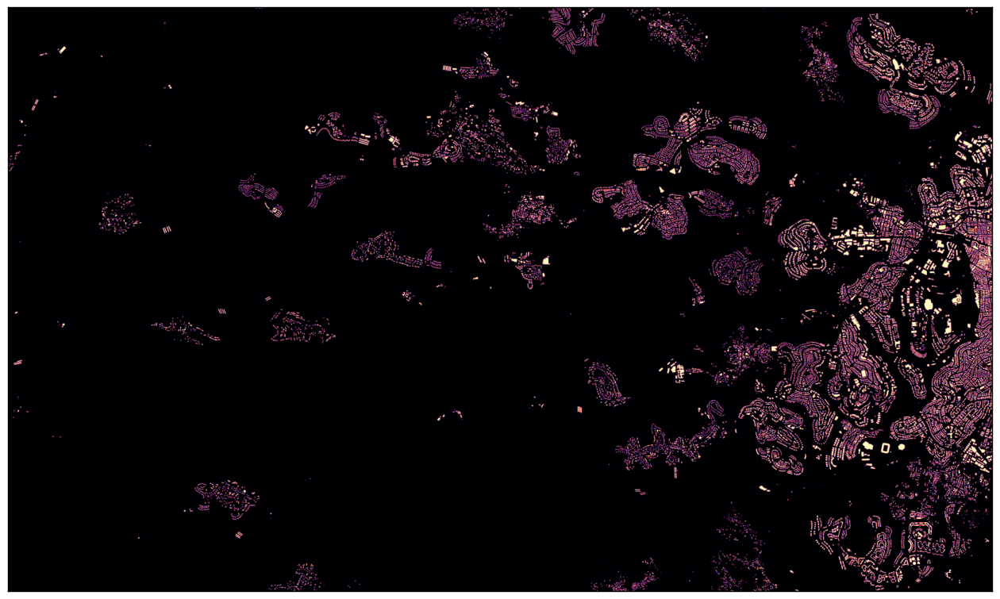

In [19]:
# Lets see what the building labels looks like!
# remember that the value of the labels reflects the percentage of building coverage in the given pixel.
# That means the values of the labels go from [0, 100] inclusive. The brighter the pixel, the more of it
# is covered by structures.
fig, ax1 = custom_subplots()
ax1.imshow(example_label[:, :, 0], vmin=0, vmax=100, cmap="magma")
plt.show()
fig.clf()

## Visualising hyperspectral images

Visualising hyperspectral data is not always an easy task. We are used to see images displayed in RGB (Red-Green-Blue) and 8-bit, which typically have values in the range 0-255. To get to this point from the original hyperspectral image (which comes as 16 bit images) we need to select the rights bands and process them before we can display a nice RGB image. Here is one way to do so!

**Note**: *For some optical satellites, RGB bands might not be available*

In [20]:
# Rendering hyperspectral images as RGB can be troublesome. Here is a methodology
# Lets define it as a function so we can reuse it later.

# Clip the top and bottom 2% of the data to not normalise to outliers.
def clip_to_quantiles(arr, q_min=0.02, q_max=0.98):
    return np.clip(arr,
        np.nanquantile(arr, q_min),
        np.nanquantile(arr, q_max),
    )

def render_s2_as_rgb(arr):
    # If there are nodata values, lets cast them to zero.
    if np.ma.isMaskedArray(arr):
        arr = np.ma.getdata(arr.filled(0))

    # Select only Blue, green, and red.
    # We copy as float32, so that we neither modify the caller's array in place
    # nor lose precision doing integer division on the original uint16 data.
    rgb_slice = arr[:, :, 0:3].astype(np.float32, copy=True)

    # Clip the data to the quantiles, so the RGB render is not stretched to outliers,
    # Which produces dark images.
    for c in [0, 1, 2]:
        rgb_slice[:, :, c] = clip_to_quantiles(rgb_slice[:, :, c])

    # We want an uint8 RGB render, so we normalise each layer by dividing with
    # the maximum value in the image. Then we multiply it by 255 (the max of
    # uint8) to be in the normal RGB range.
    for c in [0, 1, 2]:
        rgb_slice[:, :, c] = (rgb_slice[:, :, c] / np.amax(rgb_slice[:, :, c])) * 255.0

    # We then round to the nearest integer and cast it to uint8.
    rgb_slice = np.rint(rgb_slice).astype(np.uint8)

    return rgb_slice


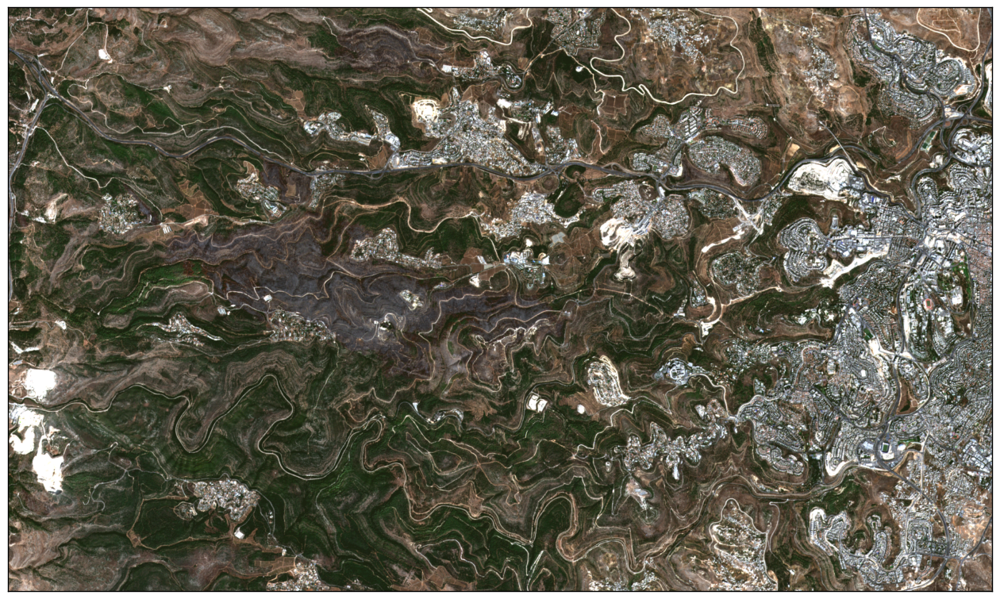

In [21]:
# Lets take it for a spin.
fig, ax1 = custom_subplots()
ax1.imshow(render_s2_as_rgb(example_s2_RGB))
plt.show()
fig.clf()

## Visualising SAR data

The sentinel 1 data has two polarisations, Vertical Vertical and Vertical Horizontal. A common way of visualising SAR imagery as RGB is to do the following: `Blue: VV, Green: VH, Red: VV/VH` but for now, lets just view
one of the polarisations (VV).

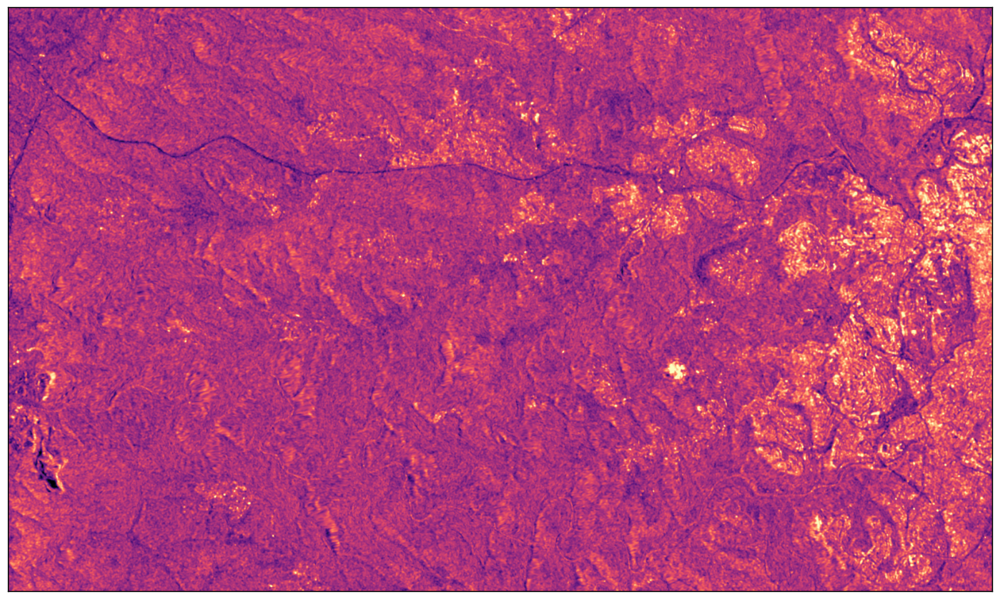

In [22]:
# The sentinel 1 data has two polarisations, Vertical Vertical and Vertical Horisontal.
# Here we only visualise the VV component.
fig, ax1 = custom_subplots()
ax1.imshow(example_s1[:, :, 0], vmin=-20, vmax=5, cmap="magma")
plt.show()
fig.clf()

## Visualising DEM data

The DEM data contains 4 channels that contain information on the elevation profile.

The first 3 channels contain the orientation of the slope and the actual slope itself. Plotting these channels results in an aspect-slope image.
 The 4th channel contains the actual elevation. When plotted this gives us the elevation profile.

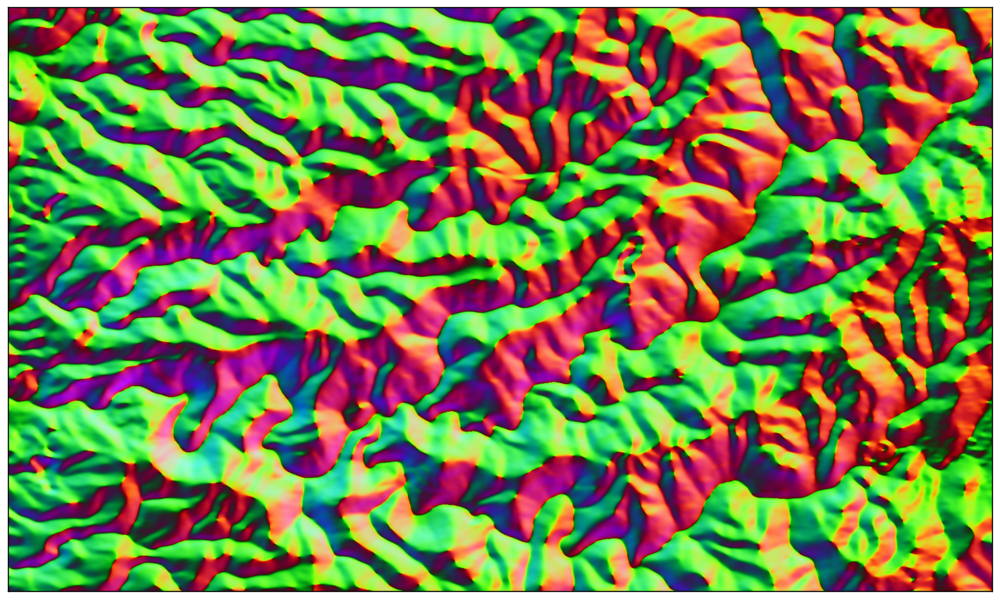

In [23]:
# Aspect-slope image

# The terrain data is already normalised to what is sometimes called the orientation.
# This is the aspect plotted as a 2D circle, and the slope.
fig, ax1 = custom_subplots()

# We normalise the DEM for visualisation to highlight the contrast in the image.
for c in [0, 1, 2]:
    example_dem[:, :, c] = example_dem[:, :, c] / example_dem[:, :, c].max()

ax1.imshow(example_dem[:, :, 0:3])
plt.show()
fig.clf()

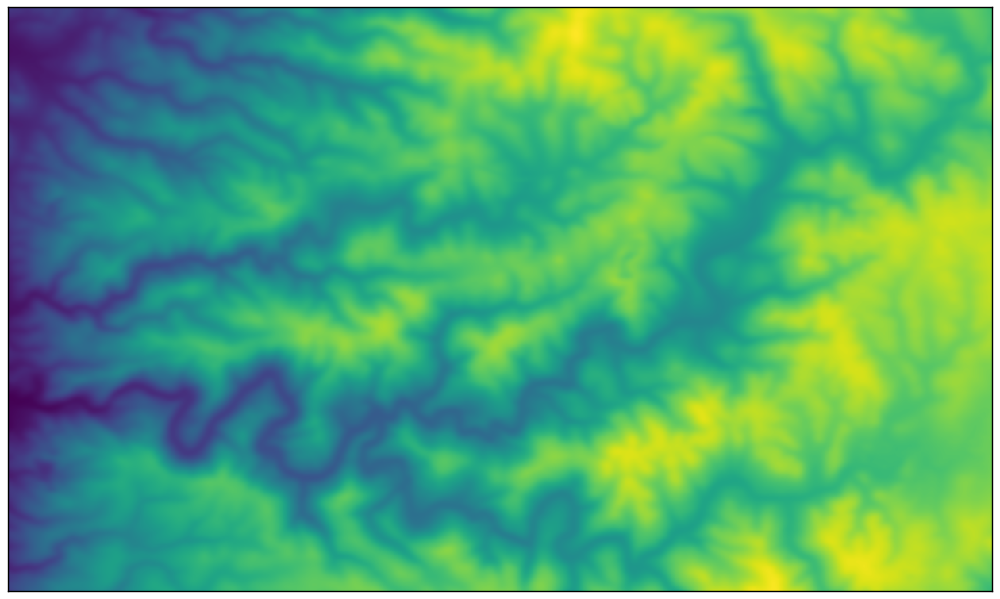

In [24]:
# Elevation profile

# The elevation values themselves are in the fourth band, normalised to the
# height of mt. everest.
fig, ax1 = custom_subplots()
ax1.imshow(example_dem[:, :, 3] / example_dem[:, :, 3].max(), cmap="viridis")
plt.show()

# Predicting building and proxy population density

Our first task is to analyse the regions and find out which places have the highest density of vulnerable locations and where most of the population is concentrated.

For this task we will train a convolutional neural network on the hyperspectral data from Sentinel-2. For the task of building density prediction we have labels which we can use to train the model and evaluate the results.

## Preparing the data for our convolutional neural network
When working with computer vision tasks, it is often necessary to process large amounts of image data. This can be a challenging task, particularly when working with high-resolution images, which can contain millions of pixels. To make this task more manageable, images are typically divided into smaller sub-regions or patches.

These patches can be generated in a variety of ways, such as by using sliding windows or by randomly selecting regions of the image. We are going to use the buteo library for this. The patches are then typically grouped into batches, which are fed into the deep learning model during training. The major benefit of having patches is to reduce the amount of memory required to process the image data and to make it easier to work with.

It is important to be aware that during the process of creating patches some regions in the original image will be sampled multiple times, if overlaps are used. This means patches are not always independent of each other and might partially overlap. This is especially important to take into account when creating the test set, as it is essential that it is not contaminated with training data.

We can easily create the patches by using the `array_to_patches` function from the buteo library while specifying the size of the resulting arrays.


In [25]:
# Generate patches for a single image. We can choose the size of the resulting patches. Automatically can create offsets.
patches_label = beo.array_to_patches(example_label, 64)
patches_rgb = beo.array_to_patches(example_s2, 64)

# Patch, height, width, channel.
print(patches_label.shape, patches_rgb.shape)

(540, 64, 64, 1) (540, 64, 64, 9)


540 patches of 64 x 64 pixels


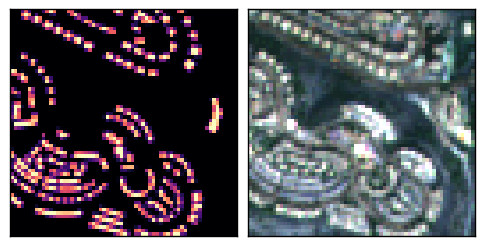

In [26]:
# We now have patches_label.shape[0] patches (540 for this tile) of 64 x 64 pixels.
print(f"{patches_label.shape[0]} patches of {patches_label.shape[1]} x {patches_label.shape[2]} pixels")
fig, (ax1, ax2) = custom_subplots(nrows=1, ncols=2, size=(6, 6))

# interpolation is set explicit to nearest, smart smoothing at pixel level does not make sense.
ax1.imshow(patches_label[400, :, :, 0], cmap="magma", interpolation="nearest")
ax2.imshow(render_s2_as_rgb(patches_rgb[400, :, :, :]), interpolation="nearest")
plt.show()

## Create train, validation and test sets

A machine learning model needs to be trained on a set of data to learn from it. But to know whether it has learned something that *generalises* — rather than memorised the training patches — we need data it was never trained on. We use three splits:

* **Training set** — what the model learns from.
* **Validation set** — never trained on, but evaluated after every epoch. It tells us *during* training whether the model is still improving or has started to overfit.
* **Test set** — touched once, at the very end, to report final performance.

We set aside 10% of the tiles for validation and another 10% for testing.

**Where the split happens matters.** We split *before* cutting the data into patches, at the level of whole tiles. If we split afterwards, at the patch level, the overlapping patch grids would place the same pixels in more than one split, and our "held-out" scores would partly be measuring data the model had already seen. This is one of the most common and most expensive mistakes in geospatial machine learning: it produces excellent numbers and a model that disappoints in the field.

Even with a tile-level split our held-out data is not fully independent — every tile comes from the same region, sensor, and season, so a held-out tile still resembles the training tiles far more than a genuinely new city would. See the [model card](#model-card) for what that means for the numbers you are about to get.


In [27]:
# Now lets create all the data we need to train our model!
from glob import glob
from tqdm import tqdm

# Lets randomly select 10% of our tiles for validation and another 10% for testing.
# It is important that we do it at this level instead of the patch level.
# Since we are using "overlaps", doing the selection at the patch level would
# result in contamination as the same pixel can appear in more than one split.

# Set the seeds, to make it replicatable. SEED, PATCH_SIZE and N_OFFSETS were all
# defined in the constants cell near the top of the notebook.
np.random.seed(SEED)

# We draw both hold-out sets in one go, so that they cannot overlap each other.
# replace=False matters: with replacement we would draw the same tile twice and
# silently end up with fewer held-out tiles than we asked for.
N_HOLDOUT = 78 // 10
holdout_indices = np.random.choice(78, 2 * N_HOLDOUT, replace=False)
val_indices = holdout_indices[:N_HOLDOUT]
test_indices = holdout_indices[N_HOLDOUT:]

print(f"Validation tiles ({len(val_indices)}): {sorted(val_indices)}")
print(f"Test tiles       ({len(test_indices)}): {sorted(test_indices)}")

# Lists to hold our patches
training_label = []
training_s1 = []
training_s2 = []
training_dem = []

validation_label = []
validation_s1 = []
validation_s2 = []
validation_dem = []

testing_label = []
testing_s1 = []
testing_s2 = []
testing_dem = []

paths_labels = sorted(glob(os.path.join(data_folder, "label_*.tif")))
paths_s1 = sorted(glob(os.path.join(data_folder, "s1_*.tif")))
paths_s2 = sorted(glob(os.path.join(data_folder, "s2_*.tif")))
paths_dem = sorted(glob(os.path.join(data_folder, "dem_*.tif")))

# Read and order the tiles in the temporary folder.
for image in tqdm(zip(
    paths_labels,
    paths_s1,
    paths_s2,
    paths_dem
), total=len(paths_labels), ncols=120):
    path_label, path_s1, path_s2, path_dem = image

    # Get the name and number of the patches
    label_name = os.path.splitext(os.path.basename(path_label))[0]
    img_idx = int(label_name.split("_")[1])

    # Get the data from the tiles
    arr_label = beo.raster_to_array(path_label, filled=True, fill_value=0.0)

    # Handle any potential errors
    np.clip(arr_label, 0.0, 100.0, out=arr_label)
    arr_label[np.isnan(arr_label)] = 0.0

    # Read the tiles
    arr_s1 = beo.raster_to_array(path_s1, filled=True, fill_value=0.0)
    arr_s2 = beo.raster_to_array(path_s2, filled=True, fill_value=0.0)
    arr_dem = beo.raster_to_array(path_dem, filled=True, fill_value=0.0)

    # Generated the patches
    patches_label = beo.array_to_patches(arr_label, PATCH_SIZE, n_offsets=N_OFFSETS)
    patches_s1 = beo.array_to_patches(arr_s1, PATCH_SIZE, n_offsets=N_OFFSETS)
    patches_s2 = beo.array_to_patches(arr_s2, PATCH_SIZE, n_offsets=N_OFFSETS)
    patches_dem = beo.array_to_patches(arr_dem, PATCH_SIZE, n_offsets=N_OFFSETS)

    # Sanity check to ensure that the right images were chosen.
    assert patches_label.shape[0:3] == patches_s1.shape[0:3] == patches_s2.shape[0:3] == patches_dem.shape[0:3], "Patches do not align."

    if img_idx in test_indices:
        testing_label.append(patches_label)
        testing_s1.append(patches_s1)
        testing_s2.append(patches_s2)
        testing_dem.append(patches_dem)
    elif img_idx in val_indices:
        validation_label.append(patches_label)
        validation_s1.append(patches_s1)
        validation_s2.append(patches_s2)
        validation_dem.append(patches_dem)
    else:
        training_label.append(patches_label)
        training_s1.append(patches_s1)
        training_s2.append(patches_s2)
        training_dem.append(patches_dem)

# Merge the patches back together
training_label = np.concatenate(training_label, axis=0)
training_s1 = np.concatenate(training_s1, axis=0)
training_s2 = np.concatenate(training_s2, axis=0)
training_dem = np.concatenate(training_dem, axis=0)

validation_label = np.concatenate(validation_label, axis=0)
validation_s1 = np.concatenate(validation_s1, axis=0)
validation_s2 = np.concatenate(validation_s2, axis=0)
validation_dem = np.concatenate(validation_dem, axis=0)

testing_label = np.concatenate(testing_label, axis=0)
testing_s1 = np.concatenate(testing_s1, axis=0)
testing_s2 = np.concatenate(testing_s2, axis=0)
testing_dem = np.concatenate(testing_dem, axis=0)

print("Training patches:   ", training_label.shape, training_s1.shape, training_s2.shape, training_dem.shape)
print("Validation patches: ", validation_label.shape, validation_s1.shape, validation_s2.shape, validation_dem.shape)
print("Test patches:       ", testing_label.shape, testing_s1.shape, testing_s2.shape, testing_dem.shape)

Validation tiles (7): [np.int64(16), np.int64(25), np.int64(29), np.int64(33), np.int64(47), np.int64(59), np.int64(61)]
Test tiles       (7): [np.int64(11), np.int64(14), np.int64(18), np.int64(36), np.int64(51), np.int64(71), np.int64(72)]


100%|███████████████████████████████████████████████████████████████████████████████████| 78/78 [00:25<00:00,  3.10it/s]


Training patches:    (29760, 32, 32, 1) (29760, 32, 32, 2) (29760, 32, 32, 9) (29760, 32, 32, 4)
Validation patches:  (862, 32, 32, 1) (862, 32, 32, 2) (862, 32, 32, 9) (862, 32, 32, 4)
Test patches:        (2182, 32, 32, 1) (2182, 32, 32, 2) (2182, 32, 32, 9) (2182, 32, 32, 4)


## Normalisation strategies

Normalization is a common preprocessing step in computer vision tasks, and it refers to the process of rescaling the pixel values of an image to have a common scale. The main reason for normalizing data in computer vision tasks is to reduce the impact of the scale of the input features on the learning process of the model.


**Sentinel-1**: The current data is expressed in dB. The data is first clipped to the range (-35 dB, 5 dB), which covers almost all real backscatter values. Each value is then linearly rescaled to (0,1) with a min-max scaling, `(x + 35) / 40`, which is what `beo.scaler_truncate(arr, -35.0, 5.0)` does. The bounds come from the physics of the sensor rather than from the data, so no statistics can leak from the test split into training.

**Sentinel-2**: The Sentinel-2 images are uint16 with values ranging from 0 to 65535 which are called digital numbers (DN). The physical value derived from this is the reflectance defined as DN/10.000. The reflectance is usually between 0-1 but can be higher due to surface or cloud effects.  By convention Sentinel 2 data is clipped to the range (0,10.000). Afterwards it is normalised to (0,1) as well.

**CopDEM**: The channels in the DEM are already normalised. The elevation (4th channel) is normalised with respect to the heighest point on earth which is  mt. Everest. The slope (3rd band) is also normalised with respect to a slope of 90°. The first two bands contain the orientation of the slope. Because the orientation is a cyclical variable (0° = 360°), we need two channels to encode and  normalise this information. This can be done by storing the sine of the orientation in the first band and the cosine in the second band. To keep the range between (0,1) the final result is:

$$ \text{channel 1} = [sin(\text{orientation})+1]/2 $$
$$ \text{channel 2} = [cos(\text{orientation})+1]/2 $$


In [28]:
# The next step is normalising the data.
# By convention Sentinel 2 data is normalised by dividing with 10000.0
# Sentinel 1 is more tricky. The current data is dB, which ranges from ~-35 to 5,
# The DEM is already normalised.

# Scalers also return a dictionary of the stats, so the same scaler can be reused.
# Note that all three splits are scaled with the *same* fixed ranges. The ranges
# come from the physics of the sensors, not from the data, so there is nothing to
# leak from the held-out splits back into training.
s1_train, _statdict = beo.scaler_truncate(training_s1, -35.0, 5.0)
s1_val, _statdict = beo.scaler_truncate(validation_s1, -35.0, 5.0)
s1_test, _statdict = beo.scaler_truncate(testing_s1, -35.0, 5.0)

s2_train, _statdict = beo.scaler_truncate(training_s2, 0.0, 10000.0)
s2_val, _statdict = beo.scaler_truncate(validation_s2, 0.0, 10000.0)
s2_test, _statdict = beo.scaler_truncate(testing_s2, 0.0, 10000.0)

# If the labels are not already float32, cast them to float32.
labels_train = training_label.astype(np.float32, copy=False)
labels_val = validation_label.astype(np.float32, copy=False)
labels_test = testing_label.astype(np.float32, copy=False)

Let's save all our work to disk as NumPy arrays. That way, at any moment in time, we could reload the data again and use it to train the model. A cool thing to know about saving NumPy arrays is that later on, when loading the data again, the data can be kept on disk, and only necessary bits can be loaded into memory upon access. This can be very useful when dealing with large datasets.

In [29]:
# Lets save the data to our temporary folder and do some house cleaning.
# This takes about 2 minutes, so go make some coffee!
np.savez_compressed(os.path.join(data_folder, "train.npz"), x_s1=s1_train, x_s2=s2_train, x_dem=training_dem, y=labels_train)
np.savez_compressed(os.path.join(data_folder, "val.npz"), x_s1=s1_val, x_s2=s2_val, x_dem=validation_dem, y=labels_val)
np.savez_compressed(os.path.join(data_folder, "test.npz"), x_s1=s1_test, x_s2=s2_test, x_dem=testing_dem, y=labels_test)

# Memory cleaning
del s1_train, s2_train, training_dem, labels_train
del s1_val, s2_val, validation_dem, labels_val
del s1_test, s2_test, testing_dem, labels_test

## Model definition

We start by building a very simple convolutional network that can already obtain reasonable results. The model will take as input an image containing the 9 spectral bands from Sentinel-2 (normalised and split up into patches of 32x32). The output will be the building density of the pixel ranging between 0-100. This means we are doing regression task as we are trying to predict specific values.

The architecture is simple. First there is an encoder block where the number of channels is increased to 128. Because of the padding, the resolution of the output channels is unchanged. In the decoder block, there are extra convolutions that bring the number of channels back to a single one that contains the building density.

To help the model we force the values to lie between in the range 0-100 since any other values will never be correct.




In [30]:
import torch.nn as nn

# This is a Simple Convolutional Neural Network.
class SimpleConvNet(nn.Module):
    def __init__(self, in_channels, output_min, output_max):
        super(SimpleConvNet, self).__init__()
        self.output_min = output_min
        self.output_max = output_max

        # An encoder without a bottleneck
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(128)
        )

        # Simple decoder
        self.decoder = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 1, kernel_size=3, padding=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)

        # Lets help the network
        x = torch.clamp(x, self.output_min, self.output_max)
        return x

This is a very simple model. It does not have a bottleneck, skip connections, attention *layers* or other modern features. Please investigate ways of improving this network. A good place to start would be a bottleneck and skip connections - Maybe a residual block? Check out InceptionResNet and ConvNext for modern convolutional architectures.

A key benefit of the current model is that it takes up **less than 1mb of space**.

In [31]:
# Define the model
input_channels = 9 # Sentinel 2 initially.

# Since we know the labels will always be [0.0, 100.0], we can help the network.
model = SimpleConvNet(input_channels, 0.0, 100.0)

# EPOCHS, BATCH_SIZE and LEARNING_RATE were set in the constants cell near the top
# of the notebook - go back there to change them.
print(f"Training for {EPOCHS} epochs, batch size {BATCH_SIZE}, learning rate {LEARNING_RATE}.")
print(f"Trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")


Training for 10 epochs, batch size 16, learning rate 0.001.
Trainable parameters: 153,985


It is important to be aware that there are different conventions regarding the data format. More specifically TensorFlow uses the convention of channels last while PyTorch uses channels first. When using libraries with different conventions one must take care to change the format when necessary.

In [32]:
# Create the dataloader
from torch.utils.data import Dataset, DataLoader

class NumpyDataset(Dataset):
    def __init__(self, x_train, y_train, data_is_channel_last=False):
        if data_is_channel_last:
            x_train = beo.channel_last_to_first(x_train)
            y_train = beo.channel_last_to_first(y_train)

        self.x_train = torch.from_numpy(x_train).float()
        self.y_train = torch.from_numpy(y_train).float()

    def __len__(self):
        return len(self.x_train)

    def __getitem__(self, index):
        x = self.x_train[index]
        y = self.y_train[index]
        return x, y

In [33]:
# Load the data. We open the archive once and pull both arrays out of it.
with np.load(os.path.join(data_folder, "train.npz")) as train_npz:
    x_train = train_npz["x_s2"] # Note: Initially we only load the S2 Data.
    y_train = train_npz["y"]

# Ready the data for pytorch
def callback(x, y):
    return (
        torch.from_numpy(x).float(),
        torch.from_numpy(y).float(),
    )

# The validation split: never trained on, evaluated after every epoch.
with np.load(os.path.join(data_folder, "val.npz")) as val_npz:
    x_val = val_npz["x_s2"]
    y_val = val_npz["y"]

# Create the dataset and DataLoader
dataset = NumpyDataset(x_train, y_train, data_is_channel_last=True)
dataset_val = NumpyDataset(x_val, y_val, data_is_channel_last=True)
# num_workers is the number of subprocesses loading data in parallel. A Colab VM
# only has a couple of CPU cores, so asking for many more workers than that costs
# memory and start-up time without loading anything faster.
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, pin_memory=True, num_workers=2)

# No shuffling for validation - we are only measuring, not learning.
dataloader_val = DataLoader(dataset_val, batch_size=BATCH_SIZE, shuffle=False, pin_memory=True, num_workers=2)

print(f"{len(dataset):>7,} training patches")
print(f"{len(dataset_val):>7,} validation patches")

 29,760 training patches
    862 validation patches


## Metrics

In machine learning, a metric is a measure used to evaluate the performance of a model on a given task. Metrics are used to quantify how well a model is performing and to compare the performance of different models. <br><br>

**Regression** <br>
The choice of metric depends on the task at hand. In our case we are trying to predict the density of buildings at every given pixel. A very common metric for regression tasks is the Mean Squared Error (MSE). For a given image the MSE is calculated as follows:

$$MSE = \frac{1}{n} \sum_{i=1}^n (y_{pred,i} - y_{label,i})^2 $$

Where $n$ is the number of pixels in the image, $y_{pred,i}$ is the i-th pixel from the prediction and  $y_{label,i}$ is the i-th pixel from the label. <br>
In a similar fashion there is the Mean Absolute Error (MAE) and Root Mean Squared Error (RMSE) which are expressed in the same units as the label:
$$MAE = \frac{1}{n} \sum_{i=1}^n |y_{pred,i} - y_{label,i}| $$
<br>
$$RMSE = \sqrt{\frac{1}{n} \sum_{i=1}^n (y_{pred,i} - y_{label,i})^2}.$$

<br><br>

**Classification** <br>
One could also cast the problem to a binary classification task. This changes the problem from predicting the building density (ranging from 0-100) to predicting if buildings are present or not (0 or 1). In this case we should recast the labels based on a threshold. For example if the building density is greater than 1, we say buildings are present and the new label is 1, else the new label is 0.

For a binary classification task we can use accuracy as a metric. Accuracy is the percentage of correctly classified examples. For a given image the accuracy would be:

$$ accuracy = \frac{\# \text{correctly classified pixels}}{\# \text{pixels in the image}}$$

<br><br>
*accuracy is a very simple metric for classification problems, can you find more nuanced metrics?*

> **Answer.** Yes. Because only ~3% of pixels are built-up, accuracy is dominated by the easy "no building" pixels. Better choices are **precision**, **recall**, their harmonic mean **F1**, and **IoU** (Jaccard). They are computed below in *Beyond accuracy*, and none of them rewards a model that predicts "nothing" everywhere. Other useful options are **balanced accuracy** (the mean of recall on each class), **Cohen's kappa** or the **Matthews correlation coefficient**, and the threshold-free **precision–recall curve / average precision** (see solution S1). For the regression itself, a single global MAE is also flattering, because it is averaged over millions of empty pixels. Errors should be broken down by density bin (solution S2) and compared with a skill score against a trivial baseline.

## Train model

We now train the model while optimising for MSE loss.
Inspect how the training loss behaves during training.

In [34]:
# Lets train!
import torch.optim as optim

# Our loss function
criterion = nn.MSELoss()

optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

# Move model to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device)

# We record the mean loss per epoch so we can plot learning curves afterwards.
train_losses = []
val_losses = []

track_start("Model training")

# Training loop
for epoch in range(EPOCHS):
    # --- Training ---
    model.train()
    running_loss = 0.0

    # Initialize the progress bar for training
    train_pbar = tqdm(dataloader, total=len(dataloader), ncols=120)

    for i, (inputs, targets) in enumerate(train_pbar):
        # Move inputs and targets to the device (GPU)
        inputs, targets = inputs.to(device), targets.to(device)

        # Zero the gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)

        # Compute loss
        loss = criterion(outputs, targets)

        # Backward pass
        loss.backward()

        # Update weights
        optimizer.step()

        # Print statistics
        current_loss = loss.item()

        running_loss += current_loss
        mean_loss = running_loss / (i + 1)

        # Update the training bar
        train_pbar.set_description(f"Epoch: {epoch+1:03d}/{EPOCHS:03d}")
        print_dict = { "loss": f"{mean_loss:4f}" }

        train_pbar.set_postfix(print_dict)

    train_losses.append(running_loss / len(dataloader))

    # --- Validation (no gradients, no weight updates) ---
    model.eval()
    running_val_loss = 0.0
    with torch.no_grad():
        for val_inputs, val_targets in dataloader_val:
            val_inputs, val_targets = val_inputs.to(device), val_targets.to(device)
            running_val_loss += criterion(model(val_inputs), val_targets).item()

    val_losses.append(running_val_loss / len(dataloader_val))
    print(f"Epoch {epoch+1:03d}: train_loss={train_losses[-1]:.4f}  val_loss={val_losses[-1]:.4f}")

track_stop("Model training")

# Switch the model to evaluation mode now that training is done. This matters:
# our model contains BatchNorm layers, which behave differently in the two modes.
# While training they normalise using the statistics of the current batch; in
# eval mode they use the running averages accumulated over training. If we forget
# this, every prediction below would depend on which other patches happen to sit
# in the same batch - and the test metrics would be quietly wrong.
model.eval()


Epoch: 001/010: 100%|█████████████████████████████████████████████| 1860/1860 [00:17<00:00, 103.67it/s, loss=195.411639]


Epoch 001: train_loss=195.4116  val_loss=192.8321


Epoch: 002/010: 100%|█████████████████████████████████████████████| 1860/1860 [00:16<00:00, 114.26it/s, loss=166.267272]


Epoch 002: train_loss=166.2673  val_loss=84.6835


Epoch: 003/010: 100%|█████████████████████████████████████████████| 1860/1860 [00:16<00:00, 110.41it/s, loss=153.138132]


Epoch 003: train_loss=153.1381  val_loss=101.2163


Epoch: 004/010: 100%|█████████████████████████████████████████████| 1860/1860 [00:16<00:00, 114.44it/s, loss=145.982512]


Epoch 004: train_loss=145.9825  val_loss=80.7632


Epoch: 005/010: 100%|█████████████████████████████████████████████| 1860/1860 [00:16<00:00, 113.82it/s, loss=138.937579]


Epoch 005: train_loss=138.9376  val_loss=132.6430


Epoch: 006/010: 100%|█████████████████████████████████████████████| 1860/1860 [00:16<00:00, 113.69it/s, loss=135.578199]


Epoch 006: train_loss=135.5782  val_loss=73.0985


Epoch: 007/010: 100%|█████████████████████████████████████████████| 1860/1860 [00:16<00:00, 110.53it/s, loss=132.380637]


Epoch 007: train_loss=132.3806  val_loss=65.9933


Epoch: 008/010: 100%|█████████████████████████████████████████████| 1860/1860 [00:16<00:00, 112.63it/s, loss=128.955539]


Epoch 008: train_loss=128.9555  val_loss=66.0829


Epoch: 009/010: 100%|█████████████████████████████████████████████| 1860/1860 [00:16<00:00, 111.69it/s, loss=126.814983]


Epoch 009: train_loss=126.8150  val_loss=79.6528


Epoch: 010/010: 100%|█████████████████████████████████████████████| 1860/1860 [00:16<00:00, 114.79it/s, loss=124.826154]


Epoch 010: train_loss=124.8262  val_loss=61.7910
Model training: 169.7 s, 3.62 Wh, 0.97 g CO2eq


SimpleConvNet(
  (encoder): Sequential(
    (0): Conv2d(9, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (decoder): Sequential(
    (0): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(64, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
)

## Loss curves

A single number at the end of training tells you little — plotting the training and validation loss per epoch is the quickest way to see *how* the model learned.

* If both curves keep falling together, the model is still learning generalisable structure: train longer.
* If the training loss keeps falling while the validation loss flattens or turns upward, the model has started to **overfit** — memorising training patches instead of learning transferable features. The epoch where the validation curve turns is where you should have stopped.
* If both curves flatten early at a high value, the model is **underfitting**: it lacks the capacity (or the training time) to capture the pattern at all.

This is the diagnostic that a test set alone cannot give you, because the test set is only looked at once, at the end.


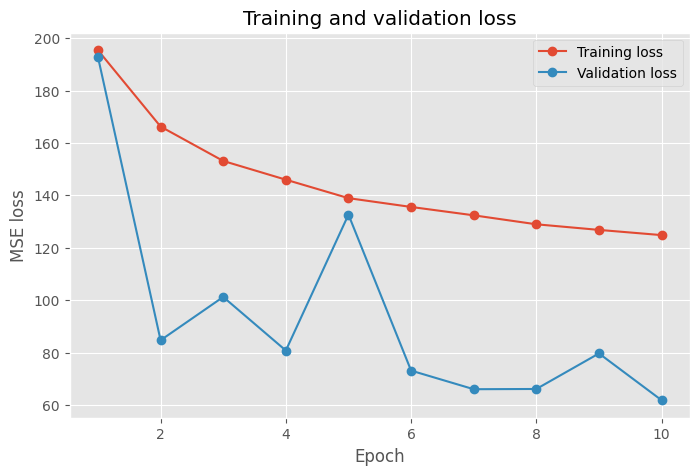

In [35]:
fig, ax = plt.subplots(figsize=(8, 5))
epochs_range = range(1, len(train_losses) + 1)
ax.plot(epochs_range, train_losses, marker="o", label="Training loss")
ax.plot(epochs_range, val_losses, marker="o", label="Validation loss")
ax.set_xlabel("Epoch")
ax.set_ylabel("MSE loss")
ax.set_title("Training and validation loss")
ax.legend()
plt.show()


In [36]:
# Save the model in case you want to reuse it.
torch.save(model.state_dict(), os.path.join(FOLDER_PRED, "model_01.pt"))

del dataset, dataloader, dataset_val, dataloader_val

<a name="results-and-discussion"></a>
# Results & discussion


## Metrics on test set

Metrics are a very important tool to explore model performance. They allow to get a quick summary of the global performance and compare different model architectures, training schemes, data augmentation, etc.

Let's take a look how the trained model performs on the test set for the metrics we defined earlier. We also try to recast the labels to a binary classification problem and see how well it scores in this setup.

In [37]:
# Lets predict our tests dataset and inspect the results.
# Clear GPU memory (only meaningful if we actually have a GPU).
if device.type == "cuda":
    torch.cuda.empty_cache()

# The model was put into eval mode at the end of training - see the note there.
model.eval()

with torch.no_grad():
    x_test = beo.channel_last_to_first(np.load(os.path.join(data_folder, "test.npz"))["x_s2"])
    y_test = beo.channel_last_to_first(np.load(os.path.join(data_folder, "test.npz"))["y"])
    y_pred = model(torch.from_numpy(x_test).float().to(device)).cpu().detach().numpy()

print("Building density metrics:")
print("\tRMSE:", np.sqrt(np.mean((y_test - y_pred) ** 2)))
print("\tMAE:", np.mean(np.abs(y_test - y_pred)))
print("\tMSE:", np.mean((y_test - y_pred) ** 2))

# Recast problem to classification
threshold = 1 # If 1m^2 of the pixel is covered by buildings, we say that buildings are present
y_test_classification = np.where(y_test > threshold, 1, 0)
y_pred_classification = np.where(y_pred > threshold, 1, 0)

print("\n\nClassification metrics:")
print("\tAccuracy:", np.mean(y_test_classification == y_pred_classification))

Building density metrics:
	RMSE: 6.7051926
	MAE: 1.1215492
	MSE: 44.959606


Classification metrics:
	Accuracy: 0.9637163618526581


**Be critical about metrics**

Metrics are a very important tool to explore model performance, but they can sometimes be misleading as well.

Compare the test MSE with the loss values you saw during training. You might expect it to be higher, since this is data the model has never seen. In our run it is actually much **lower** than the final training loss. That does not mean the model generalises better than it fits. Two things make these numbers not directly comparable, and the next cell checks both:

1. **The splits are not equally hard.** MSE grows with building density, so a split with more empty desert and farmland gets a lower MSE from the same model. The label variance per split shows how hard each one is.
2. **The training loss is a running average.** It is averaged over a whole epoch while the weights were still changing, with BatchNorm in training mode. The test MSE is computed once, with the final weights, in eval mode.

MSE also squares its errors, so it is extremely sensitive to outliers: a handful of very bad predictions can dominate the average. After the check we plot the distribution of the squared error to see how much that matters.

Sometimes models find clever ways to optimise the training metric without actually learning the desired properties. An example of this can be in unbalanced datasets. In our dataset for example there will always be much more pixels not containing any building than the other way around. If the model would optimise accuracy it could get very good accuracy by lazily predicting that no pixels contain buildings!

Let's dig a bit deeper into these metrics and see how they compare to simple baseline predictions.


In [38]:
# Why is the test MSE so different from the training loss? Two checks.

# 1) The splits are not equally "hard": MSE grows with building density, so a split with
#    fewer buildings gets a lower MSE from the same model. The label variance is the MSE
#    of a model that always predicts the split's own mean.
with np.load(os.path.join(data_folder, "val.npz")) as _f:
    _y_val = _f["y"]
for _name, _y in [("train", y_train), ("validation", _y_val), ("test", y_test)]:
    print(f"{_name:<11} mean density {np.mean(_y):5.2f} m2/px | built-up (>1 m2) {100 * np.mean(_y > 1):4.1f} % "
          f"| label variance {np.var(_y):6.1f}")
del _y_val

# 2) The training loss printed during training is averaged over each epoch, while the weights
#    were still changing and with BatchNorm in training mode. For a like-for-like number,
#    score the FINAL model in eval mode on a random sample of training patches.
_rng = np.random.default_rng(SEED)
_idx = np.sort(_rng.choice(len(x_train), size=min(4000, len(x_train)), replace=False))
_se, _n = 0.0, 0
with torch.no_grad():
    for _k in range(0, len(_idx), 500):
        _b = _idx[_k:_k + 500]
        _p = model(torch.from_numpy(x_train[_b].transpose(0, 3, 1, 2)).float().to(device)).cpu().numpy()
        _se += float(np.sum((_p - y_train[_b].transpose(0, 3, 1, 2)) ** 2))
        _n += _p.size
print(f"\nFinal model, eval mode, 4,000 training patches: MSE = {_se / _n:6.1f}")
print(f"Final model, eval mode, test patches:            MSE = {np.mean((y_test - y_pred) ** 2):6.1f}")
print(f"Last-epoch training loss (train mode, running):  MSE = {train_losses[-1]:6.1f}")

train       mean density  4.71 m2/px | built-up (>1 m2)  9.3 % | label variance  319.6
validation  mean density  1.88 m2/px | built-up (>1 m2)  5.6 % | label variance  103.4
test        mean density  1.19 m2/px | built-up (>1 m2)  3.3 % | label variance   67.8

Final model, eval mode, 4,000 training patches: MSE =  127.5
Final model, eval mode, test patches:            MSE =   45.0
Last-epoch training loss (train mode, running):  MSE =  124.8


Metric for baseline model that always predicts 0
	RMSE: 8.319763538663357
	MAE: 1.185177857953137
	MSE: 69.21846533927224
	accuracy: 0.9673545270967002


Metric for baseline model that always predicts the mean of the train labels (4.71m^2).
	RMSE: 8.957007309890333
	MAE: 5.599538305488662
	MSE: 80.22797994942887
	accuracy: 0.03264547290329973


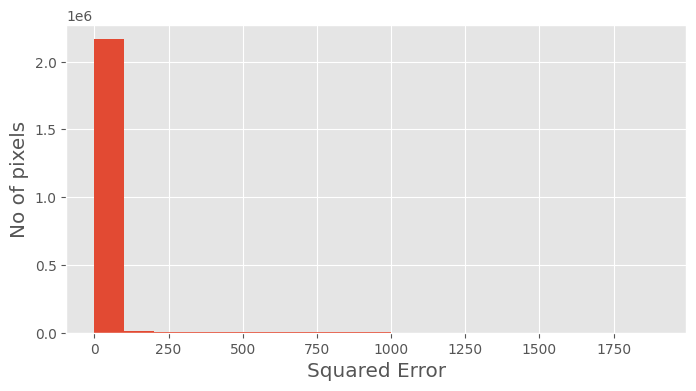

In [39]:
# Distribution of the SE loss
SE = (y_test - y_pred) ** 2
plt.figure(figsize=(8,4))
_,_,_ = plt.hist(SE.flatten(), bins=[100*i for i in range(20)])
plt.ylabel('No of pixels', size='x-large')
plt.xlabel('Squared Error', size= 'x-large')

# Some very simple baselines to compare the model too
baseline_pred_0 = np.zeros(y_pred.shape)
baseline_pred_mean = np.ones(y_pred.shape)*np.mean(y_train)

# To score the baselines as classifiers we must threshold them exactly the way we
# thresholded the model's predictions above - otherwise we are comparing a class
# label against a raw density value.
baseline_0_classification = np.where(baseline_pred_0 > threshold, 1, 0)
baseline_mean_classification = np.where(baseline_pred_mean > threshold, 1, 0)

print("Metric for baseline model that always predicts 0")
print("\tRMSE:", np.sqrt(np.mean((y_test - baseline_pred_0) ** 2)))
print("\tMAE:", np.mean(np.abs(y_test - baseline_pred_0)))
print("\tMSE:", np.mean((y_test - baseline_pred_0) ** 2))
print("\taccuracy:", np.mean(y_test_classification == baseline_0_classification))

print(f"\n\nMetric for baseline model that always predicts the mean of the train labels ({np.mean(y_train):.2f}m^2).")
print("\tRMSE:", np.sqrt(np.mean((y_test - baseline_pred_mean) ** 2)))
print("\tMAE:", np.mean(np.abs(y_test - baseline_pred_mean)))
print("\tMSE:", np.mean((y_test - baseline_pred_mean) ** 2))
print("\taccuracy:", np.mean(y_test_classification == baseline_mean_classification))

# Look at that first accuracy score. A model that predicts "no buildings, anywhere"
# scores extremely well, because most pixels genuinely contain no buildings. That is
# the unbalanced-dataset trap the text above warns about, in numbers.

## Beyond accuracy: precision, recall, F1 and IoU

You just saw the problem in numbers: a model that predicts "no buildings anywhere" scores a very high accuracy, because most pixels genuinely contain no buildings. So let's use metrics that cannot be fooled that way. We threshold both the predictions and the labels into binary built-up / not-built-up masks and count four outcomes:

* **Precision** — of the pixels we flagged as built-up, how many really are? Low precision = false alarms.
* **Recall** — of the actual built-up pixels, how many did we find? Low recall = missed buildings.
* **F1** — the harmonic mean of precision and recall, a single number that punishes lopsided models.
* **IoU (Intersection over Union)** — the overlap between the predicted and true built-up areas; the standard metric for segmentation tasks.

None of these are improved by predicting "nothing everywhere": that model has zero true positives, so its precision, recall, F1 and IoU all collapse to zero, no matter how many empty pixels it gets right.

The trade-off between precision and recall is not just academic. If this map is used to decide where to send flood warnings, false alarms erode trust and waste resources, while missed buildings mean warnings that never reach people in the water's path. Which error is worse depends on how the map is used — and that is a decision for the people running the response, not for the model.


In [40]:
# Binary built-up detection, using the same threshold as above.
# y_test_classification and y_pred_classification were computed in the previous cell.
tp = int(np.sum((y_pred_classification == 1) & (y_test_classification == 1)))
fp = int(np.sum((y_pred_classification == 1) & (y_test_classification == 0)))
fn = int(np.sum((y_pred_classification == 0) & (y_test_classification == 1)))
tn = int(np.sum((y_pred_classification == 0) & (y_test_classification == 0)))

precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0
f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0.0
iou = tp / (tp + fp + fn) if (tp + fp + fn) > 0 else 0.0

print(f"Built-up detection at a threshold of {threshold} m2 per pixel:")
print(f"  Precision: {precision:.3f}")
print(f"  Recall:    {recall:.3f}")
print(f"  F1:        {f1:.3f}")
print(f"  IoU:       {iou:.3f}")

print()
print(f"  Built-up pixels in the test set: {tp + fn:,} of {tp + fp + fn + tn:,} "
      f"({100 * (tp + fn) / (tp + fp + fn + tn):.1f} %)")
print("  ^ that imbalance is why accuracy alone flattered the model.")

# Try changing `threshold` in the cell above and re-running both cells. Watch
# precision and recall move in opposite directions - choosing the threshold IS
# choosing the map.


Built-up detection at a threshold of 1 m2 per pixel:
  Precision: 0.463
  Recall:    0.688
  F1:        0.553
  IoU:       0.382

  Built-up pixels in the test set: 72,942 of 2,234,368 (3.3 %)
  ^ that imbalance is why accuracy alone flattered the model.


**It is therefore important to not blindly rely on metrics but inspect the results visually as well.**

In [41]:
# You can safely ignore this cell for now

# Callback function to predict array using buteo
# The idea behind this function is to provide a way to go from
# Numpy patches in NHWC -> NCHW -> Tensor -> GPU -> PREDICT -> CPU -> Numpy -> NCHW
# That way we can automatically predict large images without having the write tons
# of code.
# The function sets eval mode and disables gradients itself, so it is always safe
# to call, no matter what state the notebook is in when you reach it.
def predict(arr):
    swap = beo.channel_last_to_first(arr)
    as_torch = torch.from_numpy(swap).float()
    on_device = as_torch.to(device)

    model.eval()
    with torch.no_grad():
        predicted = model(on_device)

    on_cpu = predicted.cpu()
    as_numpy = on_cpu.numpy()
    swap_back = beo.channel_first_to_last(as_numpy)

    return swap_back

## Inspect predictions on test set

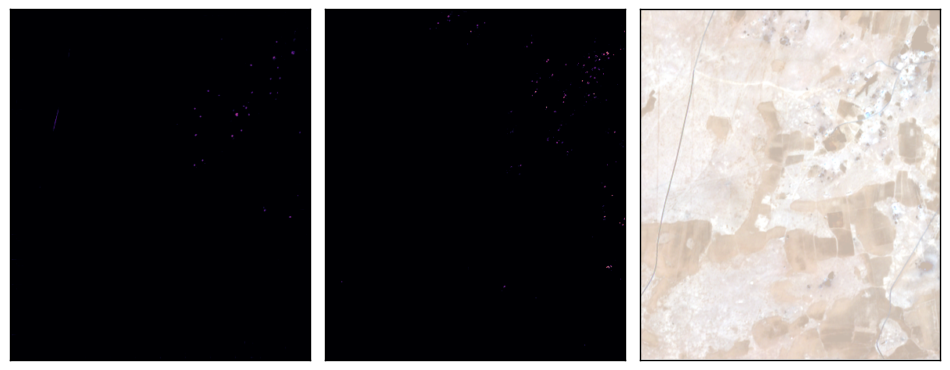

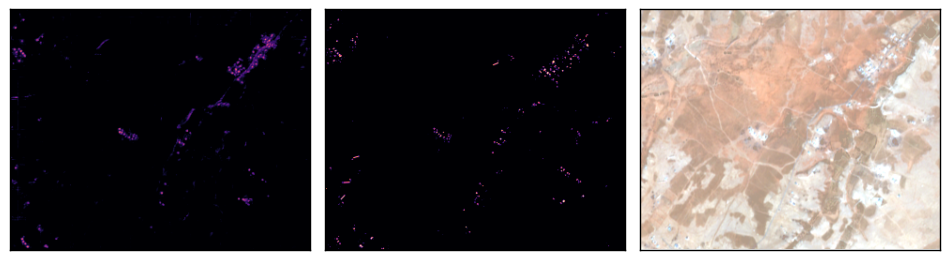

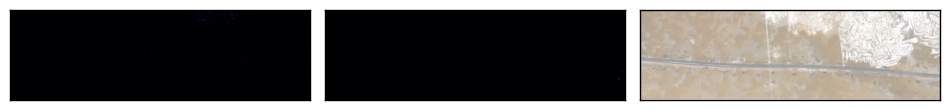

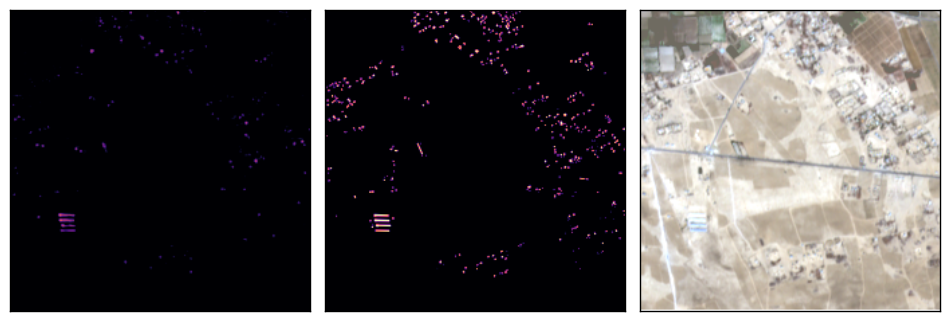

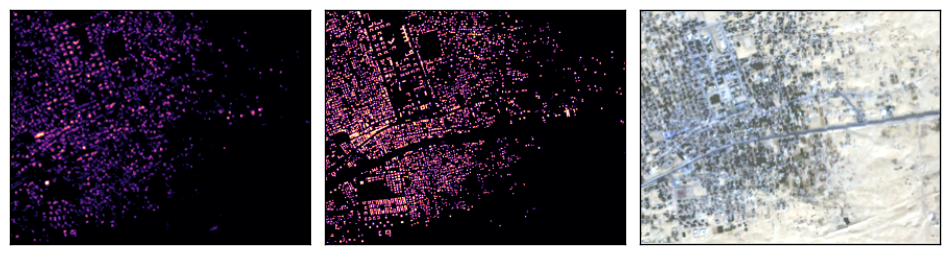

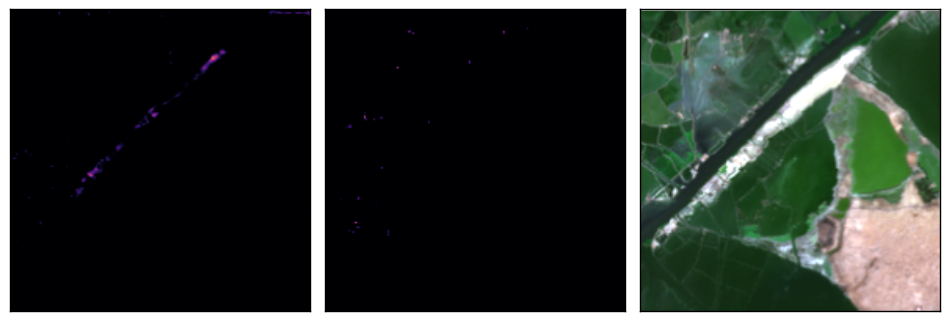

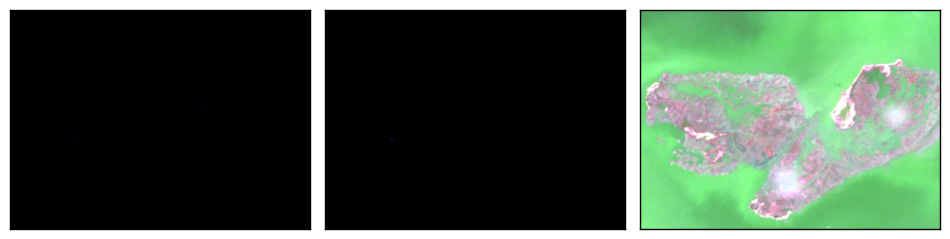

In [42]:
# Read and order the tiles in the temporary folder.
# predict the images in the test set
for image in zip(
    sorted(glob(os.path.join(data_folder, "label_*.tif"))),
    sorted(glob(os.path.join(data_folder, "s1_*.tif"))),
    sorted(glob(os.path.join(data_folder, "s2_*.tif"))),
    sorted(glob(os.path.join(data_folder, "dem_*.tif"))),
):
    path_label, path_s1, path_s2, path_dem = image

    label_name = os.path.splitext(os.path.basename(path_label))[0]
    img_idx = int(label_name.split("_")[1])

    # We are only interested in predicting our test dataset.
    if img_idx not in test_indices:
        continue

    # Load the s2 and label data.
    arr_s2 = beo.raster_to_array(path_s2, filled=True, fill_value=0.0)
    arr_label = beo.raster_to_array(path_label, filled=True, fill_value=0.0)

    # Prepare the RGB render as in the previous example
    arr_s2_rgb = beo.raster_to_array(path_s2, filled=True, fill_value=0.0, bands=[3, 2, 1])
    rgb_render = render_s2_as_rgb(arr_s2_rgb)

    # Normalise the S2 data in the same fashion as previously.
    arr_s2, _statdict = beo.scaler_truncate(arr_s2, 0.0, 10000.0)
    arr_s2 = arr_s2.astype(np.float32, copy=False)

    with torch.no_grad():

        # Some tiles are too small to cut into PATCH_SIZE patches. We skip those,
        # but we report what went wrong rather than swallowing every error - a bare
        # 'except: pass' would also hide out-of-memory errors and shape bugs.
        try:
            # Predict the image and merge using the median of predictions.
            predicted = beo.predict_array(
                arr_s2,
                predict,
                tile_size=PATCH_SIZE,
                n_offsets=3,
                merge_method="median",
            )

            # Plot the prediction, the label, and the RGB.
            fig, (ax1, ax2, ax3) = custom_subplots(nrows=1, ncols=3, size=(12, 8))
            ax1.imshow(predicted, vmin=0.0, vmax=100.0, cmap="magma")
            ax2.imshow(arr_label, vmin=0.0, vmax=100.0, cmap="magma")
            ax3.imshow(rgb_render)

            plt.show()

        except (ValueError, RuntimeError) as e:
            print(f"Skipping tile {img_idx}: {e}")

  # From left to right:
  # prediction, building label, RGB Sentinel 2 Render

## Inspect predictions on all of Alexandria

We can inspect how the model performs when predicting building density on the entire region of Alexandria. This includes regions for which we have no labels (so they were not included in either train or test set).

To avoid a RAM overload, we split the scene in 9 chunks (using `raster_to_array_chunks`) and predict them seperately.

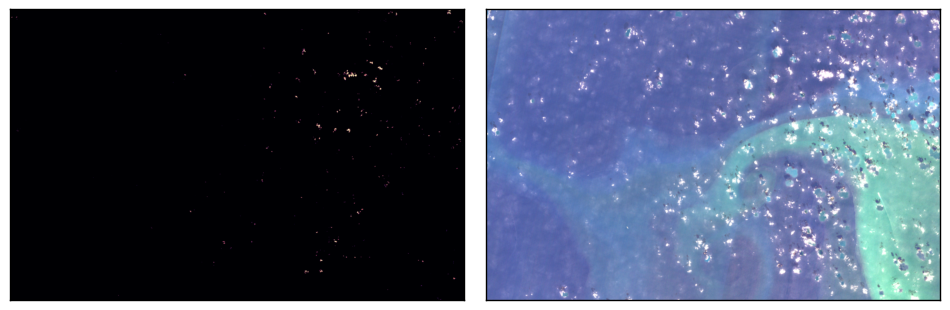

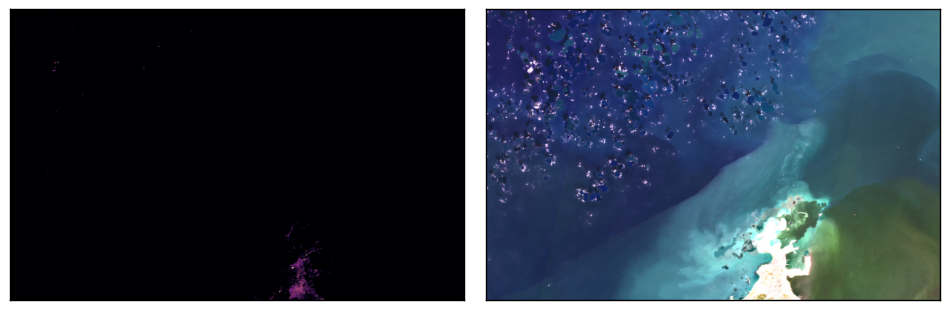

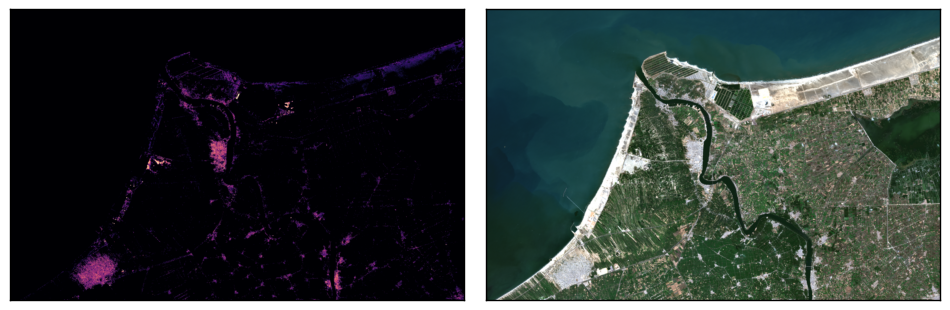

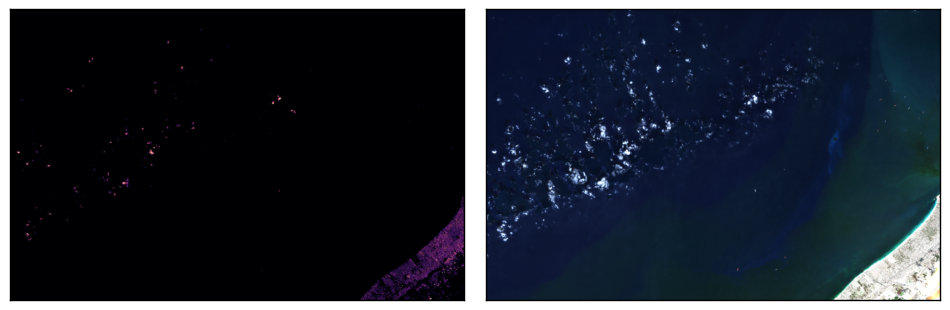

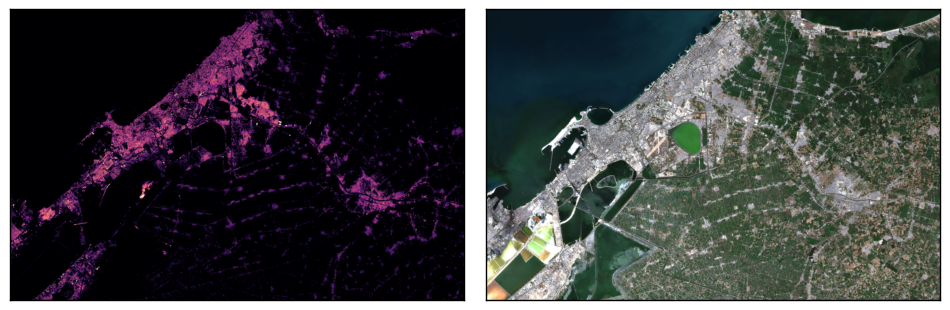

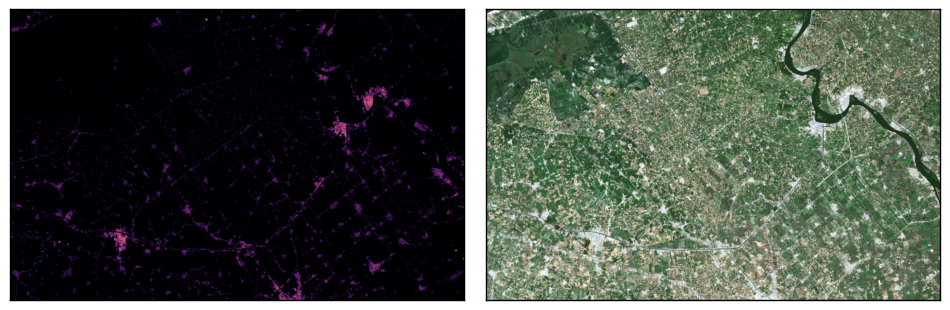

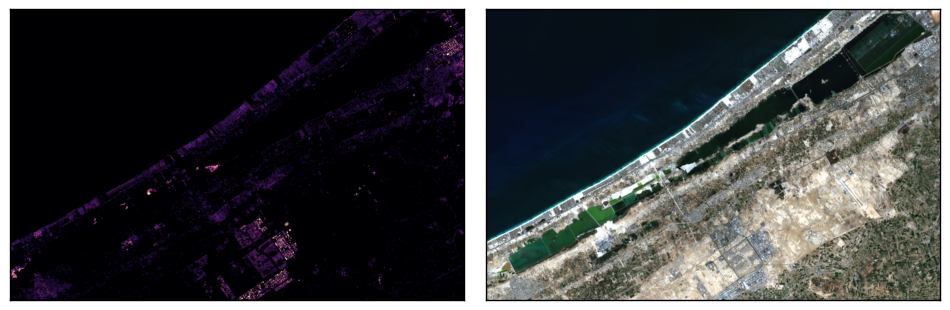

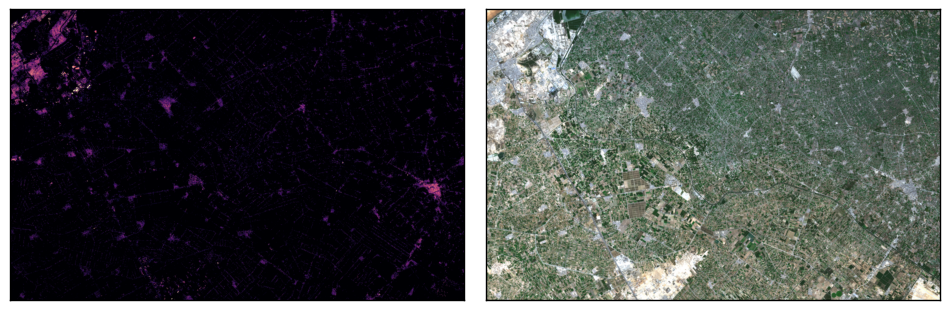

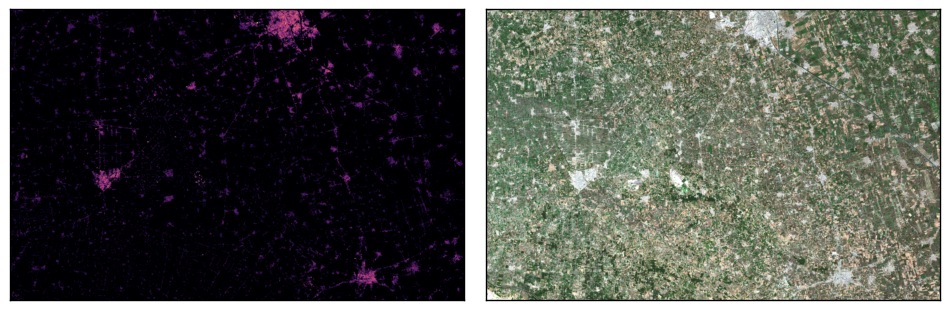

Whole-scene inference: 348.6 s, 4.60 Wh, 1.23 g CO2eq


EmissionsData(timestamp='2026-09-23T18:27:23', project_name='ccai-flood-part1-people', run_id='5b69f36e-ba24-4409-abef-3a4482db956c', experiment_id='5b0fa12a-3dd7-45bb-9766-cc326314d9f1', duration=348.5619839290001, emissions=0.0012321435307348174, emissions_rate=3.5349334641917713e-06, cpu_power=3.533437094657286, gpu_power=11.12389270701916, ram_power=10.0, cpu_energy=0.00045010775612876577, gpu_energy=0.0031857011596699994, ram_energy=0.000968235335925, energy_consumed=0.004604044251723765, water_consumed=0.0, country_name='The Netherlands', country_iso_code='NLD', region='groningen', cloud_provider='', cloud_region='', os='Linux-6.6.122+-x86_64-with-glibc2.39', python_version='3.13.15', codecarbon_version='3.2.9', cpu_count=2, cpu_model='Intel(R) Xeon(R) CPU @ 2.00GHz', gpu_count=1, gpu_model='1 x Tesla T4', longitude=6.5664, latitude=53.2222, ram_total_size=12.671417236328125, tracking_mode='machine', cpu_utilization_percent=1.4367816091954022, gpu_utilization_percent=11.612068965

In [43]:
# Lets predict all of alexandria
# Keeps running out of RAM here -> Reduce the size of alexandria dataset or
# Do the calculation in offsets.
# You could make a mosaic of the final images to create the whole scene again.
path_s2 = PATH_S2  # /content/S2.tif, downloaded at the top of the notebook

track_start("Whole-scene inference")

id = 0
predicted_files = []
for arr, offset in beo.raster_to_array_chunks(path_s2, 9, filled=True, fill_value=0.0, cast=np.float32):

    # Normalise the S2 data in the same fashion as previously.
    arr, _statdict = beo.scaler_truncate(arr, 0.0, 10000.0)

    # When running inference on computer vision models, especially small models like this,
    # it is very common to see noise around the edges of the patches. To alleviate this
    # we can predict multiple overlapping patches and weigh edge pixels less. We can also
    # take a robust score of the predictions like 'MAD', 'Median', or 'Olympian', to create
    # nice smooth predictions, even for very small models.
    with torch.no_grad():
        predicted = beo.predict_array(
            arr,
            predict,
            tile_size=PATCH_SIZE,
            n_offsets=3,
            merge_method="median",
            edge_weighted=True,
        )

    # Render an RGB image for comparison
    rgb = render_s2_as_rgb(arr[:, :, 0:3][:, :, ::-1])

    fig, (ax1, ax2) = custom_subplots(nrows=1, ncols=2, size=(12, 8))
    ax1.imshow(predicted, vmin=0.0, vmax=100.0, cmap="magma")
    ax2.imshow(rgb)
    plt.show()

    # Save the prediction
    out_path = beo.array_to_raster(
        predicted,
        reference=path_s2,
        out_path=os.path.join(FOLDER_PRED, f"prediction_{id}.tif"),
        pixel_offsets=offset,
    )

    id += 1
    predicted_files.append(out_path)

track_stop("Whole-scene inference")

# From left to right:
# prediction, RGB Sentinel 2 Render

<a name="model-card"></a>
## Model card

Every model that produces a map should ship with a short statement of what it is and where it breaks. Here is that statement for the model you just trained.

| | |
|---|---|
| **Model** | `SimpleConvNet` — 4 convolutional layers (~150k parameters), no downsampling and no skip connections, output clamped to [0, 100] |
| **Task** | Per-pixel regression of building area (m² per 10 m pixel) from Sentinel-2 reflectance (9 bands) |
| **Training data** | 32×32 px patches with 4 offset grids, taken from the 64 of the 78 tiles not held out for validation or testing; labels as described in the datasheet above |
| **Training setup** | See the constants cell: epochs, batch size, learning rate, and seed — Adam optimizer, MSE loss, validation loss tracked every epoch |
| **Evaluation** | RMSE / MAE / MSE on held-out tiles, plus precision / recall / F1 / IoU after thresholding at 1 m², compared against constant baselines |
| **Intended use** | Education; qualitative mapping of built-up density over this region |
| **Out of scope** | Reporting population counts; other regions, seasons, or sensors without retraining and re-validation; any automated decision about warnings, evacuation, or resource allocation |
| **Known failure modes** | Building density stands in for population, so dense industrial areas read as dense settlement and vice versa; label gaps in informal settlements propagate straight into the predictions; tile-edge inconsistencies (mitigated by overlapping predictions and median merging); bare rock, sand, and greenhouses can look built-up in reflectance; no calibrated uncertainty — a predicted value of 40 is not "40 m² ± something" |

 The validation and test tiles are held out at the tile level, which avoids the patch-overlap contamination described earlier — but they still come from the **same region, sensor, and season** as the training tiles. A held-out tile in the Nile delta resembles a training tile in the Nile delta far more than a tile over Jakarta, Lagos, or Rotterdam would. The metrics you got are therefore an optimistic estimate of what this model would do over a city it has never seen, and the honest way to report them is "held-out tiles, same region", not "test accuracy".


<a name="carbon-cost"></a>
# The Carbon Cost of This Notebook

We measured the two expensive phases — training and whole-scene inference. Let's stop the tracker and see what they cost. The numbers below are specific to *your* run: the hardware Colab allocated you, the number of epochs you chose, and the electricity grid the data centre sits on.


In [44]:
# Stop the tracker and summarise what this notebook cost.
CAR_G_CO2_PER_KM = 120.0  # An average new car in Europe emits roughly 120 g CO2 per km.

if globals().get("emissions_tracker") is None:
    print("Carbon tracking is off (or the tracker cell was not run), so there is nothing to report.")
else:
    total_kg = emissions_tracker.stop()
    summary = emissions_tracker.final_emissions_data

    print(f"{'Phase':<26}{'Time (s)':>10}{'Energy (Wh)':>14}{'CO2eq (g)':>12}")
    print("-" * 62)
    for phase_name, measurement in emission_tasks.items():
        print(
            f"{phase_name:<26}{measurement.duration:>10.1f}"
            f"{measurement.energy_consumed * 1000:>14.3f}"
            f"{measurement.emissions * 1000:>12.3f}"
        )
    print("-" * 62)
    print(f"{'Whole notebook':<26}{'':>10}{summary.energy_consumed * 1000:>14.3f}{total_kg * 1000:>12.3f}")

    # The grid you are plugged into matters as much as the code you wrote:
    # the same kWh emits ~8x more CO2 in a coal-heavy grid than in a hydro/nuclear one.
    # kg CO2eq / kWh -> g CO2eq / kWh
    intensity = (total_kg / summary.energy_consumed) * 1000 if summary.energy_consumed > 0 else 0.0

    print()
    print(f"CPU:            {summary.cpu_model} ({int(summary.cpu_count)} cores)")
    print(f"GPU:            {summary.gpu_model or 'none detected'} ({int(summary.gpu_count)})")
    print(f"Grid:           {summary.country_name} ({summary.country_iso_code}) - {intensity:.0f} g CO2eq/kWh")
    print(f"Equivalent to:  {total_kg * 1000 / CAR_G_CO2_PER_KM:.2f} km driven by an average car")
    print(f"Full log:       {os.path.join(FOLDER_PRED, 'emissions.csv')}")


Phase                       Time (s)   Energy (Wh)   CO2eq (g)
--------------------------------------------------------------
Model training                 169.7         3.620       0.969
Whole-scene inference          348.6         4.604       1.232
--------------------------------------------------------------
Whole notebook                               9.234       2.471

CPU:            Intel(R) Xeon(R) CPU @ 2.00GHz (2 cores)
GPU:            1 x Tesla T4 (1)
Grid:           The Netherlands (NLD) - 268 g CO2eq/kWh
Equivalent to:  0.02 km driven by an average car
Full log:       /content/CCAI_FLOODS_TUTORIAL_DATA_PREDICTIONS/emissions.csv


### Reading the number

Two things are usually more surprising than the total itself.

**Inference is not free.** Compare the two rows. Training was a one-off; inference over the scene is what an operational service would repeat for every new acquisition, over whole countries, for years. In deployed systems the lifetime cost of inference routinely dwarfs the cost of training. If you scale this notebook from Alexandria to the Mediterranean, that second row is the one that grows.
The same job run on a grid at 700 g CO₂eq/kWh emits roughly eight times what it would on one at 90 g. Choosing a low-carbon region for a training job is often a bigger lever than any optimisation you can make to the code.

### What this measurement does and does not include

CodeCarbon reports an *estimate*, and it is worth being precise about its boundaries:

* It measures the **energy drawn while your code runs** — CPU, GPU, and RAM. Where hardware power sensors are not readable (many virtual machines, most cloud CPUs), it falls back to modelled values based on the processor's rated draw, so treat the figures as an order of magnitude, not a meter reading.
* Grid carbon intensity is a **country- or region-level average**, not the real-time mix at the moment you ran.
* It does **not** include the embodied carbon of manufacturing the hardware, the satellites and ground segment that produced the data, the storage and transfer of that data, or data-centre cooling overhead beyond a default PUE assumption.

So the number is a floor, not a full life-cycle assessment. That is still far more useful than reporting nothing.


None of this argues against doing the work. A few grams of CO₂ to map who is exposed to flooding — against damage measured in lives and billions — is an easy trade. But the trade should be *stated*, not assumed, and it stops being obvious at scale: a foundation model pretrained on global satellite imagery can emit several tonnes. The question to carry forward is not "is this model too expensive?" but "is this the cheapest model that answers the question, and did I say what it cost?"

### Exercises

* Re-run training with more epochs, or a larger `PATCH_SIZE`, and compare the energy per phase. Does accuracy improve in proportion to the extra energy spent?
* Switch the Colab runtime from GPU to CPU and train again. The GPU draws far more power — but finishes much sooner. Which one used less energy overall?
* Open `emissions.csv` in the predictions folder. It has one row per run, with CPU, GPU, and RAM energy broken out. Plot energy against epochs across a few runs.
* Compare your training footprint with Part II's. The two models have almost the same architecture but different input channels and different amounts of data — where does the difference come from?


<a name="predictions-to-decisions"></a>
# From Predictions to Decisions

So far this has been a machine-learning exercise. But building-density maps like the one you just made are produced operationally, and it is worth being explicit about **how they are actually used, and by whom**.

## What you just built, in risk terms

Disaster risk is usually decomposed into three factors, and no single one of them answers the question "who needs help?":

| Factor | Question it answers | Source in this tutorial |
|---|---|---|
| **Hazard** | Where is the water? | Part II (Sentinel-1 → surface water) |
| **Exposure** | What and who is in the water's way? | **This notebook** (Sentinel-2 → building density) |
| **Vulnerability** | Who is least able to cope? | Not in this tutorial — see the limitations below |

Your map is the **exposure** layer. On its own it says nothing about flooding at all: it is a map of where people have built things. It becomes a risk product only when overlaid on a hazard layer. Overlaying them gives the statements that actually drive decisions: *"this many buildings are inside the flooded area"*, *"these neighbourhoods flood first if the water rises"*, *"these roads to the hospital are cut off"*.

## Decision workflows exposure maps feed

* **Preparedness** (before an event): combined with elevation-based flood susceptibility, exposure maps identify high-risk neighbourhoods, informing land-use planning, drainage investment, and evacuation routes.
* **Early warning and anticipatory action** (as an event develops): forecast rainfall plus susceptibility and exposure determine who gets warned and where aid is pre-positioned *before* the flood peaks.
* **Response planning** (during): rapid water maps intersected with exposure show which areas to evacuate first and where to site shelters and distribution points.
* **Recovery and resource allocation** (after): flooded area × building density supports damage assessment, prioritisation of reconstruction funds, and insurance payouts.
* **Filling the map gap**: in many rapidly growing cities there is simply no up-to-date building inventory. A model like this one produces a first approximation from free satellite imagery, in hours, at no marginal cost.

## Who the stakeholders are

* **National and local government**: civil-protection agencies, hydro-meteorological services, and municipalities — the ones who issue warnings and order evacuations.
* **International mapping services**: the [Copernicus Emergency Management Service](https://emergency.copernicus.eu/) and [UNOSAT](https://unosat.org/) produce exactly this kind of rapid exposure and damage mapping, on request, within hours of a disaster.
* **Humanitarian organisations**: IFRC and Red Cross / Red Crescent societies (including forecast-based financing and anticipatory-action programmes), UN agencies, and NGOs deciding where to send teams and supplies.
* **Financial actors**: the World Bank / GFDRR, development banks, and insurers using exposure estimates for risk financing and payouts.
* **Affected communities**: the people the maps are ultimately about — and who are usually *not* in the loop when the maps are made. Keep that in mind when you read the next section.


In [45]:
# A first "decision product": how much built-up area did we actually map?
PIXEL_AREA_M2 = 10 * 10  # Sentinel pixels are 10 m x 10 m.

total_built_m2 = 0.0
total_scene_m2 = 0.0
for f in predicted_files:
    pred = beo.raster_to_array(f, filled=True, fill_value=0.0)
    total_built_m2 += float(np.sum(pred))            # each value is m2 of building in that pixel
    total_scene_m2 += pred.size * PIXEL_AREA_M2      # each pixel covers 100 m2 of ground

print(f"Mapped built-up area: {total_built_m2 / 1e6:8.1f} km2")
print(f"Scene area:           {total_scene_m2 / 1e6:8.1f} km2")
print(f"Built-up share:       {100 * total_built_m2 / total_scene_m2:8.1f} %")

# Exercise: this is the denominator of an exposure statistic, not the statistic
# itself. In Part II you produce a water mask for the same scene. Intersect the
# two and compute the built-up area that falls *inside* the water. That single
# number - exposed built-up area - is the kind of figure a civil-protection
# agency actually acts on. Who else, from the stakeholder list above, would want
# it, and in what form: a number, a map, or a per-neighbourhood table?


Mapped built-up area:    143.1 km2
Scene area:             9484.3 km2
Built-up share:            1.5 %


Open water (NDWI > 0):   4352.0 km2
Built-up area inside water          :   2.99 km2 ( 2.1 % of all mapped built-up area)
Built-up area within 100 m of water :  20.57 km2 (14.4 % of all mapped built-up area)
Built-up area within 500 m of water :  81.85 km2 (57.2 % of all mapped built-up area)


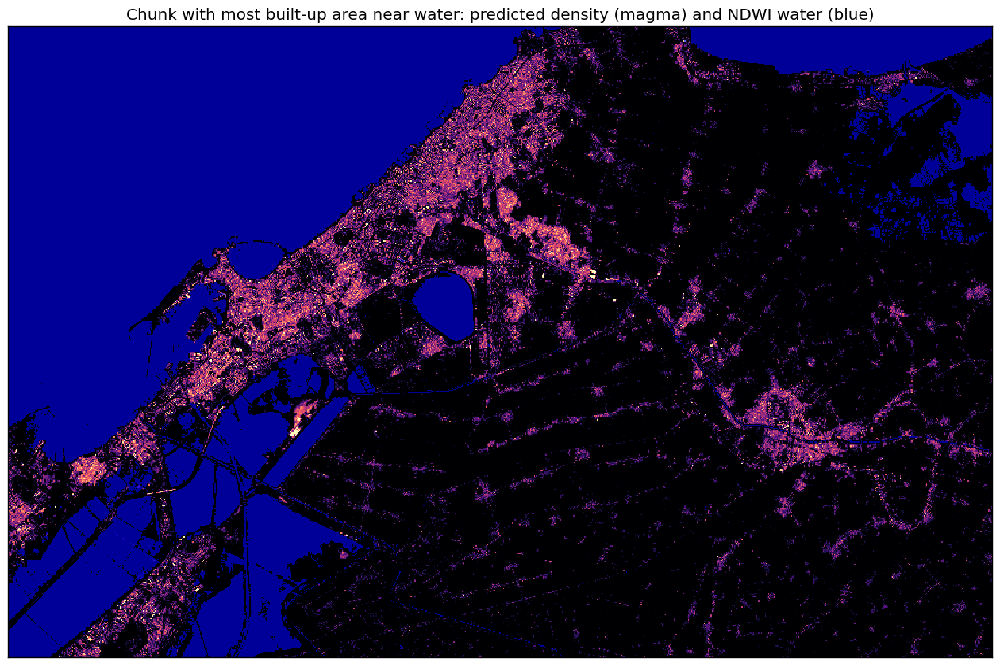

In [46]:
# Exercise solution: intersect the exposure layer with a water layer.
# Part II builds a proper water model; here we use a quick, transparent stand-in computed from the
# same Sentinel-2 scene: NDWI = (Green - NIR) / (Green + NIR), water where NDWI > 0 (McFeeters, 1996).
from scipy import ndimage

BUFFERS_M = [0, 100, 500]                    # inside water, and within 100 m / 500 m of it
built_near_water = {b: 0.0 for b in BUFFERS_M}
water_m2, best_chunk = 0.0, None

chunks = beo.raster_to_array_chunks(PATH_S2, 9, filled=True, fill_value=0.0, cast=np.float32)
for (arr, offset), f in zip(chunks, predicted_files):
    green, nir = arr[:, :, 1], arr[:, :, 6]
    with np.errstate(invalid="ignore", divide="ignore"):
        ndwi = (green - nir) / (green + nir)
    water = np.nan_to_num(ndwi, nan=-1.0) > 0.0            # nodata (0/0) is never water
    water_m2 += float(water.sum()) * PIXEL_AREA_M2
    pred = np.squeeze(beo.raster_to_array(f, filled=True, fill_value=0.0))
    dist_m = ndimage.distance_transform_edt(~water) * 10.0  # metres to the nearest water pixel
    near = {b: float(pred[dist_m <= b].sum()) for b in BUFFERS_M}
    for b in BUFFERS_M:
        built_near_water[b] += near[b]
    if best_chunk is None or near[500] > best_chunk[0]:
        best_chunk = (near[500], pred[::4, ::4].copy(), water[::4, ::4].copy())
    del arr, ndwi, water, dist_m, pred

print(f"Open water (NDWI > 0): {water_m2 / 1e6:8.1f} km2")
for b in BUFFERS_M:
    label = "inside water" if b == 0 else f"within {b} m of water"
    print(f"Built-up area {label:<22}: {built_near_water[b] / 1e6:6.2f} km2 "
          f"({100 * built_near_water[b] / total_built_m2:4.1f} % of all mapped built-up area)")

_, pred_ds, water_ds = best_chunk
fig, ax = custom_subplots()
ax.imshow(pred_ds, vmin=0, vmax=100, cmap="magma", interpolation="nearest")
ax.imshow(np.ma.masked_where(~water_ds, water_ds), cmap="winter", alpha=0.6, interpolation="nearest")
ax.set_title("Chunk with most built-up area near water: predicted density (magma) and NDWI water (blue)")
plt.show()

# Caveats: NDWI from one optical date is a normal-water map, not a flood map, so the "inside water"
# number is mostly piers, ports and mis-classified pixels. The buffers are what matter for
# exposure. Distances are computed per chunk, so buffers do not cross chunk edges. Part II's
# SAR-based water model can replace the NDWI mask one-to-one.

**Answer to the decision-product exercise**

With the NDWI water layer, the model maps **143 km²** of built-up area in the scene. **20.6 km² (14%) lies within 100 m of open water and 81.9 km² (57%) within 500 m.** The 3.0 km² "inside water" is mostly piers, port infrastructure and mis-classified pixels. That is expected: a single-date NDWI map shows *normal* water, not a flood. So this is a proximity-to-water exposure indicator; Part II's SAR water map from an actual flood date turns it into real flood exposure.

Who wants the number, and in what form:

| Stakeholder | What they need | Best form |
|---|---|---|
| Civil protection / governorate crisis unit | Which districts to warn and evacuate first | A **per-neighbourhood table** (exposed built-up km², ranked) plus a map for the operations room |
| Copernicus EMS / UNOSAT | A standard rapid-mapping product | A **map** (GeoTIFF / shapefile) with a documented method and confidence notes |
| Red Crescent / humanitarian NGOs | Where to pre-position aid and shelters | **Per-district numbers** converted to an approximate number of people (using WorldPop/GHSL, not building density alone) |
| World Bank / GFDRR / insurers | Risk financing and payout triggers | **One aggregate number with uncertainty ranges**, reproducible over time |
| Affected communities | "Is my street at risk, and what do I do?" | **Plain-language local maps** and warnings, co-produced with them, never just a raster |

<a name="limitations-responsible-use"></a>
# Limitations & Responsible Use

The section above shows the promise; this one is about the responsibility. A model-based exposure map is **not a neutral or perfect picture of reality** — it is a chain of modelling choices (sensor, labels, patch size, architecture, training region), each of which shapes where the map says buildings are. When such maps influence where warnings, resources, and support are directed, their limitations become people's problems.

**Building density is not population.** This is the single most important caveat in this notebook, and it is baked into the title: we predict *building density* and call it a proxy for *population density*. The proxy breaks in both directions. A warehouse district, a shopping centre, and an industrial estate register as dense built-up area with almost nobody living there at night. A crowded informal settlement of small, low structures registers as sparse. Occupancy rates, household sizes, and building use all vary enormously and none of them are visible from above. If you need people, use a population product built for it (WorldPop, GHSL) — and read *its* limitations too.

**Exposure is not vulnerability.** Counting buildings in a flood zone tells you what is *exposed*, not who can cope. Two equally flooded neighbourhoods can need very different help depending on construction quality, income, age, disability, and access to transport. Building height matters especially: in a deep flood, someone in a single-storey house cannot escape vertically while someone in a multi-storey block can move upstairs and wait for rescue. A map that shows only exposure will systematically understate the needs of the most vulnerable.

**Data gaps and representation.** Building datasets are least accurate exactly where risk is often highest. Informal settlements and rapidly growing peri-urban areas are chronically under-mapped in both Google Open Buildings and OpenStreetMap, and global models are trained mostly on well-mapped regions. Our labels inherit those gaps, and the model learns them: it will under-predict density in precisely the neighbourhoods that are hardest to reach and most likely to be flooded. **The communities missing from the data are missing from the map — and therefore at risk of being missing from the response.**

**Uncertainty.** The model outputs a number per pixel with no calibrated confidence attached: a prediction of 40 is not "40 m² ± something", and it is not a probability. Honest products communicate uncertainty — confidence maps, ranges, masks of known artifacts — instead of presenting one crisp polygon as truth.

**Spatial resolution.** At 10 m per pixel, a map can support neighbourhood-level decisions ("this district is densely built") but not building-level ones ("this house is occupied"). Narrow streets, small structures, and buildings under tree cover are simply invisible. Match the decision to the resolution — never the other way around.

**Generalisation.** The model was trained on one region, one sensor, and essentially one season. Building materials, roof colours, urban form, and vegetation differ enormously between cities; a model trained on Alexandria has no reason to work in Jakarta. Retrain and re-validate, and report where the metrics do *not* apply.

**High-stakes use.** Errors are not symmetric: over-predicting exposure wastes resources and erodes trust; under-predicting it means people who never get warned. When a map influences who gets helped, its errors decide who doesn't. Practical rules of thumb used by operational services:

* Model outputs are **decision support, not decision making** — a human who understands the local context stays in the loop.
* Validate against ground truth (or at least independent data) before operational use, and report metrics honestly — including where they do not apply.
* Ship documentation with every model and dataset (that is what the [model card](#model-card) and the datasheet above are for).
* Ask who is *not* represented in your data — and what your map will do to them.

**Reflection**: look back at your predicted map of Alexandria. If it fed an aid-allocation decision tomorrow, which neighbourhoods would you least trust it in, who would you consult before acting, and what would you refuse to let the map decide on its own?


**My answer to the reflection**

**Where I would trust the map least**

- **The informal and fast-growing fringes of the city**, for example towards Al Max, Al Amreya and the Borg El Arab corridor. Building footprints there are most often missing from Open Buildings and OSM, and the S2 analysis in the solutions shows the model systematically **under-predicts dense pixels**. So the neighbourhoods that are most crowded and least mapped are the ones that come out too light.
- **Port, industrial and warehouse zones** (Dekheila, the western industrial belt). Large roofs read as "dense settlement", but almost nobody lives there at night, so the map would pull resources towards empty buildings.
- **Greenhouses, bare limestone ridges and the salt flats and shores around Lake Mariout.** These can look built-up in reflectance, which gives false alarms.
- **Anywhere covered by training tiles.** The map looks best there because the model has seen those pixels, not because it is more correct.

**Who I would consult before acting**

The Alexandria Governorate's crisis-management and civil-protection units, the Egyptian Red Crescent, municipal planners with census data (CAPMAS) and up-to-date cadastral data, local NGOs and community leaders in the affected districts, and, most of all, the residents themselves. They know where people actually live, who can't evacuate on their own (elderly, disabled, people living on ground floors), and which roads flood first.

**What I would not let the map decide on its own**

Who does or does not receive warnings, aid or evacuation support. Whether an area is "empty": the absence of predicted buildings must never be read as the absence of people. Compensation or insurance decisions for individual households. Any relocation or demolition decision. At best the map says **where to look first**; a person who knows the place decides.

## Reflections and exercises

* The model used was very simple and had some key limitations. Can you identify what they were? Can you imagine and/or design a better architecture that would outperform the simple model?
* More data is available to run the model, than  what was used. How would you update the model to include SAR and possibly terrain data into the classification as well? Could multi-modality reduce some of the shortcomings of the S2 approach?
* We report precision, recall, F1 and IoU at a threshold of 1 m². Sweep the threshold instead of fixing it, and plot precision against recall. Which operating point would you hand to someone planning an evacuation, and which to someone estimating reconstruction costs?
* Where did the simple model do well and where did not do so well? Reflect on the results.
* We now track a validation loss every epoch, but we do nothing with it. Automate the decision: implement early stopping (halt when validation loss has not improved for N epochs), keep the best checkpoint rather than the last one, or reduce the learning rate on a plateau. Compare the test metrics before and after.
* Our validation and test tiles come from the same region as the training tiles. Build a genuinely harder evaluation: hold out a spatially contiguous block of tiles rather than a random scatter of them. Do the metrics drop? That drop is the part of your score that was regional similarity rather than skill.
* The training loop uses no data augmentation. Part II uses `beo.AugmentationDataset` with rotation, mirroring, and cutmix — port it here. Augmentation makes the training data harder to fit, so watch what it does to the *gap* between the training and validation curves rather than to the training loss alone.
* Using the `buteo.array_to_raster` function you can export the predictions an investigate them in QGIS. It is very important to visually inspect your results and not rely on metrics alone, which can skew your thinking and optimization approaches.

> **All of these exercises are worked through, with code, results and written answers, in [Solutions to the exercises](#solutions) below.**

Optional: Uncomment the code below to download files to inspect in QGIS or other GIS software.

In [47]:
# from google.colab import files

# files.download(predicted_files[5])

<a name="solutions"></a>
# Solutions to the exercises

This section works through every open question in the notebook: the **Reflections and exercises** list above, the **carbon-cost exercises**, and the **decision-product** and **responsible-use** reflections (those two are answered directly under their own sections).

To keep the comparisons fair, every experiment below uses the same seed, patch size, batch size and learning rate as the main model, is scored on held-out tiles with the same metrics (RMSE / MAE / MSE, plus precision / recall / F1 / IoU at 1 m²), and has its energy and emissions measured with CodeCarbon. A summary table at the end puts them all side by side.

| # | Exercise | What is done here |
|---|---|---|
| S1 | Sweep the threshold | Full precision–recall curve and four named operating points |
| S2 | Where did the model do well? | Errors by building-density bin and per test tile, best vs. worst tile |
| S3 | Early stopping | Early stopping, best checkpoint, learning rate reduced on plateau |
| S4 | A better architecture | A small residual U-Net with a bottleneck and skip connections |
| S5 | Multi-modality | Sentinel-2 + Sentinel-1 + DEM as a 15-channel input |
| S6 | A harder evaluation | A spatially contiguous block of test tiles instead of a random scatter |
| S7 | Data augmentation | Rotations, flips and CutMix, and their effect on the train/val gap |
| S8 | Carbon exercises | GPU vs. CPU, energy vs. epochs, reading `emissions.csv` |
| S9 | Summary | All experiments, accuracy vs. energy |
| S10 | Written answers | Answers to the reflection questions, using the numbers produced here |

In [48]:
# ---------------------------------------------------------------------------
# S0 - Shared helpers used by all the exercise solutions below
# ---------------------------------------------------------------------------
import copy
import time
import pandas as pd
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from IPython.display import display
from codecarbon import EmissionsTracker


def seed_everything(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


def load_split(name, keys=("x_s2",)):
    """Load a split written earlier and stack the requested modalities on the channel axis."""
    with np.load(os.path.join(data_folder, f"{name}.npz")) as f:
        x = np.concatenate([f[k].astype(np.float32) for k in keys], axis=-1)
        y = f["y"].astype(np.float32)
    return x, y


class PatchDataset(Dataset):
    """Channel-last NumPy patches -> channel-first tensors, with optional augmentation.

    Augmentation (training only): random 90-degree rotations, horizontal/vertical flips,
    and CutMix - a random square copied from another patch, image AND label together,
    so the target stays correct. Only geometric transforms are used: the reflectance
    values carry physical meaning, so we do not jitter colours or brightness.
    """
    def __init__(self, x, y, augment=False, cutmix_p=0.3):
        self.x = torch.from_numpy(np.ascontiguousarray(x.transpose(0, 3, 1, 2)))
        self.y = torch.from_numpy(np.ascontiguousarray(y.transpose(0, 3, 1, 2)))
        self.augment = augment
        self.cutmix_p = cutmix_p

    def __len__(self):
        return len(self.x)

    def __getitem__(self, i):
        x, y = self.x[i], self.y[i]
        if self.augment:
            # torch's RNG (not numpy's) so that every DataLoader worker draws different numbers.
            k = int(torch.randint(0, 4, (1,)))
            x, y = torch.rot90(x, k, (1, 2)), torch.rot90(y, k, (1, 2))
            if torch.rand(1).item() < 0.5:
                x, y = torch.flip(x, (2,)), torch.flip(y, (2,))
            if torch.rand(1).item() < 0.5:
                x, y = torch.flip(x, (1,)), torch.flip(y, (1,))
            if torch.rand(1).item() < self.cutmix_p:
                j = int(torch.randint(0, len(self.x), (1,)))
                s = int(torch.randint(8, 17, (1,)))
                r0 = int(torch.randint(0, x.shape[1] - s + 1, (1,)))
                c0 = int(torch.randint(0, x.shape[2] - s + 1, (1,)))
                x, y = x.clone(), y.clone()
                x[:, r0:r0 + s, c0:c0 + s] = self.x[j][:, r0:r0 + s, c0:c0 + s]
                y[:, r0:r0 + s, c0:c0 + s] = self.y[j][:, r0:r0 + s, c0:c0 + s]
        return x.float().contiguous(), y.float().contiguous()


class Measured:
    """Context manager: wall time, energy (Wh) and emissions (g CO2eq) of a block of code.

    Each measurement is a separate CodeCarbon run, so it also becomes one row of emissions.csv.
    """
    def __init__(self, name, power_secs=5):
        self.name, self.power_secs = name, power_secs
        self.seconds = self.wh = self.g = float("nan")

    def __enter__(self):
        self.tracker = None
        if globals().get("TRACK_EMISSIONS", False):
            try:
                self.tracker = EmissionsTracker(
                    project_name=self.name, output_dir=FOLDER_PRED, output_file="emissions.csv",
                    measure_power_secs=self.power_secs, log_level="error", allow_multiple_runs=True)
                self.tracker.start()
            except Exception as error:
                print(f"CodeCarbon unavailable ({error}); measuring time only.")
                self.tracker = None
        self.t0 = time.time()
        return self

    def __exit__(self, *exc):
        if torch.cuda.is_available():
            torch.cuda.synchronize()
        self.seconds = time.time() - self.t0
        if self.tracker is not None:
            kg = self.tracker.stop() or 0.0
            self.g = kg * 1000
            self.wh = self.tracker.final_emissions_data.energy_consumed * 1000
        print(f"[{self.name}] {self.seconds:.1f} s, {self.wh:.2f} Wh, {self.g:.3f} g CO2eq")
        return False


def evaluate(y_true, y_hat, thr=1.0):
    """Regression + thresholded (built-up / not built-up) metrics, computed per pixel."""
    y_true = np.asarray(y_true, dtype=np.float64).ravel()
    y_hat = np.asarray(y_hat, dtype=np.float64).ravel()
    err = y_hat - y_true
    t, p = y_true > thr, y_hat > thr
    tp, fp, fn = np.sum(p & t), np.sum(p & ~t), np.sum(~p & t)
    precision = tp / (tp + fp) if tp + fp else 0.0
    recall = tp / (tp + fn) if tp + fn else 0.0
    mse = float(np.mean(err ** 2))
    return {
        "RMSE": float(np.sqrt(mse)), "MAE": float(np.mean(np.abs(err))), "MSE": mse,
        # 1 - MSE / MSE of the "always predict 0" baseline: comparable across different test sets.
        "skill vs. zero": 1.0 - mse / float(np.mean(y_true ** 2)),
        "Precision": float(precision), "Recall": float(recall),
        "F1": float(2 * precision * recall / (precision + recall)) if precision + recall else 0.0,
        "IoU": float(tp / (tp + fp + fn)) if tp + fp + fn else 0.0,
    }


def predict_patches(net, x, batch_size=512):
    """Predict channel-last patches in batches; returns channel-last predictions."""
    net.eval()
    out = []
    with torch.no_grad():
        for k in range(0, len(x), batch_size):
            xb = torch.from_numpy(np.ascontiguousarray(x[k:k + batch_size].transpose(0, 3, 1, 2))).float().to(device)
            out.append(net(xb).cpu().numpy())
    return np.concatenate(out).transpose(0, 2, 3, 1)


def mean_loss(net, loader):
    """Per-pixel MSE over a whole loader, in eval mode."""
    net.eval()
    total, n = 0.0, 0
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            total += nn.functional.mse_loss(net(xb), yb, reduction="sum").item()
            n += yb.numel()
    return total / n


def train_model(net, train_ds, val_ds, epochs=EPOCHS, lr=LEARNING_RATE, patience=None, plateau=False, name="run"):
    """Adam + MSE, validation loss after every epoch.

    patience: stop once validation loss has not improved for this many epochs.
    plateau:  halve the learning rate when validation loss stalls for an epoch.
    With either option on, the weights of the best validation epoch are restored at the end.
    """
    net.to(device)
    dl = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True, drop_last=True)
    dl_val = DataLoader(val_ds, batch_size=256, shuffle=False, num_workers=2, pin_memory=True)
    opt = optim.Adam(net.parameters(), lr=lr)
    sched = optim.lr_scheduler.ReduceLROnPlateau(opt, factor=0.5, patience=1) if plateau else None
    hist = {"train": [], "val": [], "lr": [], "best_epoch": None}
    best, best_state, bad = float("inf"), None, 0
    for ep in range(epochs):
        net.train()
        running, nb = 0.0, 0
        for xb, yb in dl:
            xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
            opt.zero_grad()
            loss = nn.functional.mse_loss(net(xb), yb)
            loss.backward()
            opt.step()
            running += loss.item()
            nb += 1
        val = mean_loss(net, dl_val)
        hist["train"].append(running / nb)
        hist["val"].append(val)
        hist["lr"].append(opt.param_groups[0]["lr"])
        if sched is not None:
            sched.step(val)
        flag = ""
        if val < best:
            best, best_state, bad, flag = val, copy.deepcopy(net.state_dict()), 0, "  <- best so far"
            hist["best_epoch"] = ep + 1
        else:
            bad += 1
        print(f"[{name}] epoch {ep + 1:02d}  train={running / nb:8.2f}  val={val:8.2f}  lr={hist['lr'][-1]:.1e}{flag}")
        if patience is not None and bad >= patience:
            print(f"[{name}] early stop: no improvement for {patience} epochs.")
            break
    if (patience is not None or plateau) and best_state is not None:
        net.load_state_dict(best_state)
        print(f"[{name}] restored the best checkpoint (epoch {hist['best_epoch']}, val={best:.2f}).")
    net.eval()
    return hist


def plot_curves(hists, title):
    fig, ax = plt.subplots(figsize=(9, 4.5))
    for name, h in hists.items():
        line, = ax.plot(range(1, len(h["train"]) + 1), h["train"], "-o", ms=3, label=f"{name}: train")
        ax.plot(range(1, len(h["val"]) + 1), h["val"], "--s", ms=3, color=line.get_color(), label=f"{name}: validation")
        if h.get("best_epoch"):
            ax.axvline(h["best_epoch"], color=line.get_color(), ls=":", lw=1)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("MSE loss")
    ax.set_title(title)
    ax.legend(fontsize=8)
    plt.show()


def n_params(net):
    return sum(p.numel() for p in net.parameters() if p.requires_grad)


experiments = {}   # experiment name -> metrics + cost; filled in by every experiment below


def log_experiment(name, metrics, epochs, meas=None, params=None):
    row = {"epochs": epochs, **metrics}
    if meas is not None:
        row.update({"time (s)": meas.seconds, "energy (Wh)": meas.wh, "CO2eq (g)": meas.g})
    if params is not None:
        row["parameters"] = params
    experiments[name] = row
    return pd.Series(row).round(3)


# The main model trained above is the reference point for everything that follows.
_task = emission_tasks.get("Model training") if globals().get("emission_tasks") else None
experiments["A. Baseline: SimpleConvNet, S2, random tile split"] = {
    "epochs": EPOCHS, **evaluate(y_test, y_pred),
    "time (s)": getattr(_task, "duration", float("nan")),
    "energy (Wh)": getattr(_task, "energy_consumed", float("nan")) * 1000,
    "CO2eq (g)": getattr(_task, "emissions", float("nan")) * 1000,
    "parameters": n_params(model),
}

# Datasets reused by several experiments (Sentinel-2 only, the same random tile split as above).
x_te_s2, y_te = load_split("test")
ds_train_s2 = PatchDataset(x_train, y_train)
ds_val_s2 = PatchDataset(x_val, y_val)
print(f"train {len(ds_train_s2):,} | validation {len(ds_val_s2):,} | test {len(x_te_s2):,} patches")
pd.DataFrame(experiments).T.round(3)

train 29,760 | validation 862 | test 2,182 patches


,epochs,RMSE,MAE,MSE,skill vs. zero,Precision,Recall,F1,IoU,time (s),energy (Wh),CO2eq (g),parameters
"A. Baseline: SimpleConvNet, S2, random tile split",10.0,6.705,1.122,44.96,0.35,0.463,0.688,0.553,0.382,169.689,3.62,0.969,153985.0


## S1 · Sweeping the threshold: the precision–recall curve

*Exercise: sweep the threshold instead of fixing it and plot precision against recall. Which operating point would you give someone planning an evacuation, and which to someone estimating reconstruction costs?*

We keep the **definition** of built-up fixed (label > 1 m² per pixel) and sweep only the **decision threshold** applied to the model's predicted density. Each threshold gives one (recall, precision) point. The area under the curve (average precision, AP) summarises the whole curve in one number that doesn't depend on any particular threshold.

Average precision (area under the PR curve): 0.505
A no-skill classifier would score 0.033 (the share of built-up pixels).
Built-up pixels predicted as exactly 0 (unrecoverable at any threshold): 28.9 %


,threshold on prediction (m2),precision,recall,F1,IoU
operating point,,,,,
default (prediction > 1 m2),1.001,0.463,0.688,0.553,0.382
maximum F1,3.836,0.522,0.617,0.565,0.394
"evacuation planning (max recall, 0.71)",0.000,0.441,0.711,0.545,0.374
reconstruction costing (precision >= 0.80),24.234,0.800,0.198,0.317,0.188


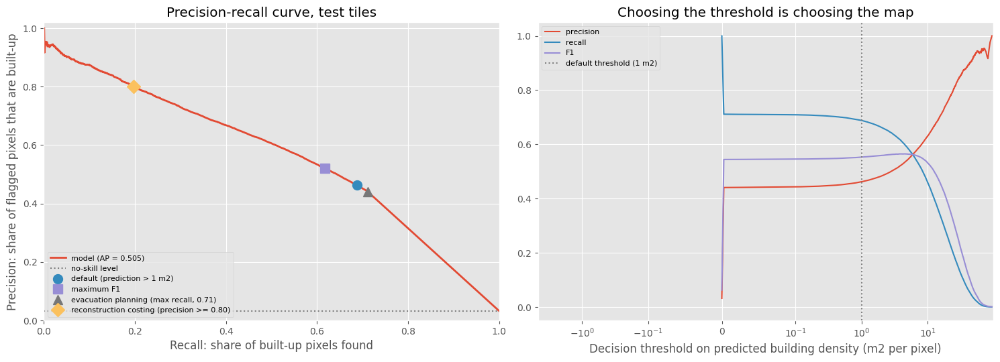

In [60]:
# S1 - Precision-recall curve of the baseline model on the test tiles
from sklearn.metrics import precision_recall_curve, average_precision_score

y_true_bin = (y_test.ravel() > threshold).astype(np.uint8)   # "built-up" = label > 1 m2 (fixed)
scores = y_pred.ravel()                                       # we sweep the threshold on the prediction
prec, rec, thr = precision_recall_curve(y_true_bin, scores)
prec, rec = prec[:-1], rec[:-1]      # drop the artificial (P=1, R=0) end point so arrays align with thr
f1s = 2 * prec * rec / np.clip(prec + rec, 1e-12, None)
ap = average_precision_score(y_true_bin, scores)

i_f1 = int(np.argmax(f1s))
# Evacuation: missing people is the costly error -> highest threshold that still finds >= 90 % of built-up pixels.
# A threshold of 0 is excluded: it flags every single pixel, which is not a map. Because the model's
# output is clamped at 0, many built-up pixels get exactly 0 and can never be recovered by lowering
# the threshold, so if 90 % recall is out of reach we take the highest recall any real threshold gives.
positive = thr > 0
ok = np.where(positive & (rec >= 0.90))[0]
i_evac = int(ok[-1]) if len(ok) else int(np.where(positive)[0][0])
evac_name = "evacuation planning (recall >= 0.90)" if len(ok) else f"evacuation planning (max recall, {rec[i_evac]:.2f})"
# Reconstruction costing: false alarms inflate budgets -> best recall among thresholds with precision >= 0.80.
cand = np.where(prec >= 0.80)[0]
i_cost = int(cand[np.argmax(rec[cand])]) if len(cand) else i_f1
i_default = min(int(np.searchsorted(thr, threshold, side="right")), len(thr) - 1)   # prediction > 1 m2


def op_row(name, k):
    p, r = prec[k], rec[k]
    iou = 1.0 / (1.0 / p + 1.0 / r - 1.0) if p > 0 and r > 0 else 0.0
    return {"operating point": name, "threshold on prediction (m2)": float(thr[k]),
            "precision": p, "recall": r, "F1": f1s[k], "IoU": iou}


operating_points = pd.DataFrame([
    op_row("default (prediction > 1 m2)", i_default),
    op_row("maximum F1", i_f1),
    op_row(evac_name, i_evac),
    op_row("reconstruction costing (precision >= 0.80)", i_cost),
]).set_index("operating point")

print(f"Average precision (area under the PR curve): {ap:.3f}")
print(f"A no-skill classifier would score {y_true_bin.mean():.3f} (the share of built-up pixels).")
print(f"Built-up pixels predicted as exactly 0 (unrecoverable at any threshold): {100 * np.mean(scores[y_true_bin == 1] <= 0):.1f} %")
if not len(cand):
    print("No threshold reaches precision 0.80; the costing row falls back to the max-F1 point.")
display(operating_points.round(3))

fig, (a1, a2) = plt.subplots(1, 2, figsize=(15, 5.5))
step = max(1, len(thr) // 5000)       # thin the curve for plotting only
a1.plot(rec[::step], prec[::step], lw=2, label=f"model (AP = {ap:.3f})")
a1.axhline(y_true_bin.mean(), ls=":", c="grey", label="no-skill level")
for (name, row), marker in zip(operating_points.iterrows(), ["o", "s", "^", "D"]):
    a1.plot(row["recall"], row["precision"], marker, ms=10, label=name)
a1.set_xlabel("Recall: share of built-up pixels found")
a1.set_ylabel("Precision: share of flagged pixels that are built-up")
a1.set_title("Precision-recall curve, test tiles")
a1.set_xlim(0, 1)
a1.set_ylim(0, 1.02)
a1.legend(fontsize=8, loc="lower left")

a2.plot(thr[::step], prec[::step], label="precision")
a2.plot(thr[::step], rec[::step], label="recall")
a2.plot(thr[::step], f1s[::step], label="F1")
a2.axvline(threshold, ls=":", c="grey", label="default threshold (1 m2)")
a2.set_xscale("symlog", linthresh=0.1)
a2.set_xlabel("Decision threshold on predicted building density (m2 per pixel)")
a2.set_title("Choosing the threshold is choosing the map")
a2.legend(fontsize=8)
plt.tight_layout()
plt.show()

## S2 · Where does the simple model do well, and where does it not?

*Exercise: where did the simple model do well and where did it not? Reflect on the results.*

Two views of the same errors: **by building density** (does the model get empty land, sparse and dense areas right?) and **by test tile** (are some places much worse than others?). A signed **bias** (prediction − label) tells us whether errors are random or systematic.

,pixels,share of pixels (%),mean label,mean prediction,bias (pred - label),MAE,RMSE,share of total squared error (%)
label density (m2/pixel),,,,,,,,
0 (no buildings),2155938,96.49,0.000000,0.24,0.240000,0.240000,1.980000,8.450000
0-1,5332,0.24,0.410000,6.14,5.740000,6.130000,11.090000,0.650000
1-10,16715,0.75,4.900000,7.06,2.160000,7.360000,10.670000,1.890000
10-30,20082,0.90,19.290001,9.94,-9.350000,13.780000,15.950000,5.090000
30-60,19754,0.88,43.730000,14.13,-29.600000,30.629999,33.720001,22.360001
60-100,16547,0.74,79.339996,21.66,-57.689999,57.799999,61.130001,61.560001


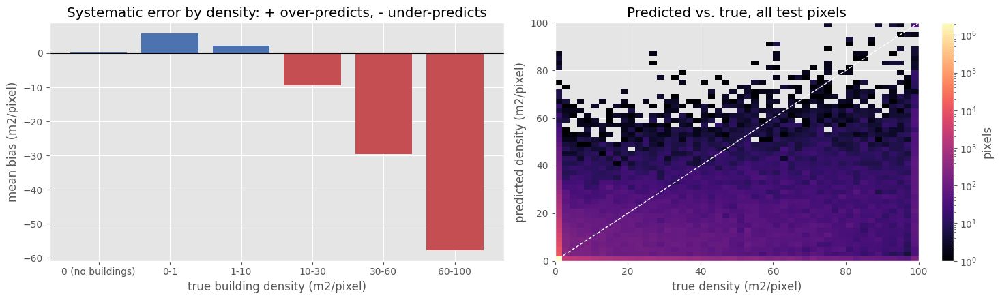

In [50]:
# S2a - Errors by building-density bin (test patches, baseline model)
yt, yp = y_test.ravel(), y_pred.ravel()
edges = [0.0, 1e-6, 1.0, 10.0, 30.0, 60.0, 100.0 + 1e-6]
names = ["0 (no buildings)", "0-1", "1-10", "10-30", "30-60", "60-100"]
bin_idx = np.digitize(yt, edges) - 1
rows = []
for b, name in enumerate(names):
    sel = bin_idx == b
    if sel.sum() == 0:
        continue
    e = yp[sel] - yt[sel]
    rows.append({"label density (m2/pixel)": name, "pixels": int(sel.sum()), "share of pixels (%)": 100 * sel.mean(),
                 "mean label": yt[sel].mean(), "mean prediction": yp[sel].mean(),
                 "bias (pred - label)": e.mean(), "MAE": np.abs(e).mean(), "RMSE": np.sqrt(np.mean(e ** 2)),
                 "share of total squared error (%)": 100 * np.sum(e ** 2) / np.sum((yp - yt) ** 2)})
by_bin = pd.DataFrame(rows).set_index("label density (m2/pixel)")
display(by_bin.round(2))

fig, (a1, a2) = plt.subplots(1, 2, figsize=(15, 4.5))
a1.bar(by_bin.index, by_bin["bias (pred - label)"], color=["#4c72b0" if v >= 0 else "#c44e52" for v in by_bin["bias (pred - label)"]])
a1.axhline(0, c="k", lw=0.8)
a1.set_ylabel("mean bias (m2/pixel)")
a1.set_xlabel("true building density (m2/pixel)")
a1.set_title("Systematic error by density: + over-predicts, - under-predicts")
# Predicted vs. true density, as a 2D histogram (log colour: most pixels are 0).
h = a2.hist2d(yt, yp, bins=50, range=[[0, 100], [0, 100]], cmap="magma", norm=matplotlib.colors.LogNorm())
a2.plot([0, 100], [0, 100], "w--", lw=1)
a2.set_xlabel("true density (m2/pixel)")
a2.set_ylabel("predicted density (m2/pixel)")
a2.set_title("Predicted vs. true, all test pixels")
plt.colorbar(h[3], ax=a2, label="pixels")
plt.tight_layout()
plt.show()

,size (px),"built-up share, label (%)",mean label,mean prediction,bias,RMSE,MAE,F1,IoU
tile,,,,,,,,,
51,225 x 288,25.77,9.93,4.85,-5.08,18.86,8.23,0.69,0.53
36,225 x 224,4.12,1.29,0.23,-1.06,7.23,1.15,0.47,0.31
14,257 x 320,1.40,0.32,0.58,0.26,3.59,0.60,0.28,0.16
11,449 x 384,0.35,0.06,0.03,-0.02,1.53,0.08,0.08,0.04
71,193 x 192,0.18,0.03,0.16,0.14,2.03,0.19,0.01,0.01
18,193 x 640,0.02,0.00,0.06,0.06,0.65,0.07,0.01,0.00
72,257 x 352,0.01,0.00,0.00,-0.00,0.13,0.00,0.00,0.00


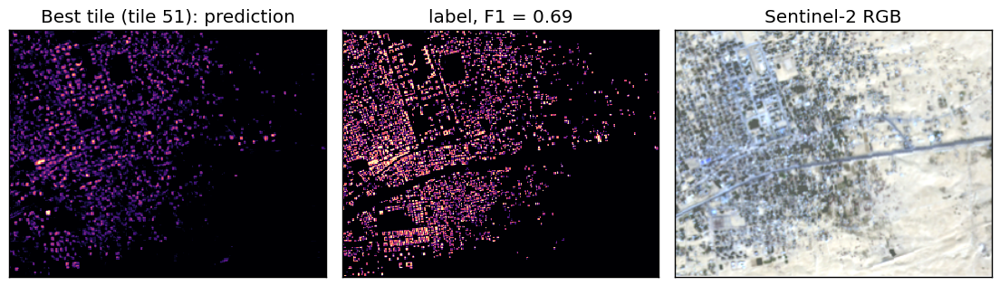

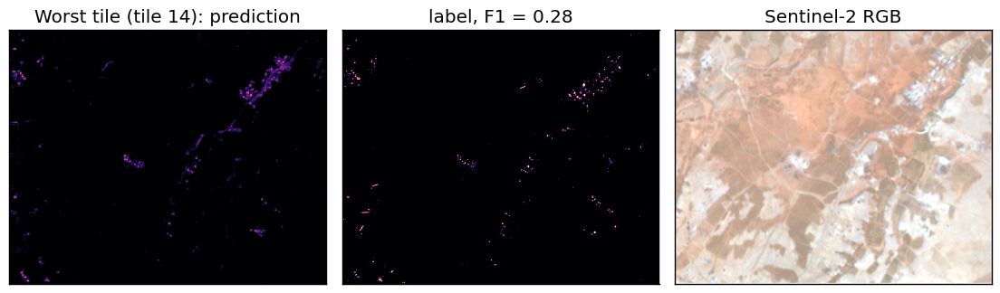

In [61]:
# S2b - Per-tile evaluation: predict each full test tile (as in "Inspect predictions" above)
tile_rows, tile_maps = [], {}
for t in sorted(int(k) for k in test_indices):
    s2 = beo.raster_to_array(os.path.join(data_folder, f"s2_{t}.tif"), filled=True, fill_value=0.0)
    lab = beo.raster_to_array(os.path.join(data_folder, f"label_{t}.tif"), filled=True, fill_value=0.0)
    lab = np.nan_to_num(np.clip(lab, 0.0, 100.0)).astype(np.float32)
    s2n, _statdict = beo.scaler_truncate(s2, 0.0, 10000.0)
    try:
        pr = beo.predict_array(s2n.astype(np.float32), predict, tile_size=PATCH_SIZE, n_offsets=3, merge_method="median")
    except (ValueError, RuntimeError) as e:
        print(f"Skipping tile {t}: {e}")
        continue
    m = evaluate(lab, pr)
    tile_rows.append({"tile": t, "size (px)": f"{lab.shape[0]} x {lab.shape[1]}",
                      "built-up share, label (%)": 100 * float(np.mean(lab > threshold)),
                      "mean label": float(lab.mean()), "mean prediction": float(np.mean(pr)),
                      "bias": float(np.mean(pr) - lab.mean()),
                      "RMSE": m["RMSE"], "MAE": m["MAE"], "F1": m["F1"], "IoU": m["IoU"]})
    tile_maps[t] = (np.squeeze(pr), np.squeeze(lab), render_s2_as_rgb(s2[:, :, [2, 1, 0]]))

per_tile = pd.DataFrame(tile_rows).set_index("tile").sort_values("F1", ascending=False)
display(per_tile.round(2))

# Show the best and the worst tile by F1, among tiles that actually contain buildings (>= 1 % built-up):
# on a tile with no buildings F1 is 0 by definition, which says nothing about the model.
with_buildings = per_tile[per_tile["built-up share, label (%)"] >= 1.0]
for title, t in [("Best tile", with_buildings.index[0]), ("Worst tile", with_buildings.index[-1])]:
    pr, lab, rgb = tile_maps[t]
    fig, (ax1, ax2, ax3) = custom_subplots(nrows=1, ncols=3, size=(14, 5))
    ax1.imshow(pr, vmin=0, vmax=100, cmap="magma", interpolation="nearest")
    ax1.set_title(f"{title} (tile {t}): prediction")
    ax2.imshow(lab, vmin=0, vmax=100, cmap="magma", interpolation="nearest")
    ax2.set_title(f"label, F1 = {per_tile.loc[t, 'F1']:.2f}")
    ax3.imshow(rgb)
    ax3.set_title("Sentinel-2 RGB")
    plt.show()

## S3 · Acting on the validation loss: early stopping, best checkpoint, LR on plateau

*Exercise: automate the decision. Implement early stopping, keep the best checkpoint rather than the last one, or reduce the learning rate on a plateau. Compare the test metrics before and after.*

We do all three at once. The same `SimpleConvNet` gets up to 25 epochs. The learning rate is halved whenever validation loss fails to improve for an epoch, training stops after 4 epochs without improvement, and the weights from the **best validation epoch** are restored before testing. Test tiles are never used for any of these decisions; they are only scored once at the end.

[S3] epoch 01  train=  194.44  val=   84.87  lr=1.0e-03  <- best so far
[S3] epoch 02  train=  165.13  val=   80.96  lr=1.0e-03  <- best so far
[S3] epoch 03  train=  151.03  val=  107.74  lr=1.0e-03
[S3] epoch 04  train=  145.34  val=   75.01  lr=1.0e-03  <- best so far
[S3] epoch 05  train=  138.09  val=  115.92  lr=1.0e-03
[S3] epoch 06  train=  135.04  val=   73.85  lr=1.0e-03  <- best so far
[S3] epoch 07  train=  132.48  val=   84.32  lr=1.0e-03
[S3] epoch 08  train=  129.22  val=   66.58  lr=1.0e-03  <- best so far
[S3] epoch 09  train=  126.61  val=  103.72  lr=1.0e-03
[S3] epoch 10  train=  124.99  val=   67.63  lr=1.0e-03
[S3] epoch 11  train=  119.17  val=   61.87  lr=5.0e-04  <- best so far
[S3] epoch 12  train=  117.73  val=   63.33  lr=5.0e-04
[S3] epoch 13  train=  117.47  val=   82.82  lr=5.0e-04
[S3] epoch 14  train=  113.95  val=   77.81  lr=2.5e-04
[S3] epoch 15  train=  113.54  val=   97.01  lr=2.5e-04
[S3] early stop: no improvement for 4 epochs.
[S3] restored the 

,epochs,RMSE,MAE,MSE,skill vs. zero,Precision,Recall,F1,IoU,time (s),energy (Wh),CO2eq (g),parameters
B,15.0,7.374,1.108,54.377,0.214,0.649,0.593,0.62,0.449,163.951,3.725,0.997,153985.0


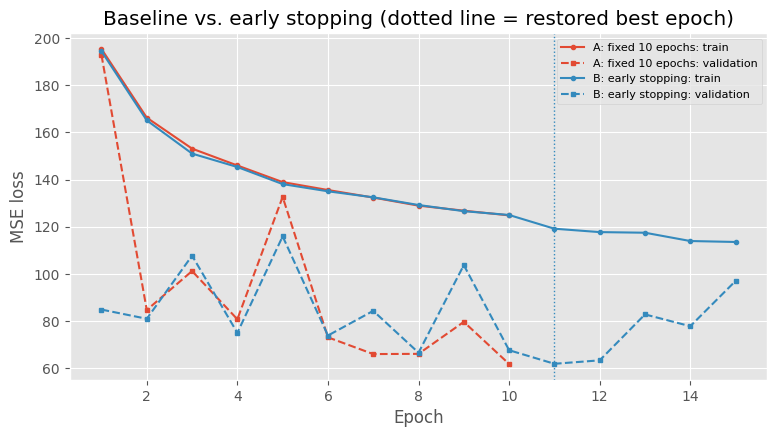

In [52]:
# S3 - Early stopping + best checkpoint + ReduceLROnPlateau
seed_everything()
net_es = SimpleConvNet(9, 0.0, 100.0)
with Measured("ex-S3-early-stopping") as meas_es:
    hist_es = train_model(net_es, ds_train_s2, ds_val_s2, epochs=25, patience=4, plateau=True, name="S3")
pred_es = predict_patches(net_es, x_te_s2)
display(log_experiment("B. SimpleConvNet + early stopping / best checkpoint / LR on plateau",
                       evaluate(y_te, pred_es), len(hist_es["train"]), meas_es, n_params(net_es)).to_frame("B").T)
plot_curves({"A: fixed 10 epochs": {"train": train_losses, "val": val_losses},
             "B: early stopping": hist_es},
            "Baseline vs. early stopping (dotted line = restored best epoch)")

## S4 · A better architecture: a small residual U-Net

*Exercise: the model used was very simple and had some key limitations. Can you identify them, and design a better architecture?*

**Limitations of `SimpleConvNet`:**

1. **A tiny receptive field.** It has four 3×3 convolutions at full resolution and no downsampling, so each output pixel sees only a 9×9-pixel (90 m) window. It can't use neighbourhood context: street grids, the difference between a single roof and a dense block, or what surrounds a field.
2. **No bottleneck and no skip connections.** It never builds multi-scale features, and it has no path to carry fine detail around deeper layers.
3. **The ReLU comes before the BatchNorm**, and there are no residual connections, so deeper versions would be harder to train.
4. **A hard clamp on the output** gives zero gradient for any pixel predicted below 0 or above 100, so those pixels stop learning.
5. **A plain MSE loss on a very unbalanced target** (~97% zeros) pulls predictions towards 0 and under-predicts dense areas (see S2).
6. **It only uses Sentinel-2**, even though SAR and terrain are available (see S5).

**Design:** a two-level U-Net (32 → 16 → 8 pixels) built from residual blocks (conv–BN–ReLU ×2 plus an identity or 1×1 shortcut). The bottleneck gives each output pixel a receptive field of roughly 40 pixels (~400 m), more than four times wider than the 9 pixels SimpleConvNet sees. Skip connections restore full-resolution detail in the decoder. It is trained with the same early-stopping recipe as S3, so the only thing that changes is the architecture.

ResUNet: 489,665 trainable parameters (2.0 MB as float32) vs. SimpleConvNet: 153,985
[S4] epoch 01  train=  193.86  val=   89.66  lr=1.0e-03  <- best so far
[S4] epoch 02  train=  161.69  val=   90.08  lr=1.0e-03
[S4] epoch 03  train=  145.95  val=   73.29  lr=1.0e-03  <- best so far
[S4] epoch 04  train=  137.65  val=   74.14  lr=1.0e-03
[S4] epoch 05  train=  131.79  val=   66.60  lr=1.0e-03  <- best so far
[S4] epoch 06  train=  127.52  val=   59.66  lr=1.0e-03  <- best so far
[S4] epoch 07  train=  123.95  val=   68.56  lr=1.0e-03
[S4] epoch 08  train=  119.58  val=   67.17  lr=1.0e-03
[S4] epoch 09  train=  111.45  val=   59.36  lr=5.0e-04  <- best so far
[S4] epoch 10  train=  109.14  val=   55.95  lr=5.0e-04  <- best so far
[S4] epoch 11  train=  106.33  val=   55.19  lr=5.0e-04  <- best so far
[S4] epoch 12  train=  104.07  val=   56.17  lr=5.0e-04
[S4] epoch 13  train=  101.67  val=   61.46  lr=5.0e-04
[S4] epoch 14  train=   97.64  val=   55.47  lr=2.5e-04
[S4] epoch 15  trai

,epochs,RMSE,MAE,MSE,skill vs. zero,Precision,Recall,F1,IoU,time (s),energy (Wh),CO2eq (g),parameters
C,15.0,6.147,1.08,37.781,0.454,0.466,0.892,0.612,0.441,334.356,7.431,1.989,489665.0


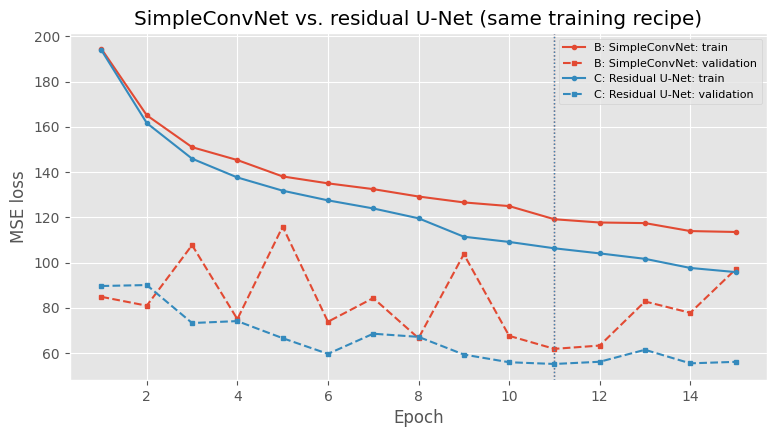

In [53]:
# S4 - A small residual U-Net
class ResBlock(nn.Module):
    """conv-BN-ReLU-conv-BN plus a shortcut (identity, or 1x1 conv when the width changes)."""
    def __init__(self, c_in, c_out):
        super().__init__()
        self.body = nn.Sequential(
            nn.Conv2d(c_in, c_out, 3, padding=1, bias=False), nn.BatchNorm2d(c_out), nn.ReLU(inplace=True),
            nn.Conv2d(c_out, c_out, 3, padding=1, bias=False), nn.BatchNorm2d(c_out))
        self.skip = nn.Identity() if c_in == c_out else nn.Conv2d(c_in, c_out, 1, bias=False)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x):
        return self.act(self.body(x) + self.skip(x))


class ResUNet(nn.Module):
    """Two-level U-Net: 32x32 -> 16x16 -> 8x8 (bottleneck) -> 16x16 -> 32x32, with skip connections."""
    def __init__(self, in_channels, output_min=0.0, output_max=100.0, width=32):
        super().__init__()
        w = width
        self.output_min, self.output_max = output_min, output_max
        self.enc1 = ResBlock(in_channels, w)
        self.enc2 = ResBlock(w, 2 * w)
        self.bottleneck = ResBlock(2 * w, 4 * w)
        self.pool = nn.MaxPool2d(2)
        self.up2 = nn.ConvTranspose2d(4 * w, 2 * w, 2, stride=2)
        self.dec2 = ResBlock(4 * w, 2 * w)
        self.up1 = nn.ConvTranspose2d(2 * w, w, 2, stride=2)
        self.dec1 = ResBlock(2 * w, w)
        self.head = nn.Conv2d(w, 1, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        b = self.bottleneck(self.pool(e2))
        d2 = self.dec2(torch.cat([self.up2(b), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))
        return torch.clamp(self.head(d1), self.output_min, self.output_max)


seed_everything()
net_unet = ResUNet(9)
print(f"ResUNet: {n_params(net_unet):,} trainable parameters "
      f"({n_params(net_unet) * 4 / 1e6:.1f} MB as float32) vs. SimpleConvNet: {n_params(model):,}")
with Measured("ex-S4-resunet") as meas_unet:
    hist_unet = train_model(net_unet, ds_train_s2, ds_val_s2, epochs=20, patience=4, plateau=True, name="S4")
pred_unet = predict_patches(net_unet, x_te_s2)
display(log_experiment("C. Residual U-Net, S2, early stopping", evaluate(y_te, pred_unet),
                       len(hist_unet["train"]), meas_unet, n_params(net_unet)).to_frame("C").T)
plot_curves({"B: SimpleConvNet": hist_es, "C: Residual U-Net": hist_unet},
            "SimpleConvNet vs. residual U-Net (same training recipe)")
torch.save(net_unet.state_dict(), os.path.join(FOLDER_PRED, "model_resunet.pt"))

## S5 · Multi-modality: Sentinel-2 + Sentinel-1 + DEM

*Exercise: how would you update the model to include SAR and terrain data? Could multi-modality reduce some of the shortcomings of the S2-only approach?*

The patches for all three sensors were already cut on the same grid and saved in `train.npz` / `val.npz` / `test.npz`. The simplest fusion is **early fusion**: stack the channels (9 S2 + 2 S1 + 4 DEM = 15) and change only the first convolution. Everything else is identical to baseline A (10 epochs, same seed), so any difference comes from the extra inputs.

Why it could help: C-band SAR responds to **geometry**, not colour. Vertical walls and the ground form "double-bounce" corner reflectors, so built-up areas are very bright in VV, even when their roofs have the same colour as the sand around them. SAR is also unaffected by clouds. The DEM adds slope and elevation context: steep ridges and the lowest delta land are rarely built on.

multi-modal patch shapes: (29760, 32, 32, 15) (862, 32, 32, 15) (2182, 32, 32, 15)
  train: 0.07 % of pixels have DEM nodata (-9999) -> set to 0
  val  : 0.16 % of pixels have DEM nodata (-9999) -> set to 0
  test : 0.12 % of pixels have DEM nodata (-9999) -> set to 0
  S2   range in training patches: [0.000, 1.000]
  S1   range in training patches: [0.000, 1.000]
  DEM  range in training patches: [-0.000, 1.000]
  mask range in training patches: [0.000, 1.000]
[S5] epoch 01  train=  174.60  val=  100.55  lr=1.0e-03  <- best so far
[S5] epoch 02  train=  143.74  val=   93.88  lr=1.0e-03  <- best so far
[S5] epoch 03  train=  132.14  val=   72.00  lr=1.0e-03  <- best so far
[S5] epoch 04  train=  128.55  val=   65.06  lr=1.0e-03  <- best so far
[S5] epoch 05  train=  123.10  val=   58.38  lr=1.0e-03  <- best so far
[S5] epoch 06  train=  120.51  val=   68.00  lr=1.0e-03
[S5] epoch 07  train=  118.20  val=   73.30  lr=1.0e-03
[S5] epoch 08  train=  115.94  val=   77.92  lr=1.0e-03
[S5] e

,epochs,RMSE,MAE,MSE,skill vs. zero,Precision,Recall,F1,IoU,time (s),energy (Wh),CO2eq (g),parameters
D,10.0,6.148,1.053,37.794,0.454,0.548,0.782,0.644,0.475,116.952,2.637,0.706,158017.0


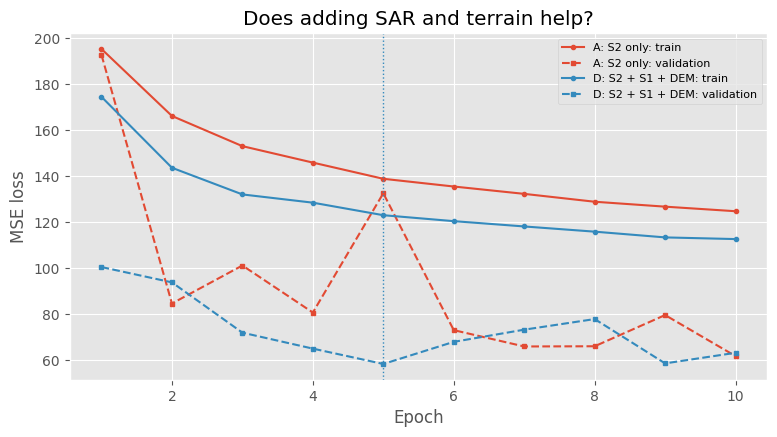

,"MAE, A (S2)","MAE, D (S2+S1+DEM)"
label density (m2/pixel),,
0 (no buildings),0.240000,0.270000
0-1,6.130000,10.820000
1-10,7.360000,11.360000
10-30,13.780000,14.470000
30-60,30.629999,24.309999
60-100,57.799999,45.459999


In [62]:
# S5 - Early fusion of S2 (9) + S1 (2) + DEM (4) = 15 input channels
experiments.pop("D. SimpleConvNet, S2 + S1 + DEM (15 channels)", None)   # from an earlier run without the DEM fix
MODALITIES = ("x_s2", "x_s1", "x_dem")
x_tr_mm, y_tr_mm = load_split("train", MODALITIES)
x_va_mm, y_va_mm = load_split("val", MODALITIES)
x_te_mm, y_te_mm = load_split("test", MODALITIES)
print("multi-modal patch shapes:", x_tr_mm.shape, x_va_mm.shape, x_te_mm.shape)

# Data-quality fix: the DEM tiles carry a -9999 nodata value that is not declared in the files, so
# raster_to_array does not mask it. Left in, a handful of -9999 values next to inputs in [0, 1] wreck
# the normalisation of the first layer. We set them to 0 (the notebook's convention for nodata) and
# add a 16th channel that tells the model where the DEM is missing.
dem_valid = []
for name, arr in [("train", x_tr_mm), ("val", x_va_mm), ("test", x_te_mm)]:
    bad = np.any(arr[..., 11:15] < -1.0, axis=-1, keepdims=True)
    print(f"  {name:<5}: {100 * bad.mean():.2f} % of pixels have DEM nodata (-9999) -> set to 0")
    arr[..., 11:15][np.broadcast_to(bad, arr[..., 11:15].shape)] = 0.0
    dem_valid.append((~bad).astype(np.float32))
x_tr_mm = np.concatenate([x_tr_mm, dem_valid[0]], axis=-1)
x_va_mm = np.concatenate([x_va_mm, dem_valid[1]], axis=-1)
x_te_mm = np.concatenate([x_te_mm, dem_valid[2]], axis=-1)
del dem_valid
for name, sl in [("S2", slice(0, 9)), ("S1", slice(9, 11)), ("DEM", slice(11, 15)), ("mask", slice(15, 16))]:
    print(f"  {name:<4} range in training patches: [{x_tr_mm[..., sl].min():.3f}, {x_tr_mm[..., sl].max():.3f}]")

ds_tr_mm, ds_va_mm = PatchDataset(x_tr_mm, y_tr_mm), PatchDataset(x_va_mm, y_va_mm)
del x_tr_mm, x_va_mm    # the datasets hold their own channel-first copies

seed_everything()
net_mm = SimpleConvNet(x_te_mm.shape[-1], 0.0, 100.0)   # 9 S2 + 2 S1 + 4 DEM + 1 DEM-valid mask = 16
with Measured("ex-S5-multimodal") as meas_mm:
    hist_mm = train_model(net_mm, ds_tr_mm, ds_va_mm, epochs=EPOCHS, name="S5")
pred_mm = predict_patches(net_mm, x_te_mm)
display(log_experiment("D. SimpleConvNet, S2 + S1 + DEM (+ nodata mask)", evaluate(y_te_mm, pred_mm),
                       len(hist_mm["train"]), meas_mm, n_params(net_mm)).to_frame("D").T)
plot_curves({"A: S2 only": {"train": train_losses, "val": val_losses}, "D: S2 + S1 + DEM": hist_mm},
            "Does adding SAR and terrain help?")

# Where does it help? Compare the density-bin bias of S2-only (A) and multi-modal (D).
yt_mm = y_te_mm.ravel()
cmp_rows = []
for b, name in enumerate(names):
    sel = (np.digitize(yt_mm, edges) - 1) == b
    if sel.sum():
        cmp_rows.append({"label density (m2/pixel)": name,
                         "MAE, A (S2)": np.abs(y_pred.ravel()[sel] - yt_mm[sel]).mean(),
                         "MAE, D (S2+S1+DEM)": np.abs(pred_mm.transpose(0, 3, 1, 2).ravel()[sel] - yt_mm[sel]).mean()})
display(pd.DataFrame(cmp_rows).set_index("label density (m2/pixel)").round(2))
del ds_tr_mm, ds_va_mm, x_te_mm

## S6 · A harder evaluation: a spatially contiguous test block

*Exercise: hold out a spatially contiguous block of tiles rather than a random scatter. Do the metrics drop?*

With a random scatter, almost every test tile has training tiles right next to it, which share the same land cover, building style and acquisition conditions. Here we find the tile centroids from their georeferencing and choose the **most compact group of 7 neighbouring tiles** as the test block, which is a whole district the model has never seen. 7 random tiles from the rest are used for validation. The model and recipe are the same as baseline A.

The two test sets contain different amounts of buildings, and MSE grows with density, so we also report **skill vs. zero**, `1 − MSE_model / MSE_always-0`. It measures how much of the error of a no-skill "no buildings anywhere" map the model removes, and it can be compared across test sets.

Training tiles span lon 25.18 to 35.11 E, lat 30.67 to 32.33 N
Full scene S2.tif is centred on lon 30.00 E, lat 31.17 N
block test tiles: [13, 14, 25, 26, 60, 64, 65] (all within 10.1 km of tile 60)
block val tiles:  [11, 23, 33, 47, 55, 68, 71]
median distance from a random-split test tile to its nearest training tile: 9.1 km
median distance from a block test tile to its nearest training tile:        13.3 km


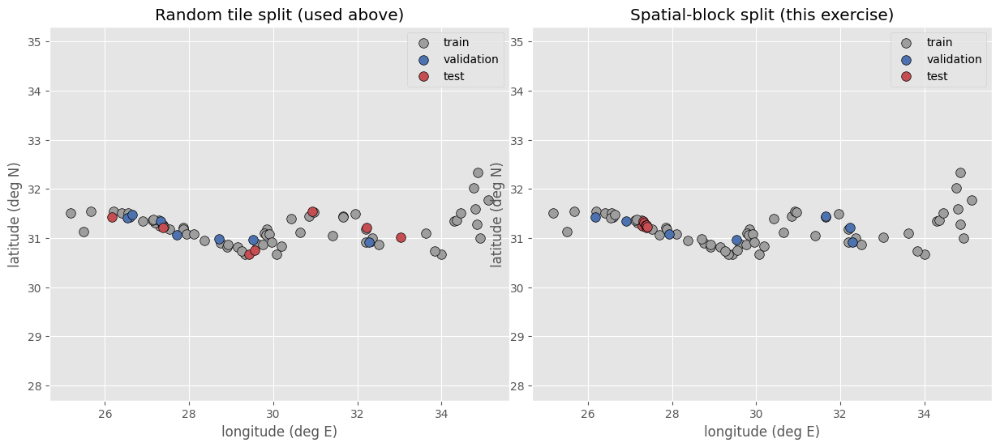

block split patches: train 30,240 | val 1,442 | test 1,122
  random-split test  built-up share  3.3 %, mean density 1.19 m2/px
  block test         built-up share  3.9 %, mean density 1.24 m2/px
[S6] epoch 01  train=  191.62  val=   64.49  lr=1.0e-03  <- best so far
[S6] epoch 02  train=  163.41  val=   64.53  lr=1.0e-03
[S6] epoch 03  train=  152.51  val=   61.18  lr=1.0e-03  <- best so far
[S6] epoch 04  train=  144.04  val= 1707.48  lr=1.0e-03
[S6] epoch 05  train=  137.26  val=   80.67  lr=1.0e-03
[S6] epoch 06  train=  134.64  val=  112.86  lr=1.0e-03
[S6] epoch 07  train=  131.97  val=   71.56  lr=1.0e-03
[S6] epoch 08  train=  127.85  val=   62.06  lr=1.0e-03
[S6] epoch 09  train=  125.85  val=   57.28  lr=1.0e-03  <- best so far
[S6] epoch 10  train=  123.79  val=   61.59  lr=1.0e-03
[ex-S6-spatial-block] 113.0 s, 2.54 Wh, 0.681 g CO2eq


,epochs,RMSE,MAE,MSE,skill vs. zero,Precision,Recall,F1,IoU,time (s),energy (Wh),CO2eq (g),parameters
E,10.0,5.765,1.098,33.235,0.517,0.42,0.726,0.532,0.362,112.979,2.544,0.681,153985.0


,skill vs. zero,RMSE,MAE,Precision,Recall,F1,IoU
A: random tile split,0.350,6.705,1.122,0.463,0.688,0.553,0.382
E: spatial-block split,0.517,5.765,1.098,0.420,0.726,0.532,0.362


In [63]:
# S6 - Spatial-block split
from osgeo import gdal, osr

WGS84 = osr.SpatialReference()
WGS84.ImportFromEPSG(4326)
WGS84.SetAxisMappingStrategy(osr.OAMS_TRADITIONAL_GIS_ORDER)


def tile_centroid(path):
    """Centroid of a raster in longitude/latitude (tiles may sit in different UTM zones)."""
    ds = gdal.Open(path)
    gt, w, h = ds.GetGeoTransform(), ds.RasterXSize, ds.RasterYSize
    src = osr.SpatialReference(wkt=ds.GetProjection())
    src.SetAxisMappingStrategy(osr.OAMS_TRADITIONAL_GIS_ORDER)
    ds = None
    x = gt[0] + gt[1] * w / 2 + gt[2] * h / 2
    y = gt[3] + gt[4] * w / 2 + gt[5] * h / 2
    lon, lat, _ = osr.CoordinateTransformation(src, WGS84).TransformPoint(x, y)
    return lon, lat


tile_ids = sorted(int(os.path.splitext(os.path.basename(p))[0].split("_")[1])
                  for p in glob(os.path.join(data_folder, "label_*.tif")))
centroids = np.array([tile_centroid(os.path.join(data_folder, f"s2_{t}.tif")) for t in tile_ids])   # (lon, lat)
scene_lon, scene_lat = tile_centroid(PATH_S2)
print(f"Training tiles span lon {centroids[:, 0].min():.2f} to {centroids[:, 0].max():.2f} E, "
      f"lat {centroids[:, 1].min():.2f} to {centroids[:, 1].max():.2f} N")
print(f"Full scene S2.tif is centred on lon {scene_lon:.2f} E, lat {scene_lat:.2f} N")

# Distances in km (equirectangular approximation, fine at this scale).
_lat0 = np.deg2rad(centroids[:, 1].mean())
xy_km = np.c_[centroids[:, 0] * 111.32 * np.cos(_lat0), centroids[:, 1] * 110.57]
dist = np.hypot(xy_km[:, None, 0] - xy_km[None, :, 0], xy_km[:, None, 1] - xy_km[None, :, 1])

# The most compact group of N_HOLDOUT neighbouring tiles becomes the test block.
radius = np.sort(dist, axis=1)[:, N_HOLDOUT - 1]
anchor = int(np.argmin(radius))
block_test = sorted(tile_ids[k] for k in np.argsort(dist[anchor])[:N_HOLDOUT])
rest = [t for t in tile_ids if t not in block_test]
block_val = sorted(int(t) for t in np.random.RandomState(SEED).choice(rest, N_HOLDOUT, replace=False))
block_train = [t for t in rest if t not in block_val]
print("block test tiles:", block_test, f"(all within {radius[anchor]:.1f} km of tile {tile_ids[anchor]})")
print("block val tiles: ", block_val)
print(f"median distance from a random-split test tile to its nearest training tile: "
      f"{np.median([min(dist[tile_ids.index(int(a)), tile_ids.index(b)] for b in tile_ids if b not in test_indices and b not in val_indices) for a in test_indices]):.1f} km")
print(f"median distance from a block test tile to its nearest training tile:        "
      f"{np.median([min(dist[tile_ids.index(a), tile_ids.index(b)] for b in block_train) for a in block_test]):.1f} km")

# Map both splits.
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
random_split = {t: ("test" if t in test_indices else "validation" if t in val_indices else "train") for t in tile_ids}
block_split = {t: ("test" if t in block_test else "validation" if t in block_val else "train") for t in tile_ids}
colors = {"train": "#9e9e9e", "validation": "#4c72b0", "test": "#c44e52"}
for ax, split, title in [(axes[0], random_split, "Random tile split (used above)"),
                         (axes[1], block_split, "Spatial-block split (this exercise)")]:
    for s in ["train", "validation", "test"]:
        pts = np.array([centroids[k] for k, t in enumerate(tile_ids) if split[t] == s])
        ax.scatter(pts[:, 0], pts[:, 1], s=70, c=colors[s], label=s, edgecolor="k", lw=0.5)
    ax.set_title(title)
    ax.set_xlabel("longitude (deg E)")
    ax.set_ylabel("latitude (deg N)")
    ax.set_aspect(1 / np.cos(_lat0), adjustable="datalim")
    ax.legend()
plt.show()


def build_patches(tiles, n_offsets=N_OFFSETS):
    """Read S2 + labels for the given tiles and cut them into patches, exactly as in the main pipeline."""
    xs, ys = [], []
    for t in tiles:
        s2 = beo.raster_to_array(os.path.join(data_folder, f"s2_{t}.tif"), filled=True, fill_value=0.0)
        lab = beo.raster_to_array(os.path.join(data_folder, f"label_{t}.tif"), filled=True, fill_value=0.0)
        lab = np.nan_to_num(np.clip(lab, 0.0, 100.0)).astype(np.float32)
        s2, _statdict = beo.scaler_truncate(s2, 0.0, 10000.0)
        xs.append(beo.array_to_patches(np.asarray(s2, dtype=np.float32), PATCH_SIZE, n_offsets=n_offsets))
        ys.append(beo.array_to_patches(lab, PATCH_SIZE, n_offsets=n_offsets))
    return np.concatenate(xs), np.concatenate(ys)


x_tr_b, y_tr_b = build_patches(block_train)
x_va_b, y_va_b = build_patches(block_val)
x_te_b, y_te_b = build_patches(block_test)
print(f"block split patches: train {len(x_tr_b):,} | val {len(x_va_b):,} | test {len(x_te_b):,}")
for name, y in [("random-split test", y_te), ("block test", y_te_b)]:
    print(f"  {name:<18} built-up share {100 * np.mean(y > threshold):4.1f} %, mean density {y.mean():.2f} m2/px")

ds_tr_b, ds_va_b = PatchDataset(x_tr_b, y_tr_b), PatchDataset(x_va_b, y_va_b)
del x_tr_b, x_va_b

seed_everything()
net_block = SimpleConvNet(9, 0.0, 100.0)
with Measured("ex-S6-spatial-block") as meas_block:
    hist_block = train_model(net_block, ds_tr_b, ds_va_b, epochs=EPOCHS, name="S6")
pred_block = predict_patches(net_block, x_te_b)
display(log_experiment("E. SimpleConvNet, S2, spatial-block split", evaluate(y_te_b, pred_block),
                       len(hist_block["train"]), meas_block, n_params(net_block)).to_frame("E").T)

cmp = pd.DataFrame({"A: random tile split": experiments["A. Baseline: SimpleConvNet, S2, random tile split"],
                    "E: spatial-block split": experiments["E. SimpleConvNet, S2, spatial-block split"]}).T
display(cmp[["skill vs. zero", "RMSE", "MAE", "Precision", "Recall", "F1", "IoU"]].round(3))
del ds_tr_b, ds_va_b

random tile split    seed  17: skill  0.387, F1 0.632
spatial-block split  seed  17: skill  0.133, F1 0.224
random tile split    seed  42: skill  0.244, F1 0.244
spatial-block split  seed  42: skill  0.387, F1 0.605
random tile split    seed   7: skill  0.460, F1 0.599
spatial-block split  seed   7: skill  0.401, F1 0.519
[ex-S6b-seed-repeats] 740.7 s, 16.68 Wh, 4.464 g CO2eq


,split,seed,epochs,best epoch,RMSE,MAE,MSE,skill vs. zero,Precision,Recall,F1,IoU
0,random tile split,17,11,7,6.511,1.080,42.398,0.387,0.533,0.777,0.632,0.462
1,spatial-block split,17,14,10,7.728,2.537,59.717,0.133,0.136,0.619,0.224,0.126
2,random tile split,42,7,3,7.232,2.089,52.298,0.244,0.140,0.934,0.244,0.139
3,spatial-block split,42,10,6,6.495,1.034,42.187,0.387,0.619,0.592,0.605,0.433
4,random tile split,7,15,13,6.111,1.100,37.350,0.460,0.469,0.828,0.599,0.427
5,spatial-block split,7,9,5,6.422,1.204,41.247,0.401,0.403,0.726,0.519,0.350


skill vs. zero          RMSE        Precision         \
                              mean    std   mean    std      mean    std   
split                                                                      
random tile split            0.364  0.110  6.618  0.568     0.381  0.211   
spatial-block split          0.307  0.151  6.882  0.734     0.386  0.242   

                    Recall            F1           IoU         
                      mean    std   mean    std   mean    std  
split                                                          
random tile split    0.846  0.080  0.492  0.215  0.343  0.178  
spatial-block split  0.645  0.071  0.449  0.200  0.303  0.159

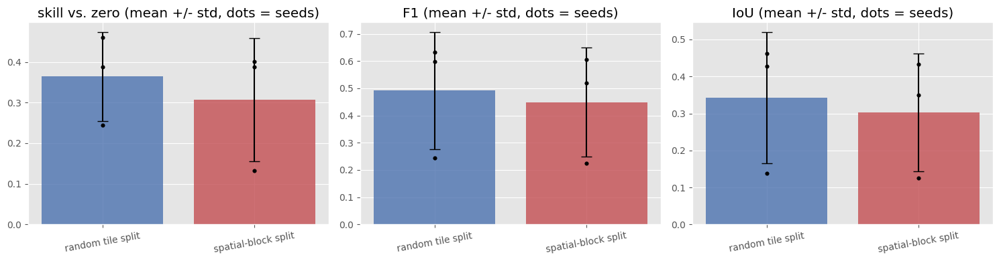

In [66]:
# S6b - Is the difference real? Repeat BOTH splits with 3 seeds.
# A single training run of this small model is noisy: the validation loss jumps between epochs
# (in one run it spiked above 1,700 for a single epoch), and an earlier run of exactly the cell above
# gave a *negative* skill on the block split. One run per split is therefore not enough to compare
# splits. Here each split is trained with 3 seeds using the more stable recipe from S3 (best
# checkpoint, LR on plateau, early stopping), and we compare mean +/- standard deviation.
import contextlib
import io

SEEDS = [SEED, 42, 7]
x_tr_b, y_tr_b = build_patches(block_train)
x_va_b, y_va_b = build_patches(block_val)
ds_tr_b, ds_va_b = PatchDataset(x_tr_b, y_tr_b), PatchDataset(x_va_b, y_va_b)
del x_tr_b, x_va_b

splits = {"random tile split": (ds_train_s2, ds_val_s2, x_te_s2, y_te),
          "spatial-block split": (ds_tr_b, ds_va_b, x_te_b, y_te_b)}
seed_rows = []
with Measured("ex-S6b-seed-repeats") as meas_seeds:
    for s in SEEDS:
        for split, (dtr, dva, xte, yte) in splits.items():
            seed_everything(s)
            net = SimpleConvNet(9, 0.0, 100.0)
            with contextlib.redirect_stdout(io.StringIO()):     # keep the output readable
                h = train_model(net, dtr, dva, epochs=15, patience=4, plateau=True, name=f"{split}-{s}")
            seed_rows.append({"split": split, "seed": s, "epochs": len(h["train"]), "best epoch": h["best_epoch"],
                              **evaluate(yte, predict_patches(net, xte))})
            print(f"{split:<20} seed {s:>3}: skill {seed_rows[-1]['skill vs. zero']:6.3f}, F1 {seed_rows[-1]['F1']:.3f}")
            del net

seed_runs = pd.DataFrame(seed_rows)
display(seed_runs.round(3))
metrics_cols = ["skill vs. zero", "RMSE", "Precision", "Recall", "F1", "IoU"]
seed_summary = seed_runs.groupby("split")[metrics_cols].agg(["mean", "std"])
display(seed_summary.round(3))

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, col in zip(axes, ["skill vs. zero", "F1", "IoU"]):
    for k, (split, grp) in enumerate(seed_runs.groupby("split")):
        ax.bar(k, grp[col].mean(), yerr=grp[col].std(), capsize=6, color=["#4c72b0", "#c44e52"][k], alpha=0.8)
        ax.scatter([k] * len(grp), grp[col], color="k", zorder=3, s=15)
    ax.set_xticks([0, 1])
    ax.set_xticklabels(sorted(splits), rotation=10)
    ax.set_title(f"{col} (mean +/- std, dots = seeds)")
plt.tight_layout()
plt.show()
del ds_tr_b, ds_va_b

## S7 · Data augmentation

*Exercise: port the augmentation from Part II (rotation, mirroring, CutMix) and watch what it does to the gap between the training and validation curves.*

`PatchDataset(..., augment=True)` (defined in S0) applies a random 90° rotation, random horizontal and vertical flips, and CutMix with probability 0.3. CutMix pastes an 8–16 pixel square from another patch into both the image **and** the label, so the target stays exact. Rotations and flips are safe here because building density doesn't depend on orientation. We don't use colour or brightness jitter, because the reflectance values are physical measurements. The model and recipe are the same as baseline A (10 epochs).

[S7] epoch 01  train=  204.56  val=  202.87  lr=1.0e-03  <- best so far
[S7] epoch 02  train=  181.91  val=   80.05  lr=1.0e-03  <- best so far
[S7] epoch 03  train=  168.53  val=   80.23  lr=1.0e-03
[S7] epoch 04  train=  163.55  val=  257.96  lr=1.0e-03
[S7] epoch 05  train=  157.04  val=  205.67  lr=1.0e-03
[S7] epoch 06  train=  153.84  val=   79.96  lr=1.0e-03  <- best so far
[S7] epoch 07  train=  150.46  val=   76.11  lr=1.0e-03  <- best so far
[S7] epoch 08  train=  148.85  val=  139.99  lr=1.0e-03
[S7] epoch 09  train=  145.44  val=   75.88  lr=1.0e-03  <- best so far
[S7] epoch 10  train=  144.69  val=   71.38  lr=1.0e-03  <- best so far
[ex-S7-augmentation] 128.7 s, 2.94 Wh, 0.787 g CO2eq


,epochs,RMSE,MAE,MSE,skill vs. zero,Precision,Recall,F1,IoU,time (s),energy (Wh),CO2eq (g),parameters
F,10.0,6.956,1.1,48.386,0.301,0.558,0.709,0.624,0.454,128.662,2.94,0.787,153985.0


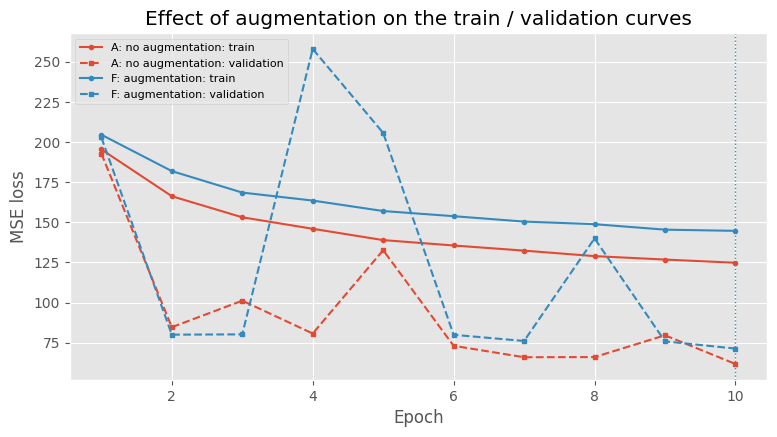

train - validation gap per epoch (positive = validation loss below training loss):
  A: [ 2.6 81.6 51.9 65.2  6.3 62.5 66.4 62.9 47.2 63. ]
  F: [  1.7 101.9  88.3 -94.4 -48.6  73.9  74.4   8.9  69.6  73.3]


In [56]:
# S7 - Training with augmentation
seed_everything()
ds_train_aug = PatchDataset(x_train, y_train, augment=True)
net_aug = SimpleConvNet(9, 0.0, 100.0)
with Measured("ex-S7-augmentation") as meas_aug:
    hist_aug = train_model(net_aug, ds_train_aug, ds_val_s2, epochs=EPOCHS, name="S7")
pred_aug = predict_patches(net_aug, x_te_s2)
display(log_experiment("F. SimpleConvNet, S2, rotation/flip/CutMix augmentation", evaluate(y_te, pred_aug),
                       len(hist_aug["train"]), meas_aug, n_params(net_aug)).to_frame("F").T)

plot_curves({"A: no augmentation": {"train": train_losses, "val": val_losses}, "F: augmentation": hist_aug},
            "Effect of augmentation on the train / validation curves")
gap = lambda h: np.array(h["train"]) - np.array(h["val"])
print("train - validation gap per epoch (positive = validation loss below training loss):")
print("  A:", np.round(gap({"train": train_losses, "val": val_losses}), 1))
print("  F:", np.round(gap(hist_aug), 1))
del ds_train_aug

## S8 · The carbon exercises

1. *More epochs or bigger patches: does accuracy improve in proportion to the energy?* We answer this from the experiments above, which differ in epochs and model size (see the S9 chart).
2. *GPU vs. CPU: which uses less energy overall?* Measured below with the same model, data and number of optimiser steps on both devices.
3. *Open `emissions.csv` and plot energy across runs.* Every `Measured(...)` block above became its own CodeCarbon run, so the file now has one row per experiment, with CPU, GPU and RAM energy split out.
4. *Compare with Part II.* Answered in S10.

In [57]:
# S8a - GPU vs CPU: same model, same batches, same number of optimiser steps
import math


def benchmark(dev, n_batches):
    seed_everything()
    net = SimpleConvNet(9, 0.0, 100.0).to(dev)
    opt = optim.Adam(net.parameters(), lr=LEARNING_RATE)
    loader = iter(DataLoader(ds_train_s2, batch_size=BATCH_SIZE, shuffle=True, num_workers=0))
    batches = [next(loader) for _ in range(n_batches)]    # load first, so only the compute is measured
    net.train()
    with Measured(f"ex-S8-benchmark-{dev.type}", power_secs=1) as meas:
        for xb, yb in batches:
            xb, yb = xb.to(dev), yb.to(dev)
            opt.zero_grad()
            nn.functional.mse_loss(net(xb), yb).backward()
            opt.step()
    return meas, n_batches


batches_per_epoch = math.ceil(len(ds_train_s2) / BATCH_SIZE)
runs = {"CPU (" + str(os.cpu_count()) + " vCPU)": benchmark(torch.device("cpu"), 100)}
if torch.cuda.is_available():
    runs["GPU (" + torch.cuda.get_device_name(0) + ")"] = benchmark(torch.device("cuda:0"), 1000)

bench = pd.DataFrame({
    name: {"steps measured": n, "s per epoch (extrapolated)": m.seconds / n * batches_per_epoch,
           "Wh per epoch (extrapolated)": m.wh / n * batches_per_epoch,
           "g CO2eq per epoch (extrapolated)": m.g / n * batches_per_epoch,
           "average power (W)": m.wh * 3600 / m.seconds if m.seconds > 0 else float("nan")}
    for name, (m, n) in runs.items()}).T
display(bench.round(3))
if len(bench) == 2:
    r = bench.iloc[0] / bench.iloc[1]
    print(f"The CPU draws {1 / r['average power (W)']:.2f}x the power of the GPU run, but takes "
          f"{r['s per epoch (extrapolated)']:.0f}x longer, so it uses {r['Wh per epoch (extrapolated)']:.1f}x the energy per epoch.")

[ex-S8-benchmark-cpu] 18.7 s, 0.24 Wh, 0.063 g CO2eq
[ex-S8-benchmark-cuda] 4.6 s, 0.10 Wh, 0.027 g CO2eq


,steps measured,s per epoch (extrapolated),Wh per epoch (extrapolated),g CO2eq per epoch (extrapolated),average power (W)
CPU (2 vCPU),100.0,348.117,4.380,1.172,45.292
GPU (Tesla T4),1000.0,8.473,0.189,0.051,80.489


The CPU draws 1.78x the power of the GPU run, but takes 41x longer, so it uses 23.1x the energy per epoch.


,project_name,duration,energy_consumed,cpu_energy,gpu_energy,ram_energy,emissions,country_name,cpu_model,gpu_model
0,ccai-flood-part1-people,348.592,9.234,0.876,6.475,1.884,2.471,The Netherlands,Intel(R) Xeon(R) CPU @ 2.00GHz,1 x Tesla T4
1,ex-S3-early-stopping,163.965,3.725,0.226,3.045,0.455,0.997,The Netherlands,Intel(R) Xeon(R) CPU @ 2.00GHz,1 x Tesla T4
2,ex-S4-resunet,334.366,7.431,0.358,6.146,0.928,1.989,The Netherlands,Intel(R) Xeon(R) CPU @ 2.00GHz,1 x Tesla T4
3,ex-S5-multimodal,116.292,2.619,0.164,2.133,0.323,0.701,The Netherlands,Intel(R) Xeon(R) CPU @ 2.00GHz,1 x Tesla T4
4,ex-S6-spatial-block,122.990,2.768,0.184,2.243,0.341,0.741,The Netherlands,Intel(R) Xeon(R) CPU @ 2.00GHz,1 x Tesla T4
5,ex-S7-augmentation,128.675,2.940,0.227,2.356,0.357,0.787,The Netherlands,Intel(R) Xeon(R) CPU @ 2.00GHz,1 x Tesla T4
6,ex-S8-benchmark-cpu,18.728,0.235,0.018,0.166,0.052,0.063,The Netherlands,Intel(R) Xeon(R) CPU @ 2.00GHz,1 x Tesla T4
7,ex-S8-benchmark-cuda,4.619,0.102,0.006,0.083,0.013,0.027,The Netherlands,Intel(R) Xeon(R) CPU @ 2.00GHz,1 x Tesla T4
8,ex-S5-multimodal,116.963,2.637,0.160,2.153,0.324,0.706,The Netherlands,Intel(R) Xeon(R) CPU @ 2.00GHz,1 x Tesla T4
9,ex-S6-spatial-block,112.990,2.544,0.148,2.083,0.313,0.681,The Netherlands,Intel(R) Xeon(R) CPU @ 2.00GHz,1 x Tesla T4


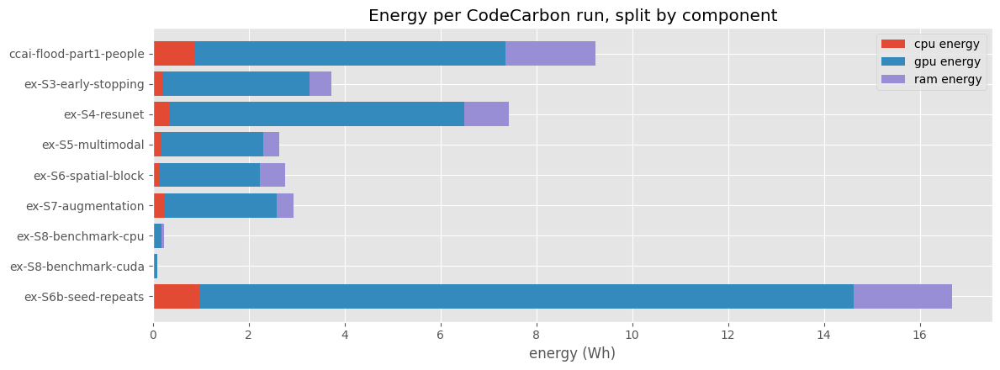

In [67]:
# S8b - Reading emissions.csv: one row per CodeCarbon run
emissions_csv = os.path.join(FOLDER_PRED, "emissions.csv")
log = pd.read_csv(emissions_csv)
cols = [c for c in ["project_name", "duration", "energy_consumed", "cpu_energy", "gpu_energy", "ram_energy",
                    "emissions", "country_name", "cpu_model", "gpu_model"] if c in log.columns]
log = log[cols].copy()
for c in ["energy_consumed", "cpu_energy", "gpu_energy", "ram_energy"]:
    if c in log.columns:
        log[c] = log[c] * 1000    # kWh -> Wh
if "emissions" in log.columns:
    log["emissions"] = log["emissions"] * 1000   # kg -> g
display(log.round(3))

parts = [c for c in ["cpu_energy", "gpu_energy", "ram_energy"] if c in log.columns]
fig, ax = plt.subplots(figsize=(12, 4.5))
bottom = np.zeros(len(log))
for c in parts:
    ax.barh(log["project_name"], log[c], left=bottom, label=c.replace("_", " "))
    bottom += log[c].to_numpy()
ax.set_xlabel("energy (Wh)")
ax.set_title("Energy per CodeCarbon run, split by component")
ax.invert_yaxis()
ax.legend()
plt.tight_layout()
plt.show()

## S9 · Summary: every experiment, accuracy vs. cost

All rows except E are scored on the same test tiles. E uses its own spatial-block test set, so compare it through the **skill vs. zero** column, not the raw errors.

,epochs,parameters,RMSE,MAE,MSE,skill vs. zero,Precision,Recall,F1,IoU,time (s),energy (Wh),CO2eq (g)
"A. Baseline: SimpleConvNet, S2, random tile split",10,"153,985",6.705192,1.121549,44.959598,0.350468,0.462552,0.688273,0.553276,0.382434,169.688541,3.620101,0.968819
B. SimpleConvNet + early stopping / best checkpoint / LR on plateau,15,"153,985",7.374100,1.108220,54.377350,0.214410,0.648949,0.593184,0.619814,0.449080,163.950662,3.725410,0.997002
"C. Residual U-Net, S2, early stopping",15,"489,665",6.146621,1.080287,37.780955,0.454178,0.465864,0.891517,0.611951,0.440872,334.355948,7.431331,1.988788
"E. SimpleConvNet, S2, spatial-block split",10,"153,985",5.764958,1.098004,33.234743,0.517414,0.419771,0.725610,0.531858,0.362266,112.978946,2.544095,0.680856
"F. SimpleConvNet, S2, rotation/flip/CutMix augmentation",10,"153,985",6.956002,1.100140,48.385968,0.300967,0.558027,0.708645,0.624381,0.453891,128.661577,2.939697,0.786728
"D. SimpleConvNet, S2 + S1 + DEM (+ nodata mask)",10,"158,017",6.147646,1.052708,37.793552,0.453996,0.547741,0.782128,0.644280,0.475231,116.952348,2.636617,0.705617


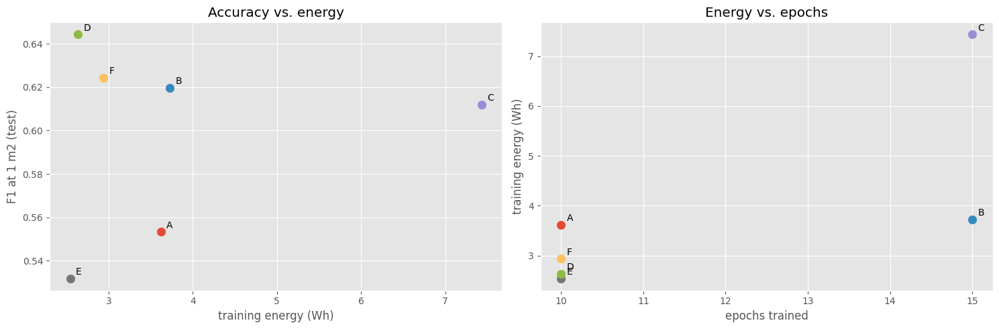

Saved: /content/CCAI_FLOODS_TUTORIAL_DATA_PREDICTIONS/experiment_summary.csv


In [68]:
# S9 - Summary table and accuracy-vs-energy chart
summary = pd.DataFrame(experiments).T
summary = summary[["epochs", "parameters", "RMSE", "MAE", "MSE", "skill vs. zero", "Precision", "Recall", "F1", "IoU",
                   "time (s)", "energy (Wh)", "CO2eq (g)"]].astype(float)
summary.to_csv(os.path.join(FOLDER_PRED, "experiment_summary.csv"))
display(summary.style.format(precision=3).format({"epochs": "{:.0f}", "parameters": "{:,.0f}"})
        .highlight_max(subset=["skill vs. zero", "F1", "IoU"], color="#2e7d3240")
        .highlight_min(subset=["RMSE", "MAE"], color="#2e7d3240"))

fig, (a1, a2) = plt.subplots(1, 2, figsize=(15, 5))
for name, row in summary.iterrows():
    tag = name.split(".")[0]
    a1.scatter(row["energy (Wh)"], row["F1"], s=80)
    a1.annotate(tag, (row["energy (Wh)"], row["F1"]), textcoords="offset points", xytext=(6, 4))
    a2.scatter(row["epochs"], row["energy (Wh)"], s=80)
    a2.annotate(tag, (row["epochs"], row["energy (Wh)"]), textcoords="offset points", xytext=(6, 4))
a1.set_xlabel("training energy (Wh)")
a1.set_ylabel("F1 at 1 m2 (test)")
a1.set_title("Accuracy vs. energy")
a2.set_xlabel("epochs trained")
a2.set_ylabel("training energy (Wh)")
a2.set_title("Energy vs. epochs")
plt.tight_layout()
plt.show()
print("Saved:", os.path.join(FOLDER_PRED, "experiment_summary.csv"))

<a name="written-answers"></a>
## S10 · Written answers

The numbers below come from the run saved in this notebook. GPU training is not bit-for-bit deterministic, so a re-run gives slightly different values. S6b shows that differences between single runs can be large.

### 1. What were the limitations of the simple model, and can a better architecture beat it?

The limitations are listed in S4: a 9×9-pixel receptive field, no bottleneck or skip connections, a hard clamp, and plain MSE on a ~97%-zero target. S1 and S2 show them in numbers:

- **Strong pull towards zero.** Pixels with 60–100 m² of buildings are predicted at about 22 m² on average (bias −58 m²). These pixels are only 0.7% of the test set but cause **62% of all squared error**.
- **Dense areas are under-predicted and sparse areas over-predicted.** Empty land is almost perfect (MAE 0.24 m²), while pixels with 0–10 m² are over-predicted. The model has learned "roughly built-up or not", not how much.
- **The clamp hides pixels.** **29% of built-up test pixels are predicted as exactly 0**, so no threshold can ever find them: recall tops out at 0.71 (S1).

The **residual U-Net (C)** has a bottleneck and skip connections (≈490 k parameters, 2 MB). It improves the regression the most: MSE falls from 45.0 to **37.8** and skill vs. zero rises from 0.35 to **0.45**. Recall jumps to **0.89**, because wider context lets it find built-up pixels the simple model zeroes out. Its F1 (0.61) is similar to B's, because its precision stays low, and it needed about twice the energy of B (7.4 Wh vs. 3.7 Wh). Next steps: a loss that handles the imbalance (for example Huber or a density-weighted MSE, or a joint "built-up?" + "how much?" head), and a softplus or sigmoid output instead of a hard clamp.

### 2. Could multi-modality reduce the shortcomings of S2 only?

Yes, and it was the **cheapest improvement of all**. After fixing a data bug (undeclared `-9999` nodata in the DEM, see S5 and the datasheet), S2 + S1 + DEM (**D**) got the best F1 (**0.644**) and IoU (**0.475**) and the joint-best skill (0.454). It used the same 10 epochs as A and only 2.6 Wh. Its error drops exactly where S2 struggles most: MAE on 30–60 m² pixels falls from 30.6 to 24.3, and on 60–100 m² pixels from 57.8 to 45.5. This fits the physics: SAR double-bounce responds to building geometry, which reflectance alone can't see. The cost is more false positives in sparse pixels (MAE on 0–10 m² rises), probably from bright SAR returns off non-building structures. Remember too that the S1 and S2 tiles are not always from the same date.

### 3. The threshold sweep: which operating point for evacuation, and which for reconstruction costing?

Average precision is **0.505**, 15× the no-skill level of 0.033.

- **Evacuation planning:** a missed building can mean people who never get warned, so use the **lowest possible threshold** (maximum recall). With this model that only reaches **recall 0.71 at precision 0.44**, because of the clamped zeros. That is a strong argument against using the S2-only model for evacuation. The U-Net (recall 0.89) or the fused model is a better base.
- **Reconstruction costing:** false alarms inflate budgets, so use a **high threshold**. Precision 0.80 needs a threshold of about 24 m² and finds only 20% of built-up pixels. For costing, the better answer is to use the **regression output summed over an area**, calibrated against surveyed damage, rather than a binary mask.
- The **maximum-F1** point (threshold ≈ 3.8 m², F1 0.565) is a reasonable default for a general-purpose map.

### 4. Where did the model do well, and where not?

It does well on **empty land** (desert, sea, farmland: MAE 0.24 m²) and on **detecting clearly urban tiles**. The best tile, 51 (26% built-up), has F1 0.69. It does poorly on:

- **how much** is built (dense cores are under-predicted by ~58 m² per pixel);
- **sparse and rural tiles** (tiles 14, 11 and 71 have F1 ≤ 0.28), where a few scattered buildings are missed or confused with bright soil;
- **small, isolated structures**, which are below what a 10 m pixel can resolve.

Metrics also mislead here. In this run the model's **accuracy (0.964) is lower than the "always predict 0" baseline (0.967)**, even though the model is clearly useful: this is the unbalanced-dataset trap in action.

### 5. Early stopping, best checkpoint and LR on plateau: before vs. after

B stopped after 15 epochs and restored epoch 11. F1 improved from 0.553 to **0.620** and IoU from 0.382 to **0.449**, mainly through much higher precision (0.46 → 0.65). But MSE got *worse* (45.0 → 54.4). The validation set (7 tiles, 862 patches, only 5.6% built-up) is small and noisy: validation loss jumps by ±30–50% between epochs. So "best epoch" is partly luck. Improvements would be more validation tiles, choosing the checkpoint on a smoothed or averaged validation loss, and repeating runs with several seeds (as in S6b).

### 6. A spatially contiguous test block: do the metrics drop?

On average, **yes, but less than a single run suggests, and the noise is as large as the effect.** Over 3 seeds, skill vs. zero is **0.36 ± 0.11** on the random split and **0.31 ± 0.15** on the block split. F1 is **0.49 ± 0.22** vs. **0.45 ± 0.20**, and recall **0.85 ± 0.08** vs. **0.65 ± 0.07**. The clearest drop is in **recall**: in an unseen district the model finds far fewer of the buildings. Single runs of the same code gave block-split skills from **−0.28 to +0.52**, so any one run can "prove" either conclusion. Two further caveats:

- The whole dataset is small and spread out. The tiles span **25.2°E to 35.1°E**, from Egypt's western coast to the Levant, not only Alexandria. Even the random split's test tiles are a median 9 km from the nearest training tile (13 km for the block).
- So the ~0.06 drop in skill and ~0.20 drop in recall are the most honest estimate here of how much of the score was regional similarity rather than skill. It should still be treated as optimistic for a truly new city.

### 7. Augmentation: what happens to the train/validation gap?

Rotations, flips and CutMix make the training data harder to fit: the final training loss rises from 124.8 to 144.7. Held-out results improve: F1 0.553 → **0.624**, IoU 0.382 → **0.454**, precision 0.46 → 0.56. MSE rises slightly (45.0 → 48.4). The "gap" is not a clean overfitting signal in this dataset. Validation loss is *below* training loss in almost every epoch, simply because the validation tiles have far fewer buildings (label variance 103 vs. 320, see the check under *Be critical about metrics*). With augmentation the validation curve is also spikier. The test-set comparison is the more trustworthy evidence.

### 8. Exporting to QGIS

All nine full-scene predictions are written as georeferenced GeoTIFFs (`prediction_0.tif` … `prediction_8.tif`) next to `model_01.pt`, `model_resunet.pt`, `emissions.csv` and `experiment_summary.csv` in `/content/CCAI_FLOODS_TUTORIAL_DATA_PREDICTIONS/`. Uncomment the download cell to open them in QGIS, and load them over a basemap. The pattern seen in S2 is visible there too: dense cores come out too dark, and bright bare ground is sometimes flagged.

### 9. The carbon exercises

- **More epochs vs. accuracy:** the relationship is not proportional. B used 1.5× the epochs of A for about the same energy (3.7 vs. 3.6 Wh; its epochs were cheaper) and raised F1 by 0.07. C doubled the energy again (7.4 Wh) for no further F1 gain, though with better regression skill. D gave the best F1 for the *least* energy (2.6 Wh). **Better inputs beat more compute.**
- **Larger patch size:** for `SimpleConvNet` it would barely change energy or accuracy. An epoch processes roughly the same number of pixels (the same tiles, cut differently), and a 9-pixel receptive field can't use extra context. Patch size only pays off together with an architecture that has a large receptive field, like the U-Net.
- **GPU vs. CPU:** the CPU draws *less* power (45 W vs. 80 W) but is **41× slower**, so a CPU epoch would use **4.4 Wh vs. 0.19 Wh: 23× more energy**. Speed wins. The CPU figure also includes the idle T4's draw, which CodeCarbon still counts. That is itself a reminder to release GPUs you aren't using.
- **`emissions.csv`:** in every run the **GPU dominates** (about 70–85% of energy), RAM is second and CPU smallest (S8b). This run was placed on a **Dutch grid (268 g CO₂eq/kWh)**, and the whole main notebook cost **9.2 Wh / 2.5 g CO₂eq**. **Inference over the scene (4.6 Wh) cost more than training (3.6 Wh)**, as *Reading the number* predicts.
- **Part II comparison:** the models are nearly identical, and the number of input channels (2 for S1 vs. 9 for S2) only changes the first convolution, a few percent of the compute. Any difference in footprint therefore comes from **how many patches are processed per epoch, how many epochs, the augmentation on the CPU, and which GPU and grid the session lands on**. Comparisons across sessions should use energy (Wh), not CO₂, because the grid can change between runs.

### Overall takeaway

The biggest improvements came from **better data** (fixing the DEM nodata and adding SAR: +0.09 F1 at the lowest energy) and **evaluating honestly** (skill scores, multiple seeds, spatial holdouts), not from more compute. Two findings matter most for use in the field: the S2-only model **can't recover about 29% of built-up pixels at any threshold**, and **single-run metrics vary as much as the effects being measured.** Any map from this model is a first look at where to search, never a decision.

<a name="references"></a>
# References

* The human cost of disasters: an overview of the last 20 years: https://www.undrr.org/publication/human-cost-disasters-overview-last-20-years-2000-2019
* Bentivoglio, R., Isufi, E., Jonkman, S. N., and Taormina, R.: Deep learning methods for flood mapping: a review of existing applications and future research directions, Hydrol. Earth Syst. Sci., 26, 4345–4378, https://doi.org/10.5194/hess-26-4345-2022, 2022
* Sentinel-1 data products, https://sentinels.copernicus.eu/web/sentinel/missions/sentinel-1/data-products
* Sentinel-2 data products, https://sentinels.copernicus.eu/web/sentinel/missions/sentinel-2/data-products
* COP-DEM, https://spacedata.copernicus.eu/collections/copernicus-digital-elevation-model
* Alexandria — People and Water dataset (the data used in this tutorial), https://doi.org/10.5281/zenodo.7937444
* Google Open Buildings, https://sites.research.google/open-buildings/
* Mitchell, M. et al. (2019). *Model Cards for Model Reporting.* Proceedings of FAT* 2019. https://arxiv.org/abs/1810.03993
* Gebru, T. et al. (2021). *Datasheets for Datasets.* Communications of the ACM, 64(12). https://arxiv.org/abs/1803.09010
* Courty, B. et al. (2024). *CodeCarbon: Estimate and Track Carbon Emissions from Machine Learning Computing.* https://github.com/mlco2/codecarbon · Documentation: https://docs.codecarbon.io/
* Lacoste, A. et al. (2019). *Quantifying the Carbon Emissions of Machine Learning.* https://arxiv.org/abs/1910.09700 · ML CO2 Impact calculator: https://mlco2.github.io/impact/
* Strubell, E., Ganesh, A., McCallum, A. (2019). *Energy and Policy Considerations for Deep Learning in NLP.* ACL 2019. https://arxiv.org/abs/1906.02243
* Luccioni, A.S., Viguier, S., Ligozat, A.-L. (2023). *Estimating the Carbon Footprint of BLOOM, a 176B Parameter Language Model.* JMLR 24. https://arxiv.org/abs/2211.02001
* Rolnick, D. et al. (2022). *Tackling Climate Change with Machine Learning.* ACM Computing Surveys, 55(2). https://arxiv.org/abs/1906.05433
* Copernicus Emergency Management Service (rapid mapping): https://emergency.copernicus.eu/
* UNOSAT (United Nations Satellite Centre): https://unosat.org/
* WorldPop population data: https://www.worldpop.org/
* GHSL — Global Human Settlement Layer: https://ghsl.jrc.ec.europa.eu/


